# Data Understanding

**Problem Statement**

Sebagai marketplace besar, Olist menghadapi tantangan bagaimana penjualan, perilaku pelanggan, dan performa produk berkembang seiring waktu dan di berbagai wilayah. Perusahaan perlu menganalisis:
1. Perubahan total revenue, volume order, dan tren penjualan berdasarkan waktu dan musim;

2. Perbedaan popularitas dan profitabilitas antar kategori produk serta dampaknya terhadap margin dan strategi harga;

3. Faktor-faktor yang memengaruhi loyalitas pelanggan, termasuk review score, lokasi, dan kategori produk;

4. Pengaruh rating dan ulasan pelanggan terhadap performa produk serta implikasinya terhadap strategi retensi dan promosi;

5. Distribusi pelanggan berdasarkan geolokasi, termasuk area dengan konsentrasi dan retensi pelanggan tertinggi;

***Bagaimana Olist dapat meningkatkan profitabilitas, mempertahankan pelanggan, dan mengoptimalkan strategi pemasaran berdasarkan penjualan, perilaku pelanggan, dan performa produk di berbagai lokasi dan kategori?***


In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import warnings
warnings.filterwarnings('ignore')

## Load All Dataset

informasi dataste :
- Data pelanggan (olist_customers_dataset), berisi informasi identitas dan lokasi pelanggan.

- Data pesanan (olist_orders_dataset), mencatat setiap transaksi dan status pengiriman.

- Data item pesanan (olist_order_items_dataset), mendetailkan produk, harga, dan ongkos kirim pada tiap pesanan.

- Data pembayaran (olist_order_payments_dataset), memuat metode dan nilai transaksi.

- Data ulasan (olist_order_reviews_dataset), menggambarkan tingkat kepuasan pelanggan terhadap pesanan.

- Data produk (olist_products_dataset), berisi deskripsi dan karakteristik fisik produk.

- Data geolokasi (olist_geolocation_dataset), menyediakan koordinat geografis berdasarkan kode pos.

- Data terjemahan kategori (product_category_name_translation.csv), yang menerjemahkan nama kategori produk dari bahasa Portugis ke bahasa Inggris.

In [ ]:
#customer dataset
url = "https://github.com/vidaaashafy/FinalProject/raw/main/olist_customers_dataset.csv.gz"
df_customers = pd.read_csv(url)
#geolocation dataset
url = 'https://github.com/vidaaashafy/FinalProject/raw/main/olist_geolocation_dataset.csv.gz'
df_geolocation = pd.read_csv(url)
#order item
url = 'https://github.com/vidaaashafy/FinalProject/raw/main/olist_order_items_dataset.csv.gz'
df_order_items = pd.read_csv(url)
#review dataset
url = 'https://github.com/vidaaashafy/FinalProject/raw/main/olist_order_reviews_dataset.csv.gz'
df_review = pd.read_csv(url)
#order
url = 'https://github.com/vidaaashafy/FinalProject/raw/main/olist_orders_dataset.csv.gz'
df_orders = pd.read_csv(url)
#payment
url = 'https://github.com/vidaaashafy/FinalProject/raw/main/olist_order_payments_dataset.csv.gz'
df_payment = pd.read_csv(url)
#product
url = 'https://github.com/vidaaashafy/FinalProject/raw/main/olist_products_dataset.csv.gz'
df_product = pd.read_csv(url)
#product translation
url = 'https://github.com/vidaaashafy/FinalProject/raw/main/product_category_name_translation.csv.gz'
df_category = pd.read_csv(url)


In [ ]:
df_customers.shape

(99441, 5)

In [ ]:
df_customers.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 99441 entries, 0 to 99440
Data columns (total 5 columns):
 #   Column                    Non-Null Count  Dtype 
---  ------                    --------------  ----- 
 0   customer_id               99441 non-null  object
 1   customer_unique_id        99441 non-null  object
 2   customer_zip_code_prefix  99441 non-null  int64 
 3   customer_city             99441 non-null  object
 4   customer_state            99441 non-null  object
dtypes: int64(1), object(4)
memory usage: 3.8+ MB


In [ ]:
display(df_customers.describe(), df_customers.describe(include='object'))

,customer_zip_code_prefix
count,99441.000000
mean,35137.474583
std,29797.938996
min,1003.000000
25%,11347.000000
50%,24416.000000
75%,58900.000000
max,99990.000000


,customer_id,customer_unique_id,customer_city,customer_state
count,99441,99441,99441,99441
unique,99441,96096,4119,27
top,274fa6071e5e17fe303b9748641082c8,8d50f5eadf50201ccdcedfb9e2ac8455,sao paulo,SP
freq,1,17,15540,41746


- Penyebaran pelanggan sangat luas secara geografis di seluruh Brasil.

- Distribusi kode pos menunjukkan bahwa pelanggan Olist tidak terkonsentrasi di kota besar saja, tapi menyebar hingga ke pinggiran atau rural area.

- Nilai mean lebih tinggi dari median → ada kemungkinan outlier dari area kode pos tinggi (misalnya di tenggara Brasil seperti São Paulo atau Porto Alegre).

In [ ]:
df_customers.isnull().sum()

,0
customer_id,0
customer_unique_id,0
customer_zip_code_prefix,0
customer_city,0
customer_state,0


In [ ]:
df_customers.duplicated().sum()

np.int64(0)

**Geolocation Dataset**

In [ ]:
df_geolocation.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1000163 entries, 0 to 1000162
Data columns (total 5 columns):
 #   Column                       Non-Null Count    Dtype  
---  ------                       --------------    -----  
 0   geolocation_zip_code_prefix  1000163 non-null  int64  
 1   geolocation_lat              1000163 non-null  float64
 2   geolocation_lng              1000163 non-null  float64
 3   geolocation_city             1000163 non-null  object 
 4   geolocation_state            1000163 non-null  object 
dtypes: float64(2), int64(1), object(2)
memory usage: 38.2+ MB


In [ ]:
df_geolocation.describe()

,geolocation_zip_code_prefix,geolocation_lat,geolocation_lng
count,1.000163e+06,1.000163e+06,1.000163e+06
mean,3.657417e+04,-2.117615e+01,-4.639054e+01
std,3.054934e+04,5.715866e+00,4.269748e+00
min,1.001000e+03,-3.660537e+01,-1.014668e+02
25%,1.107500e+04,-2.360355e+01,-4.857317e+01
50%,2.653000e+04,-2.291938e+01,-4.663788e+01
75%,6.350400e+04,-1.997962e+01,-4.376771e+01
max,9.999000e+04,4.506593e+01,1.211054e+02


**geolocation_zip_code_prefix**

- Jumlah baris (count): 1.000.163 → jauh lebih besar dari jumlah customer → berarti banyak duplikasi lokasi (bisa karena 1 kode pos mewakili banyak titik lokasi).

- Mean: 36.574 → menunjukkan sebaran dominan ada di kode pos menengah–tinggi (wilayah tengah–selatan Brasil).

- Std: 30.549 → standar deviasi tinggi → penyebaran lokasi sangat luas.

- Min - Max: dari 1001 hingga 99990 → menunjukkan kode pos dari seluruh wilayah Brasil tercakup.

**geolocation_lat dan geolocation_lng (Latitude & Longitude)**

- Latitude (Lat) rata-rata: -21.17 → berada di belahan bumi selatan (sebagian besar wilayah Brasil).

- Longitude (Lng) rata-rata: -46.39 → berada di bagian barat (Amerika Selatan).

**Distribusi nilai cukup lebar:**

- Lat min: -36.60 (ujung selatan Brasil), max: +45.06 (outlier, kemungkinan error).

- Lng min: -101.46 hingga max: +121.10 → ini outlier karena di luar wilayah Brasil.


batas lat & long brazil
| Koordinat                      | Nilai                                                  |
| ------------------------------ | ------------------------------------------------------ |
| **Latitude (Utara – Selatan)** | dari **+5.27°N** (utara) sampai **-33.75°S** (selatan) |
| **Longitude (Barat – Timur)**  | dari **-73.99°W** sampai **-34.79°W**                  |


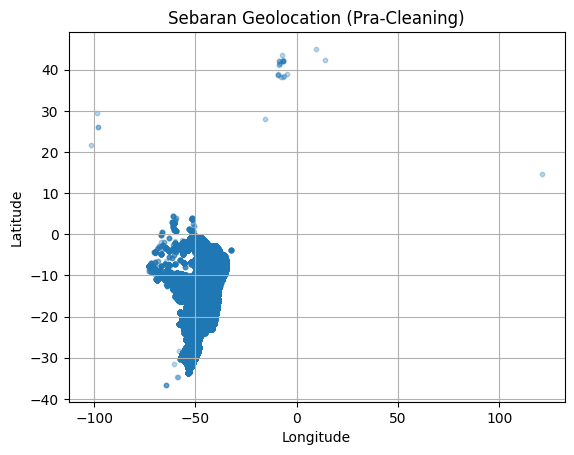

In [ ]:
import matplotlib.pyplot as plt
plt.scatter(df_geolocation['geolocation_lng'], df_geolocation['geolocation_lat'], alpha=0.3, s=10)
plt.title("Sebaran Geolocation (Pra-Cleaning)")
plt.xlabel("Longitude")
plt.ylabel("Latitude")
plt.grid(True)
plt.show()

**1. Banyak Kota Tercatat di Luar Wilayah Geografis Brazil**

- Beberapa kota (misalnya: Santa Lucia do Piai, Santa Rosa, Porto Trombetas) memiliki nilai latitude/longitude yang menunjukkan lokasi di luar Brazil (misalnya: Filipina, Spanyol, Argentina).

- Koordinat seperti latitude = 45, longitude = 121 adalah anomali, karena Brazil berada di:

Latitude: ~-33 sampai +5

Longitude: ~-74 sampai -34

**2. Nama Kota dan State Masih Berasal dari Brazil**

- Meskipun koordinatnya tidak valid, nama kota dan state seperti Santa Rosa (RS), Ilha dos Valadares (PR) tetap mencerminkan wilayah Brazil.

- Ini menunjukkan kemungkinan kesalahan input koordinat (mismatch zip code → geolocation).

In [ ]:
df_geolocation.isnull().sum()

,0
geolocation_zip_code_prefix,0
geolocation_lat,0
geolocation_lng,0
geolocation_city,0
geolocation_state,0


In [ ]:
df_geolocation.duplicated().sum()

np.int64(261831)

**2. Order Item Dataset**

In [ ]:
df_order_items.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 112650 entries, 0 to 112649
Data columns (total 7 columns):
 #   Column               Non-Null Count   Dtype  
---  ------               --------------   -----  
 0   order_id             112650 non-null  object 
 1   order_item_id        112650 non-null  int64  
 2   product_id           112650 non-null  object 
 3   seller_id            112650 non-null  object 
 4   shipping_limit_date  112650 non-null  object 
 5   price                112650 non-null  float64
 6   freight_value        112650 non-null  float64
dtypes: float64(2), int64(1), object(4)
memory usage: 6.0+ MB


In [ ]:
df_order_items.describe()

,order_item_id,price,freight_value
count,112650.000000,112650.000000,112650.000000
mean,1.197834,120.653739,19.990320
std,0.705124,183.633928,15.806405
min,1.000000,0.850000,0.000000
25%,1.000000,39.900000,13.080000
50%,1.000000,74.990000,16.260000
75%,1.000000,134.900000,21.150000
max,21.000000,6735.000000,409.680000


**1. order_item_id**

- Median dan mayoritas = 1, menunjukkan bahwa kebanyakan order hanya terdiri dari satu item.

Namun, nilai maksimum mencapai 21, artinya ada beberapa pesanan yang mencakup hingga 21 produk berbeda dalam satu transaksi (biasanya pembelian grosir atau bundling).

**2. price**

- Rata-rata harga produk per item adalah 120 BRL, namun standar deviasi sangat tinggi (~183 BRL), menunjukkan variabilitas harga yang tinggi.

- Terdapat produk sangat mahal hingga 6.735 BRL, menunjukkan adanya produk high-end atau bundle.

- Kuartil bawah (Q1: 39.9 BRL) dan median (Q2: 74.99 BRL) menegaskan bahwa setengah dari produk dijual dengan harga di bawah 75 BRL.

3. freight_value (Biaya pengiriman)

- Biaya pengiriman rata-rata per item adalah ~20 BRL, dengan nilai maksimum mencapai 409 BRL.

- Ada item dengan biaya pengiriman 0 BRL → kemungkinan:

   - Promo free shipping

   - Internal error

   - Barang digital / virtual

Perbedaan antara Q1 (13.08 BRL) dan Q3 (21.15 BRL) menunjukkan range biaya kirim yang cukup stabil untuk sebagian besar item, tapi tetap ada outlier (biaya kirim mahal).

In [ ]:
df_order_items.isnull().sum()

,0
order_id,0
order_item_id,0
product_id,0
seller_id,0
shipping_limit_date,0
price,0
freight_value,0


In [ ]:
df_order_items.duplicated().sum()

np.int64(0)

**3. Review Dataset**

In [ ]:
df_review.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 99224 entries, 0 to 99223
Data columns (total 7 columns):
 #   Column                   Non-Null Count  Dtype 
---  ------                   --------------  ----- 
 0   review_id                99224 non-null  object
 1   order_id                 99224 non-null  object
 2   review_score             99224 non-null  int64 
 3   review_comment_title     11568 non-null  object
 4   review_comment_message   40977 non-null  object
 5   review_creation_date     99224 non-null  object
 6   review_answer_timestamp  99224 non-null  object
dtypes: int64(1), object(6)
memory usage: 5.3+ MB


In [ ]:
display (df_review.describe(), df_review.describe(include='object'))

,review_score
count,99224.000000
mean,4.086421
std,1.347579
min,1.000000
25%,4.000000
50%,5.000000
75%,5.000000
max,5.000000


,review_id,order_id,review_comment_title,review_comment_message,review_creation_date,review_answer_timestamp
count,99224,99224,11568,40977,99224,99224
unique,98410,98673,4527,36159,636,98248
top,4548534449b1f572e357211b90724f1b,03c939fd7fd3b38f8485a0f95798f1f6,Recomendo,Muito bom,2017-12-19 00:00:00,2017-06-15 23:21:05
freq,3,3,423,230,463,4


- Mayoritas pelanggan memberikan skor tinggi (median = 5, Q3 = 5).

- Tetapi, std = 1.35 → cukup besar untuk range 1–5 → artinya masih ada cukup banyak review buruk (1 dan 2).

- Karena mean < median, maka distribusinya negatively skewed (berat ke kiri / banyak yang kasih nilai 5 tapi ada sebagian yang kasih jelek banget).

In [ ]:
df_review.isnull().sum()

,0
review_id,0
order_id,0
review_score,0
review_comment_title,87656
review_comment_message,58247
review_creation_date,0
review_answer_timestamp,0


- User Mostly Give Ratings Only

Sebagian besar pelanggan hanya memberikan bintang tanpa komentar atau judul.

Hal ini umum dalam e-commerce, banyak user hanya klik bintang & submit, tanpa menulis ulasan.

- Komentar = Sinyal Kuat

Karena hanya sebagian kecil yang menulis komentar, mereka cenderung lebih bermakna (positif banget atau negatif banget).

In [ ]:
df_review.duplicated().sum()

np.int64(0)

**4. Order Dataset**

In [ ]:

df_orders.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 99441 entries, 0 to 99440
Data columns (total 8 columns):
 #   Column                         Non-Null Count  Dtype 
---  ------                         --------------  ----- 
 0   order_id                       99441 non-null  object
 1   customer_id                    99441 non-null  object
 2   order_status                   99441 non-null  object
 3   order_purchase_timestamp       99441 non-null  object
 4   order_approved_at              99281 non-null  object
 5   order_delivered_carrier_date   97658 non-null  object
 6   order_delivered_customer_date  96476 non-null  object
 7   order_estimated_delivery_date  99441 non-null  object
dtypes: object(8)
memory usage: 6.1+ MB


In [ ]:

df_orders.describe()

,order_id,customer_id,order_status,order_purchase_timestamp,order_approved_at,order_delivered_carrier_date,order_delivered_customer_date,order_estimated_delivery_date
count,99441,99441,99441,99441,99281,97658,96476,99441
unique,99441,99441,8,98875,90733,81018,95664,459
top,66dea50a8b16d9b4dee7af250b4be1a5,edb027a75a1449115f6b43211ae02a24,delivered,2018-08-02 12:06:07,2018-02-27 04:31:10,2018-05-09 15:48:00,2018-05-14 20:02:44,2017-12-20 00:00:00
freq,1,1,96478,3,9,47,3,522


- Sebagian besar pesanan berstatus "delivered", menunjukkan performa pengiriman Olist cukup baik.

- Kolom waktu seperti order_approved_at dan order_delivered_carrier_date menunjukkan adanya proses yang dilakukan secara batch, terlihat dari banyaknya waktu yang sama persis.

- Sementara itu, estimasi pengiriman (order_estimated_delivery_date) cenderung seragam, mengindikasikan sistem Olist menggunakan standar tertentu. Ini bisa jadi dasar untuk menganalisis akurasi estimasi vs realisasi pengiriman.

In [ ]:
df_orders.isnull().sum()

,0
order_id,0
customer_id,0
order_status,0
order_purchase_timestamp,0
order_approved_at,160
order_delivered_carrier_date,1783
order_delivered_customer_date,2965
order_estimated_delivery_date,0


In [ ]:
df_orders.duplicated().sum()

np.int64(0)

**5. Payment Dataset**

In [ ]:
df_payment.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 103886 entries, 0 to 103885
Data columns (total 5 columns):
 #   Column                Non-Null Count   Dtype  
---  ------                --------------   -----  
 0   order_id              103886 non-null  object 
 1   payment_sequential    103886 non-null  int64  
 2   payment_type          103886 non-null  object 
 3   payment_installments  103886 non-null  int64  
 4   payment_value         103886 non-null  float64
dtypes: float64(1), int64(2), object(2)
memory usage: 4.0+ MB


In [ ]:
df_payment.isna().sum()

,0
order_id,0
payment_sequential,0
payment_type,0
payment_installments,0
payment_value,0


**6. Product Dataset**

In [ ]:
df_product.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 32951 entries, 0 to 32950
Data columns (total 9 columns):
 #   Column                      Non-Null Count  Dtype  
---  ------                      --------------  -----  
 0   product_id                  32951 non-null  object 
 1   product_category_name       32341 non-null  object 
 2   product_name_lenght         32341 non-null  float64
 3   product_description_lenght  32341 non-null  float64
 4   product_photos_qty          32341 non-null  float64
 5   product_weight_g            32949 non-null  float64
 6   product_length_cm           32949 non-null  float64
 7   product_height_cm           32949 non-null  float64
 8   product_width_cm            32949 non-null  float64
dtypes: float64(7), object(2)
memory usage: 2.3+ MB


In [ ]:
display (df_product.describe(), df_product.describe(include='object'))

,product_name_lenght,product_description_lenght,product_photos_qty,product_weight_g,product_length_cm,product_height_cm,product_width_cm
count,32341.000000,32341.000000,32341.000000,32949.000000,32949.000000,32949.000000,32949.000000
mean,48.476949,771.495285,2.188986,2276.472488,30.815078,16.937661,23.196728
std,10.245741,635.115225,1.736766,4282.038731,16.914458,13.637554,12.079047
min,5.000000,4.000000,1.000000,0.000000,7.000000,2.000000,6.000000
25%,42.000000,339.000000,1.000000,300.000000,18.000000,8.000000,15.000000
50%,51.000000,595.000000,1.000000,700.000000,25.000000,13.000000,20.000000
75%,57.000000,972.000000,3.000000,1900.000000,38.000000,21.000000,30.000000
max,76.000000,3992.000000,20.000000,40425.000000,105.000000,105.000000,118.000000


,product_id,product_category_name
count,32951,32341
unique,32951,73
top,106392145fca363410d287a815be6de4,cama_mesa_banho
freq,1,3029


- Rata-rata panjang nama produk (product_name_lenght) adalah 48 karakter, dan deskripsinya sekitar 771 karakter, menunjukkan penjual cukup informatif dalam mendeskripsikan produk.

- Rata-rata produk memiliki 2 foto, tapi ada produk dengan hingga 20 foto, yang bisa dianalisis pengaruhnya terhadap review atau penjualan.

- Dimensi produk bervariasi: sebagian besar produk memiliki berat antara 300g–1000g, tapi ada outlier hingga 40kg+ — hal ini perlu diwaspadai saat analisis shipping.

- Produk terpopuler berada pada kategori "cama_mesa_banho" (bedding & bath) dengan jumlah 3029 produk.

In [ ]:
df_product.isnull().sum()

,0
product_id,0
product_category_name,610
product_name_lenght,610
product_description_lenght,610
product_photos_qty,610
product_weight_g,2
product_length_cm,2
product_height_cm,2
product_width_cm,2


In [ ]:
df_product.duplicated().sum()

np.int64(0)

**7. Product Translation Dataset**

In [ ]:
df_category.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 71 entries, 0 to 70
Data columns (total 2 columns):
 #   Column                         Non-Null Count  Dtype 
---  ------                         --------------  ----- 
 0   product_category_name          71 non-null     object
 1   product_category_name_english  71 non-null     object
dtypes: object(2)
memory usage: 1.2+ KB


In [ ]:
df_category.describe()

,product_category_name,product_category_name_english
count,71,71
unique,71,71
top,beleza_saude,health_beauty
freq,1,1


In [ ]:
df_category.isnull().sum()

,0
product_category_name,0
product_category_name_english,0


In [ ]:
df_category.duplicated().sum()

np.int64(0)

#Data Cleaning

##Geolocation Dataset

**Cleaning Inconsistent Data & Special Character in Geolocation Dataset**

In [ ]:
import re

mask_accent = df_geolocation['geolocation_city'].str.contains(r'[^\x00-\x7F]', na=False)
df_geolocation[mask_accent]

,geolocation_zip_code_prefix,geolocation_lat,geolocation_lng,geolocation_city,geolocation_state
5,1012,-23.547762,-46.635361,são paulo,SP
14,1037,-23.545187,-46.637855,são paulo,SP
17,1024,-23.541390,-46.629899,são paulo,SP
21,1020,-23.552235,-46.628441,são paulo,SP
22,1011,-23.546690,-46.635447,são paulo,SP
...,...,...,...,...,...
1000094,99940,-28.060955,-51.858637,ibiaçá,RS
1000096,99900,-27.884844,-52.230025,getúlio vargas,RS
1000098,99900,-27.900022,-52.237668,getúlio vargas,RS
1000143,99930,-27.913659,-52.248615,estação,RS


Berdasarkan hasil pemeriksaan kolom geolocation_city, ditemukan adanya inkonsistensi penulisan nama kota yang disebabkan oleh penggunaan karakter beraksen (non-ASCII).
Contohnya terlihat pada kota “são paulo” dan “sao paulo” yang secara makna merujuk pada lokasi yang sama, namun ditulis berbeda karena perbedaan aksen pada huruf ã.

ASCII adalah standar pengkodean karakter dasar yang hanya mencakup huruf, angka, dan simbol tanpa aksen.
Huruf seperti ã, é, atau ç termasuk non-ASCII dan dapat menyebabkan inkonsistensi penulisan teks.

Untuk menjaga konsistensi data, dilakukan normalisasi teks dengan menghapus karakter beraksen agar semua nama kota memiliki format yang seragam.

In [ ]:
import unicodedata

# fungsi untuk normalisasi nama kota
def normalize_city_name(city):
    if isinstance(city, str):
        # ubah ke huruf kecil
        city = city.lower().strip()
        # hapus aksen atau karakter spesial
        city = ''.join(
            c for c in unicodedata.normalize('NFKD', city)
            if not unicodedata.combining(c)
        )
        return city
    else:
        return city

# terapkan ke kolom geolocation_city
df_geolocation['geolocation_city'] = df_geolocation['geolocation_city'].apply(normalize_city_name)

NFKD (Normalization Form Compatibility Decomposition) digunakan karena dapat memecah huruf beraksen menjadi huruf dasar + tanda diakritik, dan sekaligus menstandarkan karakter khusus ke bentuk dasar.
Ini membuat proses pembersihan teks jadi lebih efektif dan aman untuk konversi ke format ASCII yang konsisten.

In [ ]:
import re

mask_accent = df_geolocation['geolocation_city'].str.contains(r'[^\x00-\x7F]', na=False)
df_geolocation[mask_accent]

,geolocation_zip_code_prefix,geolocation_lat,geolocation_lng,geolocation_city,geolocation_state
106037,4728,-23.639872,-46.713571,sa£o paulo,SP


In [ ]:
import re

df_geolocation['geolocation_city'] = df_geolocation['geolocation_city'].apply(
    lambda x: re.sub(r'[^\w\s-]', '', x) if isinstance(x, str) else x
)
mask_accent = df_geolocation['geolocation_city'].str.contains(r'[^\x00-\x7F]', na=False)
df_geolocation[mask_accent]

,geolocation_zip_code_prefix,geolocation_lat,geolocation_lng,geolocation_city,geolocation_state


**cleaning data geolocation diluar batas brazil**

In [ ]:
#cek geolocation yang
#lat & long diluar brazil atau mismatch data
invalid_geo = df_geolocation[
    (df_geolocation['geolocation_lat'] < -33.75) |
    (df_geolocation['geolocation_lat'] > 5.3) |
    (df_geolocation['geolocation_lng'] < -73.99) |
    (df_geolocation['geolocation_lng'] > -34.79)
]
invalid_geo

,geolocation_zip_code_prefix,geolocation_lat,geolocation_lng,geolocation_city,geolocation_state
387565,18243,28.008978,-15.536867,bom retiro da esperanca,SP
513631,28165,41.614052,-8.411675,vila nova de campos,RJ
513643,28155,-34.586422,-58.732101,santa maria,RJ
513754,28155,42.439286,13.820214,santa maria,RJ
514429,28333,38.381672,-6.328200,raposo,RJ
516682,28595,43.684961,-7.411080,portela,RJ
538512,29654,29.409252,-98.484121,santo antonio do canaa,ES
538557,29654,21.657547,-101.466766,santo antonio do canaa,ES
585242,35179,25.995203,-98.078544,santana do paraiso,MG
585260,35179,25.995245,-98.078533,santana do paraiso,MG


In [ ]:
len(invalid_geo)

42

ada 42 data geolocation yang mismatch, kota tidak sesuai dengan koordinat kemungkinan kesalahan dalam pengambilan peta maka akan dilakukan drop data. dilakukan drop data karena datanya sedikit dan jika dibiarkan akan mempengaruhi analsisis.

In [ ]:
# Drop data yang tidak valid berdasarkan index-nya
df_geolocation = df_geolocation.drop(invalid_geo.index).reset_index(drop=True)

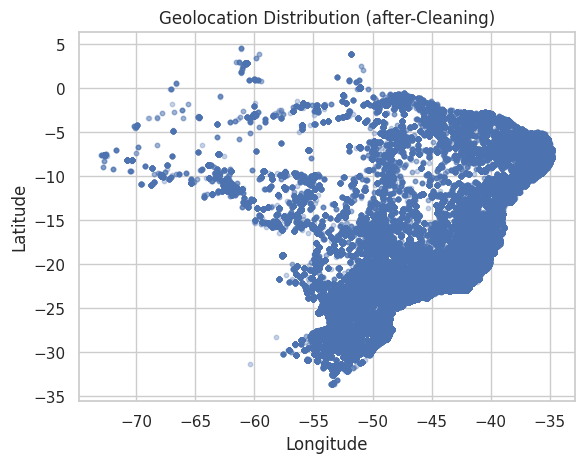

In [ ]:
import matplotlib.pyplot as plt
plt.scatter(df_geolocation['geolocation_lng'], df_geolocation['geolocation_lat'], alpha=0.3, s=10)
plt.title("Geolocation Distribution (after-Cleaning)")
plt.xlabel("Longitude")
plt.ylabel("Latitude")
plt.grid(True)
plt.show()

- Titik-titik koordinat sekarang sudah membentuk wilayah Brasil dengan kontur yang jauh lebih akurat dan padat secara spasial.

- Outlier yang sebelumnya tersebar di luar Brasil (misalnya Afrika, Samudera Atlantik, Asia) telah berhasil dihapus menggunakan filter berdasarkan rentang latitude dan longitude resmi Brasil.

- Distribusi titik menunjukkan konsentrasi tinggi di wilayah tenggara dan timur laut Brasil — ini selaras dengan pusat-pusat populasi dan aktivitas ekonomi di negara tersebut.

In [ ]:
df_geolocation.isna().sum()

,0
geolocation_zip_code_prefix,0
geolocation_lat,0
geolocation_lng,0
geolocation_city,0
geolocation_state,0


##Review Dataset

In [ ]:
df_review.isna().sum()

,0
review_id,0
order_id,0
review_score,0
review_comment_title,87656
review_comment_message,58247
review_creation_date,0
review_answer_timestamp,0


In [ ]:
#cek missing value review kolom yang memiliki missing value
df_review[df_review['review_comment_message'].isnull()]

,review_id,order_id,review_score,review_comment_title,review_comment_message,review_creation_date,review_answer_timestamp
0,7bc2406110b926393aa56f80a40eba40,73fc7af87114b39712e6da79b0a377eb,4,NaN,NaN,2018-01-18 00:00:00,2018-01-18 21:46:59
1,80e641a11e56f04c1ad469d5645fdfde,a548910a1c6147796b98fdf73dbeba33,5,NaN,NaN,2018-03-10 00:00:00,2018-03-11 03:05:13
2,228ce5500dc1d8e020d8d1322874b6f0,f9e4b658b201a9f2ecdecbb34bed034b,5,NaN,NaN,2018-02-17 00:00:00,2018-02-18 14:36:24
5,15197aa66ff4d0650b5434f1b46cda19,b18dcdf73be66366873cd26c5724d1dc,1,NaN,NaN,2018-04-13 00:00:00,2018-04-16 00:39:37
6,07f9bee5d1b850860defd761afa7ff16,e48aa0d2dcec3a2e87348811bcfdf22b,5,NaN,NaN,2017-07-16 00:00:00,2017-07-18 19:30:34
...,...,...,...,...,...,...,...
99217,c6b270c61f67c9f7cb07d84ea8aeaf8b,48f7ee67313eda32bfcf5b9c1dd9522d,5,NaN,NaN,2017-12-13 00:00:00,2017-12-14 11:09:36
99218,af2dc0519de6e0720ef0c74292fb4114,d699c734a0b1c8111f2272a3f36d398c,5,NaN,NaN,2018-04-27 00:00:00,2018-04-30 01:18:57
99219,574ed12dd733e5fa530cfd4bbf39d7c9,2a8c23fee101d4d5662fa670396eb8da,5,NaN,NaN,2018-07-07 00:00:00,2018-07-14 17:18:30
99220,f3897127253a9592a73be9bdfdf4ed7a,22ec9f0669f784db00fa86d035cf8602,5,NaN,NaN,2017-12-09 00:00:00,2017-12-11 20:06:42


In [ ]:
# Cek apakah ada review tanpa komentar tapi skor < 4
# Filter review yang comment-nya kosong
df_review[df_review['review_comment_message'].isnull() & (df_review['review_score'] < 4)]

,review_id,order_id,review_score,review_comment_title,review_comment_message,review_creation_date,review_answer_timestamp
5,15197aa66ff4d0650b5434f1b46cda19,b18dcdf73be66366873cd26c5724d1dc,1,NaN,NaN,2018-04-13 00:00:00,2018-04-16 00:39:37
14,9a0abbb668bafb95a6d2b05db43284c4,d7bd0e4afdf94846eb73642b4e3e75c3,3,NaN,NaN,2017-04-30 00:00:00,2017-05-03 00:02:22
18,fdbdb2629a7cde0f66657acc92084e7f,70a752414a13d09cc1f2b437b914b28e,3,NaN,NaN,2017-09-29 00:00:00,2017-10-02 01:12:49
40,ab3056e4fb5a36df4b58c1746e4a6b8f,aad1dcbe4c9fe2e3486e5e04c6649097,2,NaN,NaN,2018-05-13 00:00:00,2018-05-14 16:29:15
41,eb26c2bfb5030f57dcef30d3f111eb1e,88096595631e8d26b658306256e3ce34,1,NaN,NaN,2018-02-08 00:00:00,2018-02-10 04:28:43
...,...,...,...,...,...,...,...
99174,cf0b8c06ba024a8a8d3f2ac51fcd99f4,fff2cdc825f9fc0ba3c04227cfa02303,2,NaN,NaN,2018-03-09 00:00:00,2018-04-23 17:52:49
99184,6cf47345d15e054dd6df872e929bdb27,54e6829fe81bc86cf88b12e6d07ea298,1,NaN,NaN,2017-06-08 00:00:00,2017-06-08 22:52:39
99198,445a7bd5ce7f7bc9c28a5844c2466acc,2d687102eef8e4949a9d2af49e8fa946,3,NaN,NaN,2017-12-19 00:00:00,2017-12-28 16:51:12
99212,3ea12859f456855149b564d1a221f87a,f62f01ec64c6b221f926ba560907d8f7,3,NaN,NaN,2017-04-05 00:00:00,2017-04-05 09:42:58


Mayoritas review tanpa komentar berasal dari skor 4 dan 5, tapi tetap ada sebagian kecil dengan skor 1–3.

Ini menunjukkan bahwa tidak semua pengguna mengekspresikan kekecewaan atau kepuasan dalam bentuk teks, mereka hanya menilai lewat skor.

berarti kita bisa melakukan fillna dengan cara mengisi kolom dengan label "No Comment" agar data lebih akurat untuk dilakukan analisis.

In [ ]:
#fillna missing value dengan label " NO Comment"
df_review['review_comment_message'].fillna('No Comment', inplace=True)
df_review.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 99224 entries, 0 to 99223
Data columns (total 7 columns):
 #   Column                   Non-Null Count  Dtype 
---  ------                   --------------  ----- 
 0   review_id                99224 non-null  object
 1   order_id                 99224 non-null  object
 2   review_score             99224 non-null  int64 
 3   review_comment_title     11568 non-null  object
 4   review_comment_message   99224 non-null  object
 5   review_creation_date     99224 non-null  object
 6   review_answer_timestamp  99224 non-null  object
dtypes: int64(1), object(6)
memory usage: 5.3+ MB


In [ ]:
#cek review comment message yang isinya no comment
df_review[df_review['review_comment_message'] == 'No Comment']

,review_id,order_id,review_score,review_comment_title,review_comment_message,review_creation_date,review_answer_timestamp
0,7bc2406110b926393aa56f80a40eba40,73fc7af87114b39712e6da79b0a377eb,4,NaN,No Comment,2018-01-18 00:00:00,2018-01-18 21:46:59
1,80e641a11e56f04c1ad469d5645fdfde,a548910a1c6147796b98fdf73dbeba33,5,NaN,No Comment,2018-03-10 00:00:00,2018-03-11 03:05:13
2,228ce5500dc1d8e020d8d1322874b6f0,f9e4b658b201a9f2ecdecbb34bed034b,5,NaN,No Comment,2018-02-17 00:00:00,2018-02-18 14:36:24
5,15197aa66ff4d0650b5434f1b46cda19,b18dcdf73be66366873cd26c5724d1dc,1,NaN,No Comment,2018-04-13 00:00:00,2018-04-16 00:39:37
6,07f9bee5d1b850860defd761afa7ff16,e48aa0d2dcec3a2e87348811bcfdf22b,5,NaN,No Comment,2017-07-16 00:00:00,2017-07-18 19:30:34
...,...,...,...,...,...,...,...
99217,c6b270c61f67c9f7cb07d84ea8aeaf8b,48f7ee67313eda32bfcf5b9c1dd9522d,5,NaN,No Comment,2017-12-13 00:00:00,2017-12-14 11:09:36
99218,af2dc0519de6e0720ef0c74292fb4114,d699c734a0b1c8111f2272a3f36d398c,5,NaN,No Comment,2018-04-27 00:00:00,2018-04-30 01:18:57
99219,574ed12dd733e5fa530cfd4bbf39d7c9,2a8c23fee101d4d5662fa670396eb8da,5,NaN,No Comment,2018-07-07 00:00:00,2018-07-14 17:18:30
99220,f3897127253a9592a73be9bdfdf4ed7a,22ec9f0669f784db00fa86d035cf8602,5,NaN,No Comment,2017-12-09 00:00:00,2017-12-11 20:06:42


In [ ]:
#fillna review comment title dengan no comment juga
df_review['review_comment_title'].fillna('No Comment', inplace=True)
df_review.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 99224 entries, 0 to 99223
Data columns (total 7 columns):
 #   Column                   Non-Null Count  Dtype 
---  ------                   --------------  ----- 
 0   review_id                99224 non-null  object
 1   order_id                 99224 non-null  object
 2   review_score             99224 non-null  int64 
 3   review_comment_title     99224 non-null  object
 4   review_comment_message   99224 non-null  object
 5   review_creation_date     99224 non-null  object
 6   review_answer_timestamp  99224 non-null  object
dtypes: int64(1), object(6)
memory usage: 5.3+ MB


In [ ]:
df_review.isna().sum()

,0
review_id,0
order_id,0
review_score,0
review_comment_title,0
review_comment_message,0
review_creation_date,0
review_answer_timestamp,0


##Order dataset

In [ ]:
df_orders.isna().sum()

,0
order_id,0
customer_id,0
order_status,0
order_purchase_timestamp,0
order_approved_at,160
order_delivered_carrier_date,1783
order_delivered_customer_date,2965
order_estimated_delivery_date,0


In [ ]:
df_orders.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 99441 entries, 0 to 99440
Data columns (total 8 columns):
 #   Column                         Non-Null Count  Dtype 
---  ------                         --------------  ----- 
 0   order_id                       99441 non-null  object
 1   customer_id                    99441 non-null  object
 2   order_status                   99441 non-null  object
 3   order_purchase_timestamp       99441 non-null  object
 4   order_approved_at              99281 non-null  object
 5   order_delivered_carrier_date   97658 non-null  object
 6   order_delivered_customer_date  96476 non-null  object
 7   order_estimated_delivery_date  99441 non-null  object
dtypes: object(8)
memory usage: 6.1+ MB


tipe data date masih berbentuk object dan akan diubah menjadi datetime

In [ ]:
#ubah tipe data order_purchase_timestamp	order_approved_at	order_delivered_carrier_date	order_delivered_customer_date	order_estimated_delivery_date menjadi datetime
df_orders['order_purchase_timestamp'] = pd.to_datetime(df_orders['order_purchase_timestamp'])
df_orders['order_approved_at'] = pd.to_datetime(df_orders['order_approved_at'])
df_orders['order_delivered_carrier_date'] = pd.to_datetime(df_orders['order_delivered_carrier_date'])
df_orders['order_delivered_customer_date'] = pd.to_datetime(df_orders['order_delivered_customer_date'])
df_orders['order_estimated_delivery_date'] = pd.to_datetime(df_orders['order_estimated_delivery_date'])

In [ ]:
df_orders.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 99441 entries, 0 to 99440
Data columns (total 8 columns):
 #   Column                         Non-Null Count  Dtype         
---  ------                         --------------  -----         
 0   order_id                       99441 non-null  object        
 1   customer_id                    99441 non-null  object        
 2   order_status                   99441 non-null  object        
 3   order_purchase_timestamp       99441 non-null  datetime64[ns]
 4   order_approved_at              99281 non-null  datetime64[ns]
 5   order_delivered_carrier_date   97658 non-null  datetime64[ns]
 6   order_delivered_customer_date  96476 non-null  datetime64[ns]
 7   order_estimated_delivery_date  99441 non-null  datetime64[ns]
dtypes: datetime64[ns](5), object(3)
memory usage: 6.1+ MB


In [ ]:
#cek missing value yang NaN
df_orders[df_orders['order_delivered_customer_date'].isna()]

,order_id,customer_id,order_status,order_purchase_timestamp,order_approved_at,order_delivered_carrier_date,order_delivered_customer_date,order_estimated_delivery_date
6,136cce7faa42fdb2cefd53fdc79a6098,ed0271e0b7da060a393796590e7b737a,invoiced,2017-04-11 12:22:08,2017-04-13 13:25:17,NaT,NaT,2017-05-09
44,ee64d42b8cf066f35eac1cf57de1aa85,caded193e8e47b8362864762a83db3c5,shipped,2018-06-04 16:44:48,2018-06-05 04:31:18,2018-06-05 14:32:00,NaT,2018-06-28
103,0760a852e4e9d89eb77bf631eaaf1c84,d2a79636084590b7465af8ab374a8cf5,invoiced,2018-08-03 17:44:42,2018-08-07 06:15:14,NaT,NaT,2018-08-21
128,15bed8e2fec7fdbadb186b57c46c92f2,f3f0e613e0bdb9c7cee75504f0f90679,processing,2017-09-03 14:22:03,2017-09-03 14:30:09,NaT,NaT,2017-10-03
154,6942b8da583c2f9957e990d028607019,52006a9383bf149a4fb24226b173106f,shipped,2018-01-10 11:33:07,2018-01-11 02:32:30,2018-01-11 19:39:23,NaT,2018-02-07
...,...,...,...,...,...,...,...,...
99283,3a3cddda5a7c27851bd96c3313412840,0b0d6095c5555fe083844281f6b093bb,canceled,2018-08-31 16:13:44,NaT,NaT,NaT,2018-10-01
99313,e9e64a17afa9653aacf2616d94c005b8,b4cd0522e632e481f8eaf766a2646e86,processing,2018-01-05 23:07:24,2018-01-09 07:18:05,NaT,NaT,2018-02-06
99347,a89abace0dcc01eeb267a9660b5ac126,2f0524a7b1b3845a1a57fcf3910c4333,canceled,2018-09-06 18:45:47,NaT,NaT,NaT,2018-09-27
99348,a69ba794cc7deb415c3e15a0a3877e69,726f0894b5becdf952ea537d5266e543,unavailable,2017-08-23 16:28:04,2017-08-28 15:44:47,NaT,NaT,2017-09-15


In [ ]:
#cek missing value yang NaN
df_orders[df_orders['order_approved_at'].isna()]

,order_id,customer_id,order_status,order_purchase_timestamp,order_approved_at,order_delivered_carrier_date,order_delivered_customer_date,order_estimated_delivery_date
1130,00b1cb0320190ca0daa2c88b35206009,3532ba38a3fd242259a514ac2b6ae6b6,canceled,2018-08-28 15:26:39,NaT,NaT,NaT,2018-09-12
1801,ed3efbd3a87bea76c2812c66a0b32219,191984a8ba4cbb2145acb4fe35b69664,canceled,2018-09-20 13:54:16,NaT,NaT,NaT,2018-10-17
1868,df8282afe61008dc26c6c31011474d02,aa797b187b5466bc6925aaaa4bb3bed1,canceled,2017-03-04 12:14:30,NaT,NaT,NaT,2017-04-10
2029,8d4c637f1accf7a88a4555f02741e606,b1dd715db389a2077f43174e7a675d07,canceled,2018-08-29 16:27:49,NaT,NaT,NaT,2018-09-13
2161,7a9d4c7f9b068337875b95465330f2fc,7f71ae48074c0cfec9195f88fcbfac55,canceled,2017-05-01 16:12:39,NaT,NaT,NaT,2017-05-30
...,...,...,...,...,...,...,...,...
97696,5a00b4d35edffc56b825c3646a99ba9d,6a3bdf004ca96338fb5fad1b8d93c2e6,canceled,2017-07-02 15:38:46,NaT,NaT,NaT,2017-07-25
98415,227c804e2a44760671a6a5697ea549e4,62e7477e75e542243ee62a0ba73f410f,canceled,2017-09-28 15:02:56,NaT,NaT,NaT,2017-10-16
98909,e49e7ce1471b4693482d40c2bd3ad196,e4e7ab3f449aeb401f0216f86c2104db,canceled,2018-08-07 11:16:28,NaT,NaT,NaT,2018-08-10
99283,3a3cddda5a7c27851bd96c3313412840,0b0d6095c5555fe083844281f6b093bb,canceled,2018-08-31 16:13:44,NaT,NaT,NaT,2018-10-01


In [ ]:
#cek missing value order_delivered_carrier_date
df_orders[df_orders['order_delivered_carrier_date'].isna()]

,order_id,customer_id,order_status,order_purchase_timestamp,order_approved_at,order_delivered_carrier_date,order_delivered_customer_date,order_estimated_delivery_date
6,136cce7faa42fdb2cefd53fdc79a6098,ed0271e0b7da060a393796590e7b737a,invoiced,2017-04-11 12:22:08,2017-04-13 13:25:17,NaT,NaT,2017-05-09
103,0760a852e4e9d89eb77bf631eaaf1c84,d2a79636084590b7465af8ab374a8cf5,invoiced,2018-08-03 17:44:42,2018-08-07 06:15:14,NaT,NaT,2018-08-21
128,15bed8e2fec7fdbadb186b57c46c92f2,f3f0e613e0bdb9c7cee75504f0f90679,processing,2017-09-03 14:22:03,2017-09-03 14:30:09,NaT,NaT,2017-10-03
266,8e24261a7e58791d10cb1bf9da94df5c,64a254d30eed42cd0e6c36dddb88adf0,unavailable,2017-11-16 15:09:28,2017-11-16 15:26:57,NaT,NaT,2017-12-05
324,d3c8851a6651eeff2f73b0e011ac45d0,957f8e082185574de25992dc659ebbc0,processing,2016-10-05 22:44:13,2016-10-06 15:51:05,NaT,NaT,2016-12-09
...,...,...,...,...,...,...,...,...
99283,3a3cddda5a7c27851bd96c3313412840,0b0d6095c5555fe083844281f6b093bb,canceled,2018-08-31 16:13:44,NaT,NaT,NaT,2018-10-01
99313,e9e64a17afa9653aacf2616d94c005b8,b4cd0522e632e481f8eaf766a2646e86,processing,2018-01-05 23:07:24,2018-01-09 07:18:05,NaT,NaT,2018-02-06
99347,a89abace0dcc01eeb267a9660b5ac126,2f0524a7b1b3845a1a57fcf3910c4333,canceled,2018-09-06 18:45:47,NaT,NaT,NaT,2018-09-27
99348,a69ba794cc7deb415c3e15a0a3877e69,726f0894b5becdf952ea537d5266e543,unavailable,2017-08-23 16:28:04,2017-08-28 15:44:47,NaT,NaT,2017-09-15


order_status = canceled memang paling sering menyebabkan kolom waktu lain menjadi NaN, karena order tersebut tidak pernah lanjut ke tahap selanjutnya (tidak disetujui, tidak dikirim, dll).
Namun, ternyata ada juga order dengan status lain seperti processing, invoiced, atau unavailable yang juga tidak memiliki tanggal pengiriman, sehingga NaN tetap muncul di kolom seperti order_delivered_carrier_date.

In [ ]:
#cek data order status invoiced
df_orders[df_orders['order_status'] == 'invoiced']

,order_id,customer_id,order_status,order_purchase_timestamp,order_approved_at,order_delivered_carrier_date,order_delivered_customer_date,order_estimated_delivery_date
6,136cce7faa42fdb2cefd53fdc79a6098,ed0271e0b7da060a393796590e7b737a,invoiced,2017-04-11 12:22:08,2017-04-13 13:25:17,NaT,NaT,2017-05-09
103,0760a852e4e9d89eb77bf631eaaf1c84,d2a79636084590b7465af8ab374a8cf5,invoiced,2018-08-03 17:44:42,2018-08-07 06:15:14,NaT,NaT,2018-08-21
455,38b7efdf33dd5561f4f5d4f6e07b0414,021e84751ba0ead75b6d314a6ead88d9,invoiced,2017-08-01 18:17:41,2017-08-01 18:32:30,NaT,NaT,2017-08-28
1833,51b0dccc8596ce37a930dff2d63a10a2,31bf1057b00f14804278590bbac18b1b,invoiced,2017-05-05 22:34:48,2017-05-05 22:45:12,NaT,NaT,2017-06-06
2116,5504eaa5a86eb25fa666cf2e6b96c701,a30be38e1ed0ffb39b318bf1d15e98d9,invoiced,2017-11-29 08:33:06,2017-11-29 08:56:23,NaT,NaT,2017-12-20
...,...,...,...,...,...,...,...,...
98414,41ad2ae32ee66c07ef3b0301ba02ad27,5c7f8d14a0a12198d1d07167d7d343b3,invoiced,2017-11-24 15:54:47,2017-11-24 19:33:24,NaT,NaT,2017-12-18
98624,9ffb325177b96c422447e3b9ee9a6270,e4079117ea0dc8bc27274e34c4796515,invoiced,2018-05-10 19:11:18,2018-05-10 19:37:27,NaT,NaT,2018-06-05
98845,021dac6e3120485db6a77474aa21b979,c40f7f00e91eb8a0da1e58484380a796,invoiced,2017-11-24 22:46:09,2017-11-25 01:53:42,NaT,NaT,2017-12-15
99031,c526fe83c01c48066394ff5d81f9ab9a,6c678c38f3a0874b7bfeeb2d5fb22876,invoiced,2018-08-07 11:11:30,2018-08-07 11:25:01,NaT,NaT,2018-08-17


In [ ]:
#cek data order status invoiced
df_orders[df_orders['order_status'] == 'created']

,order_id,customer_id,order_status,order_purchase_timestamp,order_approved_at,order_delivered_carrier_date,order_delivered_customer_date,order_estimated_delivery_date
7434,b5359909123fa03c50bdb0cfed07f098,438449d4af8980d107bf04571413a8e7,created,2017-12-05 01:07:52,NaT,NaT,NaT,2018-01-11
9238,dba5062fbda3af4fb6c33b1e040ca38f,964a6df3d9bdf60fe3e7b8bb69ed893a,created,2018-02-09 17:21:04,NaT,NaT,NaT,2018-03-07
21441,7a4df5d8cff4090e541401a20a22bb80,725e9c75605414b21fd8c8d5a1c2f1d6,created,2017-11-25 11:10:33,NaT,NaT,NaT,2017-12-12
55086,35de4050331c6c644cddc86f4f2d0d64,4ee64f4bfc542546f422da0aeb462853,created,2017-12-05 01:07:58,NaT,NaT,NaT,2018-01-08
58958,90ab3e7d52544ec7bc3363c82689965f,7d61b9f4f216052ba664f22e9c504ef1,created,2017-11-06 13:12:34,NaT,NaT,NaT,2017-12-01


In [ ]:
#cek data order status invoiced
df_orders[df_orders['order_status'] == 'approved']

,order_id,customer_id,order_status,order_purchase_timestamp,order_approved_at,order_delivered_carrier_date,order_delivered_customer_date,order_estimated_delivery_date
44897,a2e4c44360b4a57bdff22f3a4630c173,8886130db0ea6e9e70ba0b03d7c0d286,approved,2017-02-06 20:18:17,2017-02-06 20:30:19,NaT,NaT,2017-03-01
88457,132f1e724165a07f6362532bfb97486e,b2191912d8ad6eac2e4dc3b6e1459515,approved,2017-04-25 01:25:34,2017-04-30 20:32:41,NaT,NaT,2017-05-22


In [ ]:
#cek
df_orders[df_orders['order_status'] == 'shipped']

,order_id,customer_id,order_status,order_purchase_timestamp,order_approved_at,order_delivered_carrier_date,order_delivered_customer_date,order_estimated_delivery_date
44,ee64d42b8cf066f35eac1cf57de1aa85,caded193e8e47b8362864762a83db3c5,shipped,2018-06-04 16:44:48,2018-06-05 04:31:18,2018-06-05 14:32:00,NaT,2018-06-28
154,6942b8da583c2f9957e990d028607019,52006a9383bf149a4fb24226b173106f,shipped,2018-01-10 11:33:07,2018-01-11 02:32:30,2018-01-11 19:39:23,NaT,2018-02-07
162,36530871a5e80138db53bcfd8a104d90,4dafe3c841d2d6cc8a8b6d25b35704b9,shipped,2017-05-09 11:48:37,2017-05-11 11:45:14,2017-05-11 13:21:47,NaT,2017-06-08
231,4d630f57194f5aba1a3d12ce23e71cd9,6d491c9fe2f04f6e2af6ec033cd8907c,shipped,2017-11-17 19:53:21,2017-11-18 19:50:31,2017-11-22 17:28:34,NaT,2017-12-13
299,3b4ad687e7e5190db827e1ae5a8989dd,1a87b8517b7d31373b50396eb15cb445,shipped,2018-06-28 12:52:15,2018-06-28 13:11:09,2018-07-04 15:20:00,NaT,2018-08-03
...,...,...,...,...,...,...,...,...
98534,a59ef0abffbef8ddaae23600b6ee6604,49e64271fb8eeb19851dc7e850e92204,shipped,2017-11-06 17:35:49,2017-11-07 06:31:44,2017-11-07 18:57:39,NaT,2017-11-24
98779,dab8a6c6bd6ec448df5b3a6b6cb887bc,394653a10cab83cad40d7e2713f3ab89,shipped,2018-07-14 10:12:51,2018-07-16 12:30:58,2018-07-16 14:34:00,NaT,2018-08-03
98932,492aed3c33bac22a8e04138319829283,58466c1166c377a56f6b2ae0d93ffbc0,shipped,2018-07-06 16:26:47,2018-07-06 16:35:10,2018-07-10 12:27:00,NaT,2018-07-26
99113,274a7f7e4f1c17b7434a830e9b8759b1,670af30ca5b8c20878fecdafa5ee01b9,shipped,2018-06-23 13:25:15,2018-06-23 13:40:11,2018-07-04 13:51:00,NaT,2018-07-24


In [ ]:
# Filter hanya data dengan status delivered
df_delivered = df_orders[df_orders['order_status'] == 'delivered']

# Tampilkan baris yang masih memiliki nilai missing (NaN/NaT)
df_delivered_missing = df_delivered[df_delivered.isna().any(axis=1)]

# Lihat hasilnya
df_delivered_missing

,order_id,customer_id,order_status,order_purchase_timestamp,order_approved_at,order_delivered_carrier_date,order_delivered_customer_date,order_estimated_delivery_date
3002,2d1e2d5bf4dc7227b3bfebb81328c15f,ec05a6d8558c6455f0cbbd8a420ad34f,delivered,2017-11-28 17:44:07,2017-11-28 17:56:40,2017-11-30 18:12:23,NaT,2017-12-18
5323,e04abd8149ef81b95221e88f6ed9ab6a,2127dc6603ac33544953ef05ec155771,delivered,2017-02-18 14:40:00,NaT,2017-02-23 12:04:47,2017-03-01 13:25:33,2017-03-17
16567,8a9adc69528e1001fc68dd0aaebbb54a,4c1ccc74e00993733742a3c786dc3c1f,delivered,2017-02-18 12:45:31,NaT,2017-02-23 09:01:52,2017-03-02 10:05:06,2017-03-21
19031,7013bcfc1c97fe719a7b5e05e61c12db,2941af76d38100e0f8740a374f1a5dc3,delivered,2017-02-18 13:29:47,NaT,2017-02-22 16:25:25,2017-03-01 08:07:38,2017-03-17
20618,f5dd62b788049ad9fc0526e3ad11a097,5e89028e024b381dc84a13a3570decb4,delivered,2018-06-20 06:58:43,2018-06-20 07:19:05,2018-06-25 08:05:00,NaT,2018-07-16
22663,5cf925b116421afa85ee25e99b4c34fb,29c35fc91fc13fb5073c8f30505d860d,delivered,2017-02-18 16:48:35,NaT,2017-02-22 11:23:10,2017-03-09 07:28:47,2017-03-31
23156,12a95a3c06dbaec84bcfb0e2da5d228a,1e101e0daffaddce8159d25a8e53f2b2,delivered,2017-02-17 13:05:55,NaT,2017-02-22 11:23:11,2017-03-02 11:09:19,2017-03-20
26800,c1d4211b3dae76144deccd6c74144a88,684cb238dc5b5d6366244e0e0776b450,delivered,2017-01-19 12:48:08,NaT,2017-01-25 14:56:50,2017-01-30 18:16:01,2017-03-01
38290,d69e5d356402adc8cf17e08b5033acfb,68d081753ad4fe22fc4d410a9eb1ca01,delivered,2017-02-19 01:28:47,NaT,2017-02-23 03:11:48,2017-03-02 03:41:58,2017-03-27
39334,d77031d6a3c8a52f019764e68f211c69,0bf35cac6cc7327065da879e2d90fae8,delivered,2017-02-18 11:04:19,NaT,2017-02-23 07:23:36,2017-03-02 16:15:23,2017-03-22


In [ ]:
 # Hitung jumlah missing value per kolom, dikelompokkan berdasarkan status
df_orders.groupby('order_status')[[
    'order_approved_at',
    'order_delivered_carrier_date',
    'order_delivered_customer_date'
]].apply(lambda x: x.isna().sum())

,order_approved_at,order_delivered_carrier_date,order_delivered_customer_date
order_status,,,
approved,0,2,2
canceled,141,550,619
created,5,5,5
delivered,14,2,8
invoiced,0,314,314
processing,0,301,301
shipped,0,0,1107
unavailable,0,609,609


- Mayoritas missing value berasal dari status unavailable dan canceled, yang wajar karena status ini menunjukkan order tidak diproses hingga tahap pengiriman. Namun, terdapat pula anomali pada status yang seharusnya melewati proses pengiriman seperti:

- invoiced (314) dan processing (301): kemungkinan besar ini order yang tertunda atau belum diperbarui statusnya.

- delivered (2): seharusnya tidak mungkin punya kolom order_delivered_carrier_date kosong jika memang sudah delivered.

- approved dan created: memang belum tentu sampai tahap pengiriman.

In [ ]:
#fillna created = "not yet approved"
df_orders.loc[df_orders['order_status'] == 'created', :] = (
    df_orders.loc[df_orders['order_status'] == 'created', :].fillna('not_yet_approved')
)

#fillna approved = "waiting for invoiced"
df_orders.loc[df_orders['order_status'] == 'approved', :] = (
    df_orders.loc[df_orders['order_status'] == 'approved', :].fillna('waiting_for_invoiced')
)

#fillna invoiced = "waiting for processing"
df_orders.loc[df_orders['order_status'] == 'invoiced', :] = (
    df_orders.loc[df_orders['order_status'] == 'invoiced', :].fillna('waiting_for_processing')
)

#fillna processing = "in preparation"
df_orders.loc[df_orders['order_status'] == 'processing', :] = (
    df_orders.loc[df_orders['order_status'] == 'processing', :].fillna('in_preparation')
)

#fillna shipped = "in transit"
df_orders.loc[df_orders['order_status'] == 'shipped', :] = (
    df_orders.loc[df_orders['order_status'] == 'shipped', :].fillna('in_transit')
)

#fillna delivered = for order approved at = "missing approved date", for delivery date = "missing delivery date"
df_orders.loc[df_orders['order_status'] == 'delivered', 'order_approved_at'] = (
    df_orders.loc[df_orders['order_status'] == 'delivered', 'order_approved_at']
    .fillna('missing_approved_date')
)
df_orders.loc[df_orders['order_status'] == 'delivered', [
    'order_delivered_carrier_date', 'order_delivered_customer_date'
]] = df_orders.loc[df_orders['order_status'] == 'delivered', [
    'order_delivered_carrier_date', 'order_delivered_customer_date'
]].fillna('missing_delivery_date')

#fillna canceled = "order canceled"
df_orders.loc[df_orders['order_status'] == 'canceled', :] = (
    df_orders.loc[df_orders['order_status'] == 'canceled', :].fillna('order_canceled')
)

#fillna unavailable = "unavailable"
df_orders.loc[df_orders['order_status'] == 'unavailable', :] = (
    df_orders.loc[df_orders['order_status'] == 'unavailable', :].fillna('unavailable')
)


Missing value pada dataset order ditangani dengan cara fillna menggunakan label kontekstual dan penambahan flag anomali, agar informasi mengenai tahapan order yang belum lengkap tetap terjaga tanpa menyalahi urutan proses transaksi. Pendekatan ini dipilih untuk mempertahankan integritas data waktu sekaligus memungkinkan analisis kualitas data yang lebih transparan.

In [ ]:
df_orders.isna().sum()

,0
order_id,0
customer_id,0
order_status,0
order_purchase_timestamp,0
order_approved_at,0
order_delivered_carrier_date,0
order_delivered_customer_date,0
order_estimated_delivery_date,0


In [ ]:
df_geolocation.head()

,geolocation_zip_code_prefix,geolocation_lat,geolocation_lng,geolocation_city,geolocation_state
0,1037,-23.545621,-46.639292,sao paulo,SP
1,1046,-23.546081,-46.644820,sao paulo,SP
2,1046,-23.546129,-46.642951,sao paulo,SP
3,1041,-23.544392,-46.639499,sao paulo,SP
4,1035,-23.541578,-46.641607,sao paulo,SP


In [ ]:
# df_geo_merged.head()

In [ ]:
# #download dataset product translated
# df_geo_merged.to_csv('df_geo_merged_clean.csv', index=False)

##Product Dataset

In [ ]:
df_product.isna().sum()

,0
product_id,0
product_category_name,610
product_name_lenght,610
product_description_lenght,610
product_photos_qty,610
product_weight_g,2
product_length_cm,2
product_height_cm,2
product_width_cm,2


In [ ]:
#cek isi data yang isna
df_product[df_product['product_category_name'].isna()]

,product_id,product_category_name,product_name_lenght,product_description_lenght,product_photos_qty,product_weight_g,product_length_cm,product_height_cm,product_width_cm
105,a41e356c76fab66334f36de622ecbd3a,NaN,NaN,NaN,NaN,650.0,17.0,14.0,12.0
128,d8dee61c2034d6d075997acef1870e9b,NaN,NaN,NaN,NaN,300.0,16.0,7.0,20.0
145,56139431d72cd51f19eb9f7dae4d1617,NaN,NaN,NaN,NaN,200.0,20.0,20.0,20.0
154,46b48281eb6d663ced748f324108c733,NaN,NaN,NaN,NaN,18500.0,41.0,30.0,41.0
197,5fb61f482620cb672f5e586bb132eae9,NaN,NaN,NaN,NaN,300.0,35.0,7.0,12.0
...,...,...,...,...,...,...,...,...,...
32515,b0a0c5dd78e644373b199380612c350a,NaN,NaN,NaN,NaN,1800.0,30.0,20.0,70.0
32589,10dbe0fbaa2c505123c17fdc34a63c56,NaN,NaN,NaN,NaN,800.0,30.0,10.0,23.0
32616,bd2ada37b58ae94cc838b9c0569fecd8,NaN,NaN,NaN,NaN,200.0,21.0,8.0,16.0
32772,fa51e914046aab32764c41356b9d4ea4,NaN,NaN,NaN,NaN,1300.0,45.0,16.0,45.0


In [ ]:
#drop missing value di kolom product
df_product.dropna(subset=['product_category_name'], inplace=True)
df_product.dropna(subset=['product_weight_g'], inplace=True)
df_product.dropna(subset=['product_length_cm'], inplace=True)
df_product.dropna(subset=['product_height_cm'], inplace=True)

Missing value pada kolom product_category_name dihapus karena bersifat missing struktural, di mana baris-baris tersebut tidak memiliki informasi pendukung lain yang relevan. Penghapusan dilakukan untuk menjaga kualitas dan konsistensi dataset tanpa menghilangkan informasi yang berguna.

In [ ]:
df_product.isna().sum()

,0
product_id,0
product_category_name,0
product_name_lenght,0
product_description_lenght,0
product_photos_qty,0
product_weight_g,0
product_length_cm,0
product_height_cm,0
product_width_cm,0


In [ ]:
df_product

,product_id,product_category_name,product_name_lenght,product_description_lenght,product_photos_qty,product_weight_g,product_length_cm,product_height_cm,product_width_cm
0,1e9e8ef04dbcff4541ed26657ea517e5,perfumaria,40.0,287.0,1.0,225.0,16.0,10.0,14.0
1,3aa071139cb16b67ca9e5dea641aaa2f,artes,44.0,276.0,1.0,1000.0,30.0,18.0,20.0
2,96bd76ec8810374ed1b65e291975717f,esporte_lazer,46.0,250.0,1.0,154.0,18.0,9.0,15.0
3,cef67bcfe19066a932b7673e239eb23d,bebes,27.0,261.0,1.0,371.0,26.0,4.0,26.0
4,9dc1a7de274444849c219cff195d0b71,utilidades_domesticas,37.0,402.0,4.0,625.0,20.0,17.0,13.0
...,...,...,...,...,...,...,...,...,...
32946,a0b7d5a992ccda646f2d34e418fff5a0,moveis_decoracao,45.0,67.0,2.0,12300.0,40.0,40.0,40.0
32947,bf4538d88321d0fd4412a93c974510e6,construcao_ferramentas_iluminacao,41.0,971.0,1.0,1700.0,16.0,19.0,16.0
32948,9a7c6041fa9592d9d9ef6cfe62a71f8c,cama_mesa_banho,50.0,799.0,1.0,1400.0,27.0,7.0,27.0
32949,83808703fc0706a22e264b9d75f04a2e,informatica_acessorios,60.0,156.0,2.0,700.0,31.0,13.0,20.0


In [ ]:
df_category

,product_category_name,product_category_name_english
0,beleza_saude,health_beauty
1,informatica_acessorios,computers_accessories
2,automotivo,auto
3,cama_mesa_banho,bed_bath_table
4,moveis_decoracao,furniture_decor
...,...,...
66,flores,flowers
67,artes_e_artesanato,arts_and_craftmanship
68,fraldas_higiene,diapers_and_hygiene
69,fashion_roupa_infanto_juvenil,fashion_childrens_clothes


#Feature Engineering

## Join Translate Product Name

In [ ]:
# Translate product pada dataset product menjadi bahasa inggris
df_product_translated = pd.merge(
    df_product,
    df_category,
    on='product_category_name',
    how='left'   # supaya semua data di 'product' tetap ada
)
# memindahkan index kolom translated menjadi di depan

col = 'product_category_name_english'
cols = list(df_product_translated.columns)

# hapus kolom dari posisi awalnya
cols.remove(col)

# sisipkan ke posisi ketiga (index ke-2)
cols.insert(2, col)

# urutkan ulang dataframe
df_product_translated = df_product_translated[cols]

df_product_translated

,product_id,product_category_name,product_category_name_english,product_name_lenght,product_description_lenght,product_photos_qty,product_weight_g,product_length_cm,product_height_cm,product_width_cm
0,1e9e8ef04dbcff4541ed26657ea517e5,perfumaria,perfumery,40.0,287.0,1.0,225.0,16.0,10.0,14.0
1,3aa071139cb16b67ca9e5dea641aaa2f,artes,art,44.0,276.0,1.0,1000.0,30.0,18.0,20.0
2,96bd76ec8810374ed1b65e291975717f,esporte_lazer,sports_leisure,46.0,250.0,1.0,154.0,18.0,9.0,15.0
3,cef67bcfe19066a932b7673e239eb23d,bebes,baby,27.0,261.0,1.0,371.0,26.0,4.0,26.0
4,9dc1a7de274444849c219cff195d0b71,utilidades_domesticas,housewares,37.0,402.0,4.0,625.0,20.0,17.0,13.0
...,...,...,...,...,...,...,...,...,...,...
32335,a0b7d5a992ccda646f2d34e418fff5a0,moveis_decoracao,furniture_decor,45.0,67.0,2.0,12300.0,40.0,40.0,40.0
32336,bf4538d88321d0fd4412a93c974510e6,construcao_ferramentas_iluminacao,construction_tools_lights,41.0,971.0,1.0,1700.0,16.0,19.0,16.0
32337,9a7c6041fa9592d9d9ef6cfe62a71f8c,cama_mesa_banho,bed_bath_table,50.0,799.0,1.0,1400.0,27.0,7.0,27.0
32338,83808703fc0706a22e264b9d75f04a2e,informatica_acessorios,computers_accessories,60.0,156.0,2.0,700.0,31.0,13.0,20.0


In [ ]:
df_product_translated.isna().sum()

,0
product_id,0
product_category_name,0
product_category_name_english,13
product_name_lenght,0
product_description_lenght,0
product_photos_qty,0
product_weight_g,0
product_length_cm,0
product_height_cm,0
product_width_cm,0


setelah dilaukan join tabel pada dataset product dengan product yang sudah di translate ditemukan missing value pada kolom product_category_ name_english

In [ ]:
df_product_translated[df_product_translated['product_category_name_english'].isna()]

,product_id,product_category_name,product_category_name_english,product_name_lenght,product_description_lenght,product_photos_qty,product_weight_g,product_length_cm,product_height_cm,product_width_cm
1581,0105b5323d24fc655f73052694dbbb3a,pc_gamer,NaN,59.0,621.0,4.0,2839.0,19.0,16.0,18.0
5703,6fd83eb3e0799b775e4f946bd66657c0,portateis_cozinha_e_preparadores_de_alimentos,NaN,52.0,280.0,1.0,1200.0,25.0,33.0,25.0
7176,5d923ead886c44b86845f69e50520c3e,portateis_cozinha_e_preparadores_de_alimentos,NaN,58.0,284.0,1.0,1200.0,25.0,33.0,25.0
7326,6727051471a0fc4a0e7737b57bff2549,pc_gamer,NaN,60.0,1532.0,3.0,650.0,16.0,22.0,20.0
8647,bed164d9d628cf0593003389c535c6e0,portateis_cozinha_e_preparadores_de_alimentos,NaN,54.0,382.0,2.0,850.0,30.0,21.0,22.0
10822,1220978a08a6b29a202bc015b18250e9,portateis_cozinha_e_preparadores_de_alimentos,NaN,46.0,280.0,1.0,1200.0,25.0,33.0,25.0
13995,ae62bb0f95af63d64eae5f93dddea8d3,portateis_cozinha_e_preparadores_de_alimentos,NaN,59.0,927.0,1.0,10600.0,40.0,20.0,38.0
15874,1954739d84629e7323a4295812a3e0ec,portateis_cozinha_e_preparadores_de_alimentos,NaN,58.0,792.0,4.0,750.0,30.0,30.0,30.0
16608,dbe520fb381ad695a7e1f2807d20c765,pc_gamer,NaN,60.0,840.0,6.0,800.0,18.0,22.0,22.0
17459,c7a3f1a7f9eef146cc499368b578b884,portateis_cozinha_e_preparadores_de_alimentos,NaN,52.0,1372.0,5.0,7350.0,40.0,30.0,23.0


ditemukan 2 category yang missing yaitu pc_gamer dan portateis_cozinha_e_preparadores_de_alimentos

In [ ]:
#cek jumlah data product category name
df_product['product_category_name'].value_counts()

,count
product_category_name,
cama_mesa_banho,3029
esporte_lazer,2867
moveis_decoracao,2657
beleza_saude,2444
utilidades_domesticas,2335
...,...
fashion_roupa_infanto_juvenil,5
casa_conforto_2,5
pc_gamer,3


In [ ]:
df_category['product_category_name_english'].value_counts()

,count
product_category_name_english,
health_beauty,1
computers_accessories,1
auto,1
bed_bath_table,1
furniture_decor,1
...,...
flowers,1
arts_and_craftmanship,1
diapers_and_hygiene,1


Saat dilakukan penggabungan antara dataset product dan product_category_name_translation, ditemukan selisih dua kategori.
Dataset produk memiliki 73 kategori, sedangkan dataset terjemahan hanya 71.
Akibatnya, dua kategori tersebut tidak mendapatkan padanan bahasa Inggris, yang kemudian memunculkan missing value setelah proses join. karena tidak ada yang sama maka akan dilakukan drop pada kolom  yang missing.

In [ ]:
#drop kolom yang missing pada dataset df_product translated
df_product_translated.dropna(subset=['product_category_name_english'], inplace=True)
df_product_translated.isna().sum()

,0
product_id,0
product_category_name,0
product_category_name_english,0
product_name_lenght,0
product_description_lenght,0
product_photos_qty,0
product_weight_g,0
product_length_cm,0
product_height_cm,0
product_width_cm,0


## Classify Order Review

In [ ]:
# mapping kategori review berdasarkan skor
review_mapping = {
    1: "very dissatisfied",
    2: "dissatisfied",
    3: "neutral",
    4: "satisfied",
    5: "very satisfied"
}

# buat kolom baru di df_review
df_review["review_category"] = df_review["review_score"].map(review_mapping)


In [ ]:
# memindahkan index kolom translated menjadi di depan

col = 'review_category'
cols = list(df_review.columns)

# hapus kolom dari posisi awalnya
cols.remove(col)

# sisipkan ke posisi ketiga (index ke-2)
cols.insert(2, col)

# urutkan ulang dataframe
df_review = df_review[cols]

df_review

,review_id,order_id,review_category,review_score,review_comment_title,review_comment_message,review_creation_date,review_answer_timestamp
0,7bc2406110b926393aa56f80a40eba40,73fc7af87114b39712e6da79b0a377eb,satisfied,4,No Comment,No Comment,2018-01-18 00:00:00,2018-01-18 21:46:59
1,80e641a11e56f04c1ad469d5645fdfde,a548910a1c6147796b98fdf73dbeba33,very satisfied,5,No Comment,No Comment,2018-03-10 00:00:00,2018-03-11 03:05:13
2,228ce5500dc1d8e020d8d1322874b6f0,f9e4b658b201a9f2ecdecbb34bed034b,very satisfied,5,No Comment,No Comment,2018-02-17 00:00:00,2018-02-18 14:36:24
3,e64fb393e7b32834bb789ff8bb30750e,658677c97b385a9be170737859d3511b,very satisfied,5,No Comment,Recebi bem antes do prazo estipulado.,2017-04-21 00:00:00,2017-04-21 22:02:06
4,f7c4243c7fe1938f181bec41a392bdeb,8e6bfb81e283fa7e4f11123a3fb894f1,very satisfied,5,No Comment,Parabéns lojas lannister adorei comprar pela I...,2018-03-01 00:00:00,2018-03-02 10:26:53
...,...,...,...,...,...,...,...,...
99219,574ed12dd733e5fa530cfd4bbf39d7c9,2a8c23fee101d4d5662fa670396eb8da,very satisfied,5,No Comment,No Comment,2018-07-07 00:00:00,2018-07-14 17:18:30
99220,f3897127253a9592a73be9bdfdf4ed7a,22ec9f0669f784db00fa86d035cf8602,very satisfied,5,No Comment,No Comment,2017-12-09 00:00:00,2017-12-11 20:06:42
99221,b3de70c89b1510c4cd3d0649fd302472,55d4004744368f5571d1f590031933e4,very satisfied,5,No Comment,"Excelente mochila, entrega super rápida. Super...",2018-03-22 00:00:00,2018-03-23 09:10:43
99222,1adeb9d84d72fe4e337617733eb85149,7725825d039fc1f0ceb7635e3f7d9206,satisfied,4,No Comment,No Comment,2018-07-01 00:00:00,2018-07-02 12:59:13


## Add Month, Year, & Quarter Column for Analysis

In [ ]:
# Cari tanggal pertama dan terakhir
first_order = df_orders['order_purchase_timestamp'].min()
last_order = df_orders['order_purchase_timestamp'].max()

# Hitung selisih waktu
time_diff = last_order - first_order

print("Tanggal order pertama :", first_order)
print("Tanggal order terakhir :", last_order)
print("Rentang waktu :", time_diff)
print("Dalam hari :", time_diff.days, "hari")

Tanggal order pertama : 2016-09-04 21:15:19
Tanggal order terakhir : 2018-10-17 17:30:18
Rentang waktu : 772 days 20:14:59
Dalam hari : 772 hari


In [ ]:
# tambahkan kolom baru 'year' pada dataset order
df_orders["year"] = df_orders["order_purchase_timestamp"].dt.year
df_orders

,order_id,customer_id,order_status,order_purchase_timestamp,order_approved_at,order_delivered_carrier_date,order_delivered_customer_date,order_estimated_delivery_date,year
0,e481f51cbdc54678b7cc49136f2d6af7,9ef432eb6251297304e76186b10a928d,delivered,2017-10-02 10:56:33,2017-10-02 11:07:15,2017-10-04 19:55:00,2017-10-10 21:25:13,2017-10-18,2017
1,53cdb2fc8bc7dce0b6741e2150273451,b0830fb4747a6c6d20dea0b8c802d7ef,delivered,2018-07-24 20:41:37,2018-07-26 03:24:27,2018-07-26 14:31:00,2018-08-07 15:27:45,2018-08-13,2018
2,47770eb9100c2d0c44946d9cf07ec65d,41ce2a54c0b03bf3443c3d931a367089,delivered,2018-08-08 08:38:49,2018-08-08 08:55:23,2018-08-08 13:50:00,2018-08-17 18:06:29,2018-09-04,2018
3,949d5b44dbf5de918fe9c16f97b45f8a,f88197465ea7920adcdbec7375364d82,delivered,2017-11-18 19:28:06,2017-11-18 19:45:59,2017-11-22 13:39:59,2017-12-02 00:28:42,2017-12-15,2017
4,ad21c59c0840e6cb83a9ceb5573f8159,8ab97904e6daea8866dbdbc4fb7aad2c,delivered,2018-02-13 21:18:39,2018-02-13 22:20:29,2018-02-14 19:46:34,2018-02-16 18:17:02,2018-02-26,2018
...,...,...,...,...,...,...,...,...,...
99436,9c5dedf39a927c1b2549525ed64a053c,39bd1228ee8140590ac3aca26f2dfe00,delivered,2017-03-09 09:54:05,2017-03-09 09:54:05,2017-03-10 11:18:03,2017-03-17 15:08:01,2017-03-28,2017
99437,63943bddc261676b46f01ca7ac2f7bd8,1fca14ff2861355f6e5f14306ff977a7,delivered,2018-02-06 12:58:58,2018-02-06 13:10:37,2018-02-07 23:22:42,2018-02-28 17:37:56,2018-03-02,2018
99438,83c1379a015df1e13d02aae0204711ab,1aa71eb042121263aafbe80c1b562c9c,delivered,2017-08-27 14:46:43,2017-08-27 15:04:16,2017-08-28 20:52:26,2017-09-21 11:24:17,2017-09-27,2017
99439,11c177c8e97725db2631073c19f07b62,b331b74b18dc79bcdf6532d51e1637c1,delivered,2018-01-08 21:28:27,2018-01-08 21:36:21,2018-01-12 15:35:03,2018-01-25 23:32:54,2018-02-15,2018


In [ ]:
# tambahkan kolom baru 'month' pada dataset order
df_orders["year-month"] = df_orders["order_purchase_timestamp"].dt.strftime('%Y-%m')
df_orders

,order_id,customer_id,order_status,order_purchase_timestamp,order_approved_at,order_delivered_carrier_date,order_delivered_customer_date,order_estimated_delivery_date,year,year-month
0,e481f51cbdc54678b7cc49136f2d6af7,9ef432eb6251297304e76186b10a928d,delivered,2017-10-02 10:56:33,2017-10-02 11:07:15,2017-10-04 19:55:00,2017-10-10 21:25:13,2017-10-18,2017,2017-10
1,53cdb2fc8bc7dce0b6741e2150273451,b0830fb4747a6c6d20dea0b8c802d7ef,delivered,2018-07-24 20:41:37,2018-07-26 03:24:27,2018-07-26 14:31:00,2018-08-07 15:27:45,2018-08-13,2018,2018-07
2,47770eb9100c2d0c44946d9cf07ec65d,41ce2a54c0b03bf3443c3d931a367089,delivered,2018-08-08 08:38:49,2018-08-08 08:55:23,2018-08-08 13:50:00,2018-08-17 18:06:29,2018-09-04,2018,2018-08
3,949d5b44dbf5de918fe9c16f97b45f8a,f88197465ea7920adcdbec7375364d82,delivered,2017-11-18 19:28:06,2017-11-18 19:45:59,2017-11-22 13:39:59,2017-12-02 00:28:42,2017-12-15,2017,2017-11
4,ad21c59c0840e6cb83a9ceb5573f8159,8ab97904e6daea8866dbdbc4fb7aad2c,delivered,2018-02-13 21:18:39,2018-02-13 22:20:29,2018-02-14 19:46:34,2018-02-16 18:17:02,2018-02-26,2018,2018-02
...,...,...,...,...,...,...,...,...,...,...
99436,9c5dedf39a927c1b2549525ed64a053c,39bd1228ee8140590ac3aca26f2dfe00,delivered,2017-03-09 09:54:05,2017-03-09 09:54:05,2017-03-10 11:18:03,2017-03-17 15:08:01,2017-03-28,2017,2017-03
99437,63943bddc261676b46f01ca7ac2f7bd8,1fca14ff2861355f6e5f14306ff977a7,delivered,2018-02-06 12:58:58,2018-02-06 13:10:37,2018-02-07 23:22:42,2018-02-28 17:37:56,2018-03-02,2018,2018-02
99438,83c1379a015df1e13d02aae0204711ab,1aa71eb042121263aafbe80c1b562c9c,delivered,2017-08-27 14:46:43,2017-08-27 15:04:16,2017-08-28 20:52:26,2017-09-21 11:24:17,2017-09-27,2017,2017-08
99439,11c177c8e97725db2631073c19f07b62,b331b74b18dc79bcdf6532d51e1637c1,delivered,2018-01-08 21:28:27,2018-01-08 21:36:21,2018-01-12 15:35:03,2018-01-25 23:32:54,2018-02-15,2018,2018-01


In [ ]:
# tambahkan kolom baru 'quarter' pada dataset order
df_orders["year-quarter"] = df_orders["order_purchase_timestamp"].dt.year.astype(str) + '-' + df_orders['order_purchase_timestamp'].dt.quarter.astype(str)
df_orders

,order_id,customer_id,order_status,order_purchase_timestamp,order_approved_at,order_delivered_carrier_date,order_delivered_customer_date,order_estimated_delivery_date,year,year-month,year-quarter
0,e481f51cbdc54678b7cc49136f2d6af7,9ef432eb6251297304e76186b10a928d,delivered,2017-10-02 10:56:33,2017-10-02 11:07:15,2017-10-04 19:55:00,2017-10-10 21:25:13,2017-10-18,2017,2017-10,2017-4
1,53cdb2fc8bc7dce0b6741e2150273451,b0830fb4747a6c6d20dea0b8c802d7ef,delivered,2018-07-24 20:41:37,2018-07-26 03:24:27,2018-07-26 14:31:00,2018-08-07 15:27:45,2018-08-13,2018,2018-07,2018-3
2,47770eb9100c2d0c44946d9cf07ec65d,41ce2a54c0b03bf3443c3d931a367089,delivered,2018-08-08 08:38:49,2018-08-08 08:55:23,2018-08-08 13:50:00,2018-08-17 18:06:29,2018-09-04,2018,2018-08,2018-3
3,949d5b44dbf5de918fe9c16f97b45f8a,f88197465ea7920adcdbec7375364d82,delivered,2017-11-18 19:28:06,2017-11-18 19:45:59,2017-11-22 13:39:59,2017-12-02 00:28:42,2017-12-15,2017,2017-11,2017-4
4,ad21c59c0840e6cb83a9ceb5573f8159,8ab97904e6daea8866dbdbc4fb7aad2c,delivered,2018-02-13 21:18:39,2018-02-13 22:20:29,2018-02-14 19:46:34,2018-02-16 18:17:02,2018-02-26,2018,2018-02,2018-1
...,...,...,...,...,...,...,...,...,...,...,...
99436,9c5dedf39a927c1b2549525ed64a053c,39bd1228ee8140590ac3aca26f2dfe00,delivered,2017-03-09 09:54:05,2017-03-09 09:54:05,2017-03-10 11:18:03,2017-03-17 15:08:01,2017-03-28,2017,2017-03,2017-1
99437,63943bddc261676b46f01ca7ac2f7bd8,1fca14ff2861355f6e5f14306ff977a7,delivered,2018-02-06 12:58:58,2018-02-06 13:10:37,2018-02-07 23:22:42,2018-02-28 17:37:56,2018-03-02,2018,2018-02,2018-1
99438,83c1379a015df1e13d02aae0204711ab,1aa71eb042121263aafbe80c1b562c9c,delivered,2017-08-27 14:46:43,2017-08-27 15:04:16,2017-08-28 20:52:26,2017-09-21 11:24:17,2017-09-27,2017,2017-08,2017-3
99439,11c177c8e97725db2631073c19f07b62,b331b74b18dc79bcdf6532d51e1637c1,delivered,2018-01-08 21:28:27,2018-01-08 21:36:21,2018-01-12 15:35:03,2018-01-25 23:32:54,2018-02-15,2018,2018-01,2018-1


## Classify Buyer based on Order Frequency

In [ ]:
# hitung jumlah order per customer_unique_id
order_count = df_customers.groupby("customer_unique_id")["customer_id"].transform("count")

# buat kolom baru 'buyer_type' berdasarkan jumlah order
df_customers["buyer_type"] = order_count.apply(lambda x: "repeat_buyer" if x > 1 else "one_time_buyer")

df_customers


,customer_id,customer_unique_id,customer_zip_code_prefix,customer_city,customer_state,buyer_type
0,06b8999e2fba1a1fbc88172c00ba8bc7,861eff4711a542e4b93843c6dd7febb0,14409,franca,SP,one_time_buyer
1,18955e83d337fd6b2def6b18a428ac77,290c77bc529b7ac935b93aa66c333dc3,9790,sao bernardo do campo,SP,one_time_buyer
2,4e7b3e00288586ebd08712fdd0374a03,060e732b5b29e8181a18229c7b0b2b5e,1151,sao paulo,SP,one_time_buyer
3,b2b6027bc5c5109e529d4dc6358b12c3,259dac757896d24d7702b9acbbff3f3c,8775,mogi das cruzes,SP,one_time_buyer
4,4f2d8ab171c80ec8364f7c12e35b23ad,345ecd01c38d18a9036ed96c73b8d066,13056,campinas,SP,one_time_buyer
...,...,...,...,...,...,...
99436,17ddf5dd5d51696bb3d7c6291687be6f,1a29b476fee25c95fbafc67c5ac95cf8,3937,sao paulo,SP,one_time_buyer
99437,e7b71a9017aa05c9a7fd292d714858e8,d52a67c98be1cf6a5c84435bd38d095d,6764,taboao da serra,SP,one_time_buyer
99438,5e28dfe12db7fb50a4b2f691faecea5e,e9f50caf99f032f0bf3c55141f019d99,60115,fortaleza,CE,one_time_buyer
99439,56b18e2166679b8a959d72dd06da27f9,73c2643a0a458b49f58cea58833b192e,92120,canoas,RS,one_time_buyer


In [ ]:
df_customers[df_customers['buyer_type'] == 'repeat_buyer']


,customer_id,customer_unique_id,customer_zip_code_prefix,customer_city,customer_state,buyer_type
5,879864dab9bc3047522c92c82e1212b8,4c93744516667ad3b8f1fb645a3116a4,89254,jaragua do sul,SC,repeat_buyer
8,5adf08e34b2e993982a47070956c5c65,1175e95fb47ddff9de6b2b06188f7e0d,81560,curitiba,PR,repeat_buyer
13,eabebad39a88bb6f5b52376faec28612,295c05e81917928d76245e842748184d,5704,sao paulo,SP,repeat_buyer
32,2d5831cb2dff7cdefba62e950ae3dc7b,e9dd12dca17352644a959d9dea133935,42800,camacari,BA,repeat_buyer
33,b2bed119388167a954382cca36c4777f,e079b18794454de9d2be5c12b4392294,27525,resende,RJ,repeat_buyer
...,...,...,...,...,...,...
99324,5b46a0d983eec8c97363bea78d4a69dd,8bab3162259edfaadd1ea2e1fe7f58dc,31565,belo horizonte,MG,repeat_buyer
99327,c1affa46f9f3b514555259049a0307b9,12ab9334b1240d6d037f2b0102a49571,38050,uberaba,MG,repeat_buyer
99336,ebf46ff530343a129926adc1f831dea4,0ee57f62666561b72f2ceacad0230cbf,9530,sao caetano do sul,SP,repeat_buyer
99353,282fbce48e4d2077aad602dd125c9225,0ceb502fc33a2ad327b08288c5310e2e,29134,viana,ES,repeat_buyer


In [ ]:
df_customers[df_customers['buyer_type'] == 'one_time_buyer']


,customer_id,customer_unique_id,customer_zip_code_prefix,customer_city,customer_state,buyer_type
0,06b8999e2fba1a1fbc88172c00ba8bc7,861eff4711a542e4b93843c6dd7febb0,14409,franca,SP,one_time_buyer
1,18955e83d337fd6b2def6b18a428ac77,290c77bc529b7ac935b93aa66c333dc3,9790,sao bernardo do campo,SP,one_time_buyer
2,4e7b3e00288586ebd08712fdd0374a03,060e732b5b29e8181a18229c7b0b2b5e,1151,sao paulo,SP,one_time_buyer
3,b2b6027bc5c5109e529d4dc6358b12c3,259dac757896d24d7702b9acbbff3f3c,8775,mogi das cruzes,SP,one_time_buyer
4,4f2d8ab171c80ec8364f7c12e35b23ad,345ecd01c38d18a9036ed96c73b8d066,13056,campinas,SP,one_time_buyer
...,...,...,...,...,...,...
99436,17ddf5dd5d51696bb3d7c6291687be6f,1a29b476fee25c95fbafc67c5ac95cf8,3937,sao paulo,SP,one_time_buyer
99437,e7b71a9017aa05c9a7fd292d714858e8,d52a67c98be1cf6a5c84435bd38d095d,6764,taboao da serra,SP,one_time_buyer
99438,5e28dfe12db7fb50a4b2f691faecea5e,e9f50caf99f032f0bf3c55141f019d99,60115,fortaleza,CE,one_time_buyer
99439,56b18e2166679b8a959d72dd06da27f9,73c2643a0a458b49f58cea58833b192e,92120,canoas,RS,one_time_buyer


# Sales & Revenue Performance

## Revenue Generated by Olist

**Q1 Bagaimana revenue Olist berkembang dari bulan ke bulan, quarter ke quarter, tahun ke tahun, apakah ada tren terlihat dalam periode tersebut?**

In [ ]:
# Gabungkan dataset order dan payment
df_order_payment = df_orders.merge(
    df_payment[['order_id', 'payment_value']],
    on='order_id',
    how='left'
)

In [ ]:
# Hitung total revenue per bulan
revenue_per_month = df_order_payment.groupby('year-month')['payment_value'].sum().reset_index()

revenue_per_month

,year-month,payment_value
0,2016-09,252.24
1,2016-10,59090.48
2,2016-12,19.62
3,2017-01,138488.04
4,2017-02,291908.01
5,2017-03,449863.60
6,2017-04,417788.03
7,2017-05,592918.82
8,2017-06,511276.38
9,2017-07,592382.92


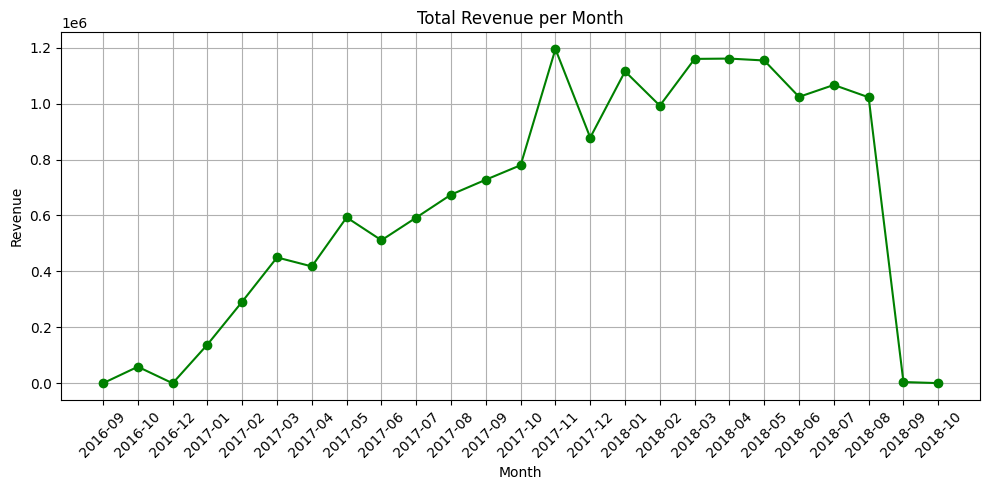

In [ ]:
# Visualisasi Revenue per Month
import matplotlib.pyplot as plt

plt.figure(figsize=(10, 5))
plt.plot(revenue_per_month['year-month'].astype(str), revenue_per_month['payment_value'], marker='o', color='green')
plt.title('Total Revenue per Month')
plt.xlabel('Month')
plt.ylabel('Revenue')
plt.grid(True)
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

Grafik di atas menunjukkan bahwa terjadi tren kenaikan signifikan dari akhir tahun 2016 hingga pertengahan 2018. Pada awal periode, nilai transaksi masih relatif rendah, namun mulai meningkat konsisten sejak awal 2017 hingga mencapai puncaknya pada pertengahan 2018.

Di bulan november 2017, terjadi kenaikan yang cukup ekstrem. Kenaikan ini disebabkan oleh adanya fenomena **Black Friday** yang terjadi pada minggu keempat bulan November 2017. Pada periode akhir 2018, terlihat adanya penurunan tajam, diasumsikan karena data penjualan yang belum lengkap.

Adanya kenaikan signifikan dari awal periode mengindikasikan adanya pertumbuhan aktivitas penjualan dan peningkatan volume transaksi pelanggan. Secara keseluruhan, grafik ini menggambarkan bahwa periode 2017–2018 merupakan fase pertumbuhan paling kuat dalam total nilai transaksi bulanan.

In [ ]:
# Hitung total revenue per quarter
revenue_per_quarter = df_order_payment.groupby('year-quarter')['payment_value'].sum().reset_index()

revenue_per_quarter

,year-quarter,payment_value
0,2016-3,252.24
1,2016-4,59110.10
2,2017-1,880259.65
3,2017-2,1521983.23
4,2017-3,1994541.69
5,2017-4,2852962.16
6,2018-1,3267119.64
7,2018-2,3338648.13
8,2018-3,2093405.61
9,2018-4,589.67


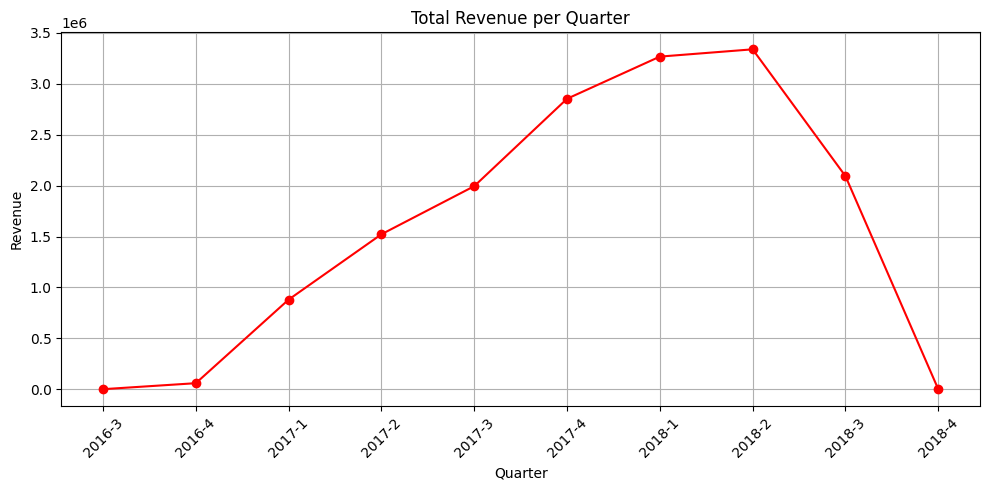

In [ ]:
# Visualisasi Revenue per Quarter
import matplotlib.pyplot as plt

plt.figure(figsize=(10, 5))
plt.plot(revenue_per_quarter['year-quarter'].astype(str), revenue_per_quarter['payment_value'], marker='o', color='red')
plt.title('Total Revenue per Quarter')
plt.xlabel('Quarter')
plt.ylabel('Revenue')
plt.grid(True)
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

Grafik di atas menunjukkan bahwa secara keseluruhan, terlihat  peningkatan yang stabil dan konsisten dari Q4 2016 hingga Q2 2018. Pada awal periode (Q4 2016), nilai transaksi masih relatif rendah, memasuki tahun 2017, setiap kuartal menunjukkan kenaikan signifikan, menandakan peningkatan performa penjualan dan pertumbuhan jumlah pelanggan.

Puncak transaksi terjadi pada Q2 hingga Q3 2018, mencerminkan periode paling produktif dengan volume dan nilai transaksi tertinggi.

Secara umum, grafik ini menggambarkan bahwa pertumbuhan bisnis paling pesat terjadi sepanjang 2017 hingga pertengahan 2018, sebelum mengalami sedikit koreksi pada akhir periode.

In [ ]:
# Hitung total revenue per tahun
revenue_per_year = df_order_payment.groupby('year')['payment_value'].sum().reset_index()

revenue_per_year

,year,payment_value
0,2016,59362.34
1,2017,7249746.73
2,2018,8699763.05


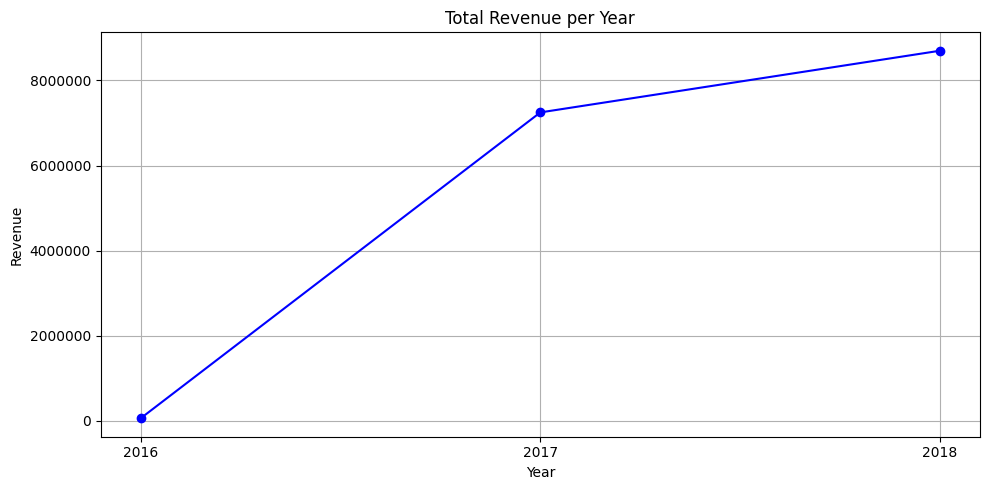

In [ ]:
# Visualisasi Revenue per Tahun
import matplotlib.pyplot as plt
import matplotlib.ticker as ticker

plt.figure(figsize=(10, 5))
plt.plot(revenue_per_year['year'].astype(str), revenue_per_year['payment_value'], marker='o', color='blue')
plt.title('Total Revenue per Year')
plt.xlabel('Year')
plt.ylabel('Revenue')
plt.grid(True)
plt.gca().yaxis.set_major_formatter(ticker.StrMethodFormatter('{x:.0f}'))
plt.tight_layout()
plt.show()

Grafik ini menunjukkan bahwa pada tahun 2016, nilai transaksi masih relatif rendah. Namun, memasuki tahun 2017, terjadi lonjakan nilai transaksi yang cukup besar, menandakan adanya ekspansi bisnis, peningkatan jumlah pelanggan aktif, serta stabilitas operasional yang lebih baik.

Pada tahun 2018, meskipun data tahun 2018 belum selesai, total nilai transaksi kembali meningkat dan mencapai puncak tertingginya, menunjukkan performa bisnis yang semakin matang serta tingginya aktivitas pembelian dari pelanggan.

Secara keseluruhan, tren tahunan ini menggambarkan pertumbuhan bisnis yang positif dan berkelanjutan dari tahun ke tahun, dengan indikasi bahwa strategi penjualan dan akuisisi pelanggan di tahun 2017–2018 memberikan dampak signifikan terhadap peningkatan nilai transaksi.

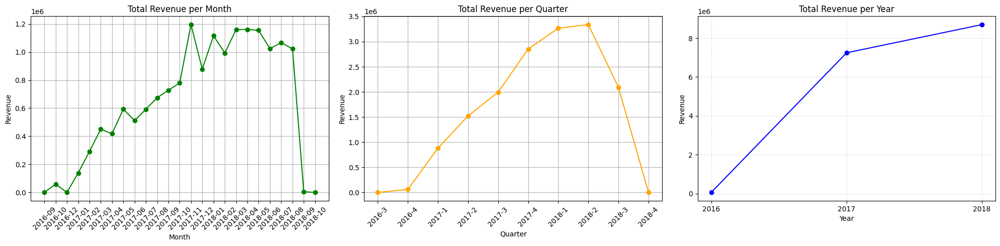

In [ ]:
# Visualisasi 3 grafik dalam 1 figure
import matplotlib.pyplot as plt

# Buat 3 grafik sejajar
fig, axs = plt.subplots(1, 3, figsize=(20, 5))

# Revenue per Month
axs[0].plot(revenue_per_month['year-month'].astype(str),
            revenue_per_month['payment_value'],
            marker='o', color='green')
axs[0].set_title('Total Revenue per Month')
axs[0].set_xlabel('Month')
axs[0].set_ylabel('Revenue')
axs[0].grid(True)
axs[0].tick_params(axis='x', rotation=45)

# Revenue per Quarter
axs[1].plot(revenue_per_quarter['year-quarter'].astype(str),
            revenue_per_quarter['payment_value'],
            marker='o', color='orange')
axs[1].set_title('Total Revenue per Quarter')
axs[1].set_xlabel('Quarter')
axs[1].set_ylabel('Revenue')
axs[1].grid(True)
axs[1].tick_params(axis='x', rotation=45)

#Revenue per Year
axs[2].plot(revenue_per_year['year'],
            revenue_per_year['payment_value'],
            marker='o', color='blue')
axs[2].set_title('Total Revenue per Year')
axs[2].set_xlabel('Year')
axs[2].set_ylabel('Revenue')
axs[2].grid(True, linestyle='--', alpha=0.4)
axs[2].set_xticks(revenue_per_year['year'])
axs[2].set_xticklabels(revenue_per_year['year'].astype(int))

plt.tight_layout()
plt.show()


Secara tahunan, Olist mengalami pertumbuhan positif dan berkelanjutan dari nilai transaksi yang masih rendah di 2016, melonjak signifikan pada 2017, hingga mencapai performa terbaik di 2018. Pola ini menegaskan bahwa tahun **2017–2018** merupakan fase ekspansi dan stabilisasi bisnis, dengan kontribusi kuat dari meningkatnya jumlah pelanggan aktif dan efektivitas strategi pemasaran berbasis event.

## Order Generated by Olist

**Q1 Berapa jumlah total pesanan yang dilakukan di Olist dari bulan ke bulan, quarter ke quarter, dan tahun ke tahun, dan bagaimana variasinya berdasarkan bulan atau musim tertentu?**

In [ ]:
total_order = df_orders['order_id'].count()
total_order

np.int64(99441)

In [ ]:
# Hitung jumlah order per bulan
orders_per_month = df_orders.groupby(df_orders['year-month'])['order_id'].count()

orders_per_month

,order_id
year-month,
2016-09,4
2016-10,324
2016-12,1
2017-01,800
2017-02,1780
2017-03,2682
2017-04,2404
2017-05,3700
2017-06,3245


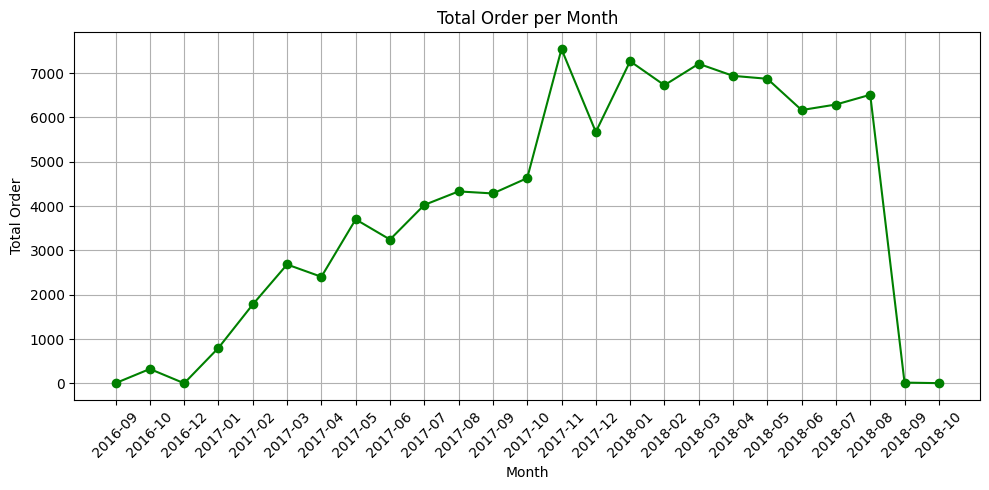

In [ ]:
# Visualisasi order per month
import matplotlib.pyplot as plt

orders_per_month_reset = orders_per_month.reset_index()

plt.figure(figsize=(10, 5))
plt.plot(
    orders_per_month_reset['year-month'],
    orders_per_month_reset['order_id'],
    marker='o',
    linestyle='-',
    color='green'
)

plt.title('Total Order per Month')
plt.xlabel('Month')
plt.ylabel('Total Order')
plt.grid(True)
plt.xticks(rotation=45)  # memiringkan label sumbu X
plt.tight_layout()
plt.show()

Grafik jumlah order per bulan menunjukkan bahwa terlihat adanya tren peningkatan pesanan yang signifikan sepanjang tahun 2017, dimulai dari periode awal (2016 akhir) dengan volume pesanan yang masih rendah.

Puncak aktivitas terjadi sekitar November 2017, di mana adanya peristiwa **Black Friday**.

Setelah itu, volume pesanan relatif stabil pada kisaran tinggi hingga pertengahan 2018, sebelum akhirnya mengalami penurunan tajam menjelang akhir 2018 yang diasumsikan karena data penjualan belum lengkap

In [ ]:
# Hitung jumlah order per quarter
orders_per_quarter = df_orders.groupby(df_orders['year-quarter'])['order_id'].count()

orders_per_quarter

,order_id
year-quarter,
2016-3,4
2016-4,325
2017-1,5262
2017-2,9349
2017-3,12642
2017-4,17848
2018-1,21208
2018-2,19979
2018-3,12820


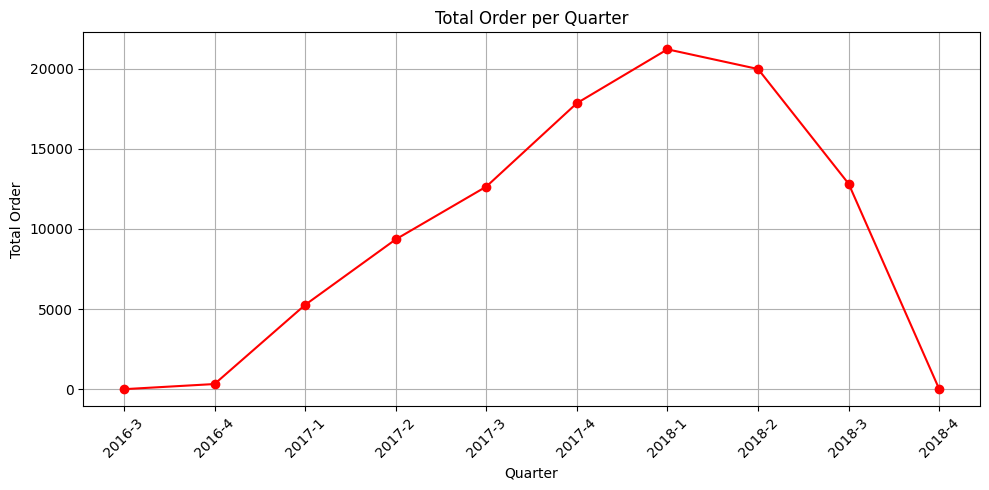

In [ ]:
# Visualisasi order per quarter
import matplotlib.pyplot as plt

orders_per_quarter_reset = orders_per_quarter.reset_index()

plt.figure(figsize=(10, 5))
plt.plot(
    orders_per_quarter_reset['year-quarter'],
    orders_per_quarter_reset['order_id'],
    marker='o',
    linestyle='-',
    color='red'
)

plt.title('Total Order per Quarter')
plt.xlabel('Quarter')
plt.ylabel('Total Order')
plt.grid(True)
plt.xticks(rotation=45)  # memiringkan label sumbu X
plt.tight_layout()
plt.show()

Grafik jumlah order per Quartal memperlihatkan pola yang lebih halus namun tetap menunjukkan tren serupa. Pertumbuhan pesanan meningkat secara konsisten dari Q3 2016 hingga Q1 2018, menandakan fase ekspansi dan peningkatan aktivitas transaksi.

Puncak jumlah pesanan terjadi pada Q1 2018, karena jumlah order pada bulan Q1 menunjukkan angka yang stabil dan relatif tinggi dari bulan-bulan sebelumnya. Setelah itu mulai tampak penurunan bertahap hingga Q4 2018.

In [ ]:
# Hitung jumlah order per tahun
orders_per_year = df_orders.groupby(df_orders['year'])['order_id'].count()

orders_per_year

,order_id
year,
2016,329
2017,45101
2018,54011


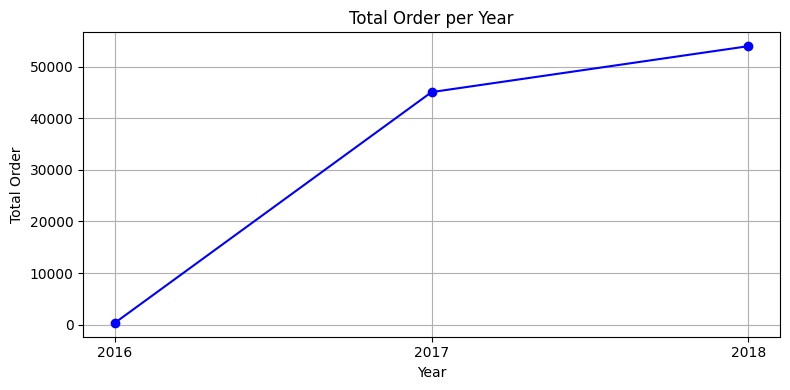

In [ ]:
# Visualisasi jumlah order per tahun
import matplotlib.pyplot as plt

orders_per_year_reset = orders_per_year.reset_index()

plt.figure(figsize=(8, 4))
plt.plot(orders_per_year_reset['year'],
         orders_per_year_reset['order_id'],
         marker='o', linestyle='-', color='blue')

plt.title('Total Order per Year')
plt.xlabel('Year')
plt.ylabel('Total Order')
plt.grid(True)
plt.xticks(orders_per_year_reset['year'].astype(int))
plt.tight_layout()
plt.show()

Grafik jumlah order tahunan menunjukkan bahwa pada tahun 2016 jumlah order yang tercatat masih relatif sedikit, namun memasuki tahun 2017, terjadi peningkatan jumlah order yang cukup signifikan, menandakan mulai tumbuhnya kepercayaan pelanggan, perluasan jangkauan pasar, serta peningkatan efektivitas dalam strategi pemasaran dan distribusi.

Puncaknya terjadi pada tahun 2018, saat jumlah order mencapai titik tertinggi dibandingkan dua tahun sebelumnya. Hal ini menunjukkan bahwa Olist telah berhasil memperkuat ekosistem marketplace-nya dan menarik lebih banyak pelanggan baru

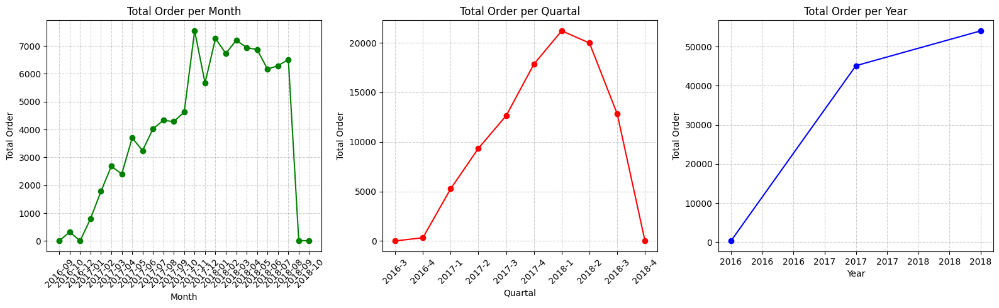

In [ ]:
# Grafik order per month, quarter, year
import matplotlib.pyplot as plt
import matplotlib.ticker as ticker

# Reset index
orders_per_month_reset = orders_per_month.reset_index()
orders_per_quarter_reset = orders_per_quarter.reset_index()
orders_per_year_reset = orders_per_year.reset_index()

# Buat 3 grafik sejajar
fig, axs = plt.subplots(1, 3, figsize=(16, 5))

# Grafik 1: Jumlah Order per Bulan
axs[0].plot(
    orders_per_month_reset['year-month'],
    orders_per_month_reset['order_id'],
    marker='o',
    linestyle='-',
    color='green'
)
axs[0].set_title('Total Order per Month')
axs[0].set_xlabel('Month')
axs[0].set_ylabel('Total Order')
axs[0].grid(True, linestyle='--', alpha=0.6)
axs[0].tick_params(axis='x', rotation=45)

# Grafik 2: Jumlah Order per Quarter
axs[1].plot(
    orders_per_quarter_reset['year-quarter'],
    orders_per_quarter_reset['order_id'],
    marker='o',
    linestyle='-',
    color='red'
)
axs[1].set_title('Total Order per Quartal')
axs[1].set_xlabel('Quartal')
axs[1].set_ylabel('Total Order')
axs[1].grid(True, linestyle='--', alpha=0.6)
axs[1].tick_params(axis='x', rotation=45)

# Grafik 3: Jumlah Order per Tahun
axs[2].plot(
    orders_per_year_reset['year'],
    orders_per_year_reset['order_id'],
    marker='o',
    linestyle='-',
    color='blue'
)
axs[2].set_title('Total Order per Year')
axs[2].set_xlabel('Year')
axs[2].set_ylabel('Total Order')
axs[2].grid(True, linestyle='--', alpha=0.6)
axs[2].xaxis.set_major_formatter(ticker.StrMethodFormatter('{x:.0f}'))

# Merapikan layout
plt.tight_layout()
plt.show()

Secara tahunan, total order menunjukkan lonjakan besar dari 2016 ke 2017, mengindikasikan peningkatan kepercayaan pelanggan, efektivitas strategi pemasaran, serta perluasan jaringan merchant. Tahun 2018 menjadi periode dengan jumlah order tertinggi, menggambarkan kematangan operasional dan keberhasilan Olist dalam memperkuat posisi sebagai marketplace besar di Brasil.

In [ ]:
total_order = df_orders['order_id'].count()
total_order

np.int64(99441)

## Average Order Value

**Q1 Berapa nilai rata-rata transaksi (Average Order Value/AOV) dari bulan ke bulan, quarter ke quarter, dan tahun ke tahun di Olist, dan bagaimana pengaruhnya berdasarkan kategori produk?**

In [ ]:
# Gabungkan dataset
product_join = df_orders.merge(
    df_payment[['order_id', 'payment_value']],
    on='order_id',
    how='left'
).merge(
    df_order_items[['order_id', 'product_id', 'price']],
    on='order_id',
    how='left'
)

In [ ]:
# Hitung total revenue dan total order unik per bulan
total_revenue_month = product_join.groupby('year-month')['payment_value'].sum()
total_order_month = product_join.groupby('year-month')['order_id'].nunique()

# Hitung AOV per bulan
aov_month = (total_revenue_month / total_order_month).reset_index()
aov_month.columns = ['year-month', 'average_order_value']
aov_month['average_order_value'] = aov_month['average_order_value'].round(2)

# Urutkan hasil berdasarkan waktu
aov_month = aov_month.sort_values('year-month')

aov_month

,year-month,average_order_value
0,2016-09,97.12
1,2016-10,234.94
2,2016-12,19.62
3,2017-01,236.27
4,2017-02,196.46
5,2017-03,203.11
6,2017-04,212.52
7,2017-05,197.57
8,2017-06,187.64
9,2017-07,184.95


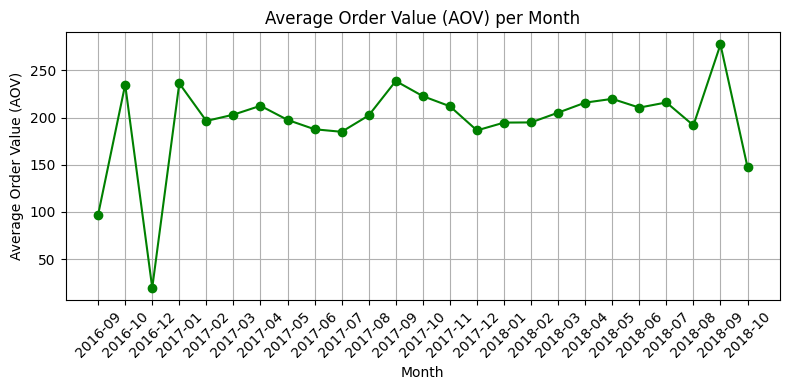

In [ ]:
# Visualisasi AOV per Month

import matplotlib.pyplot as plt
plt.figure(figsize=(8,4))
plt.plot(aov_month['year-month'], aov_month['average_order_value'], marker='o', linestyle='-', color='green')
plt.title('Average Order Value (AOV) per Month')
plt.xlabel('Month')
plt.ylabel('Average Order Value (AOV)')
plt.grid(True)
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

Grafik di atas menunjukkan bahwa rata-rata nilai pesanan (AOV) cenderung stabil sepanjang periode 2017–2018, dengan beberapa fluktuasi ekstrem di awal dan akhir periode.
Terlihat adanya lonjakan AOV pada Oktober 2016 dan September 2018, yang kemungkinan disebabkan oleh pembelian produk bernilai tinggi atau adanya kampanye promosi yang mendorong pembelian barang mahal.

In [ ]:
# Hitung total revenue dan total order unik per quarter
total_revenue_quarter = product_join.groupby('year-quarter')['payment_value'].sum()
total_order_quarter = product_join.groupby('year-quarter')['order_id'].nunique()

# Hitung AOV per quarter
aov_quarter = (total_revenue_quarter / total_order_quarter).reset_index()
aov_quarter.columns = ['year-quarter', 'average_order_value']
aov_quarter['average_order_value'] = aov_quarter['average_order_value'].round(2)

# Urutkan hasil berdasarkan waktu
aov_quarter = aov_quarter.sort_values('year-quarter')

aov_quarter


,year-quarter,average_order_value
0,2016-3,97.12
1,2016-4,234.28
2,2017-1,205.90
3,2017-2,197.97
4,2017-3,209.13
5,2017-4,206.66
6,2018-1,198.35
7,2018-2,215.61
8,2018-3,203.80
9,2018-4,147.42


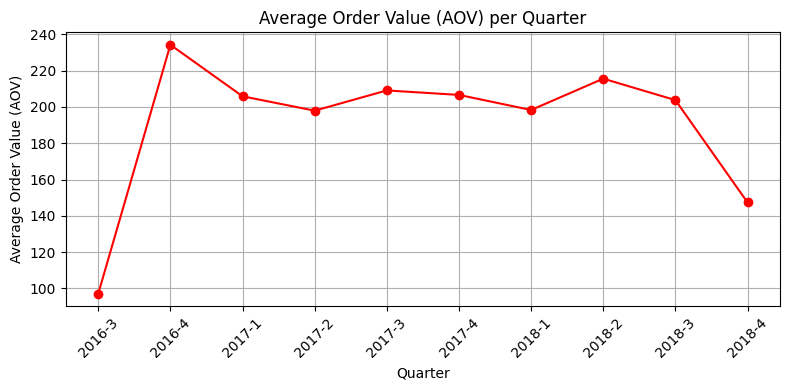

In [ ]:
import matplotlib.pyplot as plt

plt.figure(figsize=(8,4))
plt.plot(aov_quarter['year-quarter'], aov_quarter['average_order_value'], marker='o', linestyle='-', color='red')
plt.title('Average Order Value (AOV) per Quarter')
plt.xlabel('Quarter')
plt.ylabel('Average Order Value (AOV)')
plt.grid(True)
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()


Rata-rata nilai transaksi per kuartal (AOV) cenderung stabil di kisaran 190–220 sepanjang 2017–2018, dengan lonjakan awal pada akhir 2016 dan sedikit penurunan di akhir 2018.
Pola ini menunjukkan bahwa pertumbuhan pendapatan Olist lebih didorong oleh peningkatan jumlah pesanan, bukan oleh kenaikan nilai rata-rata per transaksi.

In [ ]:
# Hitung total revenue dan total order unik per year
total_revenue_year = product_join.groupby('year')['payment_value'].sum()
total_order_year = product_join.groupby('year')['order_id'].nunique()

# Hitung AOV per bulan
aov_year = (total_revenue_year / total_order_year).reset_index()
aov_year.columns = ['year', 'average_order_value']
aov_year['average_order_value'] = aov_year['average_order_value'].round(2)

# Urutkan hasil berdasarkan waktu
aov_year = aov_year.sort_values('year')

aov_year


,year,average_order_value
0,2016,232.61
1,2017,205.46
2,2018,206.02


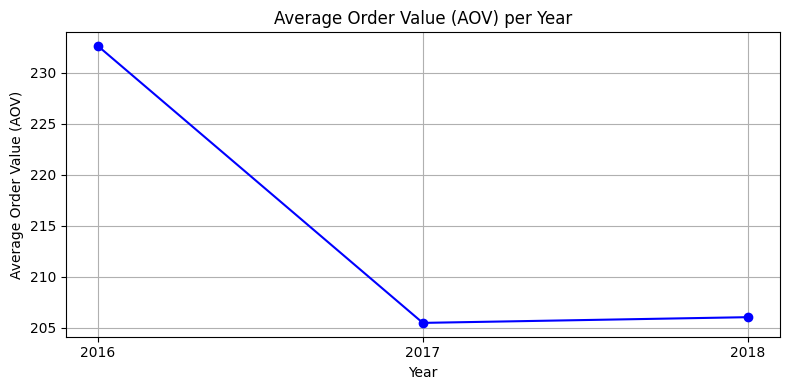

In [ ]:
import matplotlib.pyplot as plt

plt.figure(figsize=(8,4))
plt.plot(aov_year['year'], aov_year['average_order_value'], marker='o', linestyle='-', color='blue')
plt.title('Average Order Value (AOV) per Year')
plt.xlabel('Year')
plt.ylabel('Average Order Value (AOV)')
plt.grid(True)
plt.xticks(aov_year['year'])
plt.tight_layout()
plt.show()

Rata-rata nilai transaksi per tahun (AOV) menunjukkan tren yang relatif stagnan selama periode 2016–2018.
Terjadi sedikit penurunan dari 2016 ke 2017, diikuti dengan stabilisasi pada 2018, menandakan bahwa meskipun jumlah pesanan meningkat signifikan, nilai rata-rata per transaksi tidak ikut naik.
Hal ini mengindikasikan bahwa pertumbuhan bisnis Olist lebih ditopang oleh volume penjualan daripada peningkatan nilai per pembelian.

Keseluruhan AOV

In [ ]:
revenue = product_join['payment_value'].sum()
orders = product_join['order_id'].nunique()

total_aov = revenue / orders
total_aov = total_aov.round(2)
total_aov

np.float64(205.86)

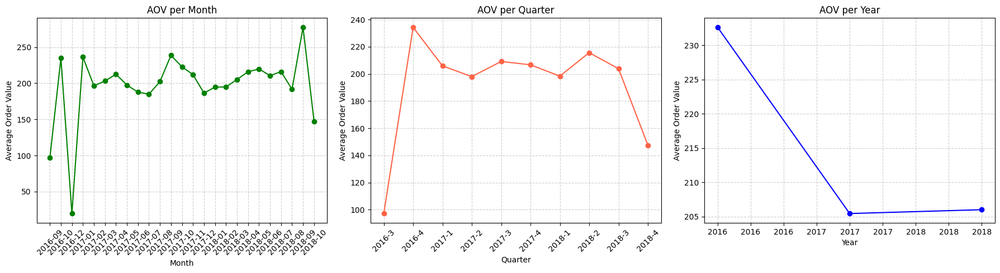

In [ ]:
fig, axs = plt.subplots(1, 3, figsize=(18, 5))

# Grafik 1 - Per Bulan
axs[0].plot(
    aov_month['year-month'],
    aov_month['average_order_value'],
    marker='o',
    color='green'
)
axs[0].set_title('AOV per Month')
axs[0].set_xlabel('Month')
axs[0].set_ylabel('Average Order Value')
axs[0].tick_params(axis='x', rotation=45)
axs[0].ticklabel_format(style='plain', axis='y')
axs[0].grid(True, linestyle='--', alpha=0.6)

# Grafik 2 - Per Kuartal
axs[1].plot(
    aov_quarter['year-quarter'],
    aov_quarter['average_order_value'],
    marker='o',
    color='tomato'
)
axs[1].set_title('AOV per Quarter')
axs[1].set_xlabel('Quarter')
axs[1].set_ylabel('Average Order Value')
axs[1].tick_params(axis='x', rotation=45)
axs[1].ticklabel_format(style='plain', axis='y')
axs[1].grid(True, linestyle='--', alpha=0.6)

# Grafik 3 - Per Tahun
axs[2].plot(
    aov_year['year'],
    aov_year['average_order_value'],
    marker='o',
    color='blue'
)
axs[2].set_title('AOV per Year')
axs[2].set_xlabel('Year')
axs[2].set_ylabel('Average Order Value')
axs[2].xaxis.set_major_formatter(ticker.StrMethodFormatter('{x:.0f}'))
axs[2].ticklabel_format(style='plain', axis='y')
axs[2].grid(True, linestyle='--', alpha=0.6)

plt.tight_layout()
plt.show()

Secara tahunan, tren AOV bahkan sedikit menurun dari 2016 ke 2017 dan kemudian stabil di 2018. Ini menegaskan bahwa **pertumbuhan pendapatan Olist lebih didorong oleh peningkatan jumlah pesanan, bukan oleh kenaikan nilai transaksi per pelanggan.**

Dengan kata lain, strategi ekspansi Olist berhasil meningkatkan aktivitas pembelian, namun belum meningkatkan nilai rata-rata per order secara signifikan.

**Q1 Bagaimana Average Order Value berdasarkan kategori produk?**

In [ ]:
# Gabungkan order_items dengan product untuk tahu kategori produk
df_order_product = df_order_items.merge(
    df_product_translated[['product_id', 'product_category_name_english']],
    on='product_id',
    how='left'
)

# Gabungkan dengan payments agar dapat payment_value per order
df_order_product = df_order_product.merge(
    df_payment[['order_id', 'payment_value']],
    on='order_id',
    how='left'
)

# Gabungkan dengan orders agar dapat info waktu order
df_order_product = df_order_product.merge(
    df_orders[['order_id', 'order_purchase_timestamp']],
    on='order_id',
    how='left'
)

# Hitung total revenue dan jumlah order unik per kategori
aov_per_category = df_order_product.groupby('product_category_name_english').agg({
    'payment_value': 'sum',
    'order_id': 'nunique'
}).reset_index()

# Hitung AOV per kategori
aov_per_category['average_order_value'] = (
    aov_per_category['payment_value'] / aov_per_category['order_id']
).round(2)

# Urutkan dari AOV tertinggi
aov_per_category = aov_per_category.sort_values(by='average_order_value', ascending=False)

aov_per_category


,product_category_name_english,payment_value,order_id,average_order_value
14,computers,279121.55,181,1542.11
34,fixed_telephony,207010.26,217,953.96
64,small_appliances_home_oven_and_coffee,51229.32,75,683.06
0,agro_industry_and_commerce,118730.61,182,652.37
45,home_appliances_2,124563.46,234,532.32
...,...,...,...,...
11,cds_dvds_musicals,1199.43,12,99.95
29,fashion_childrens_clothes,785.67,8,98.21
10,books_technical,24915.44,260,95.83
35,flowers,2213.01,29,76.31


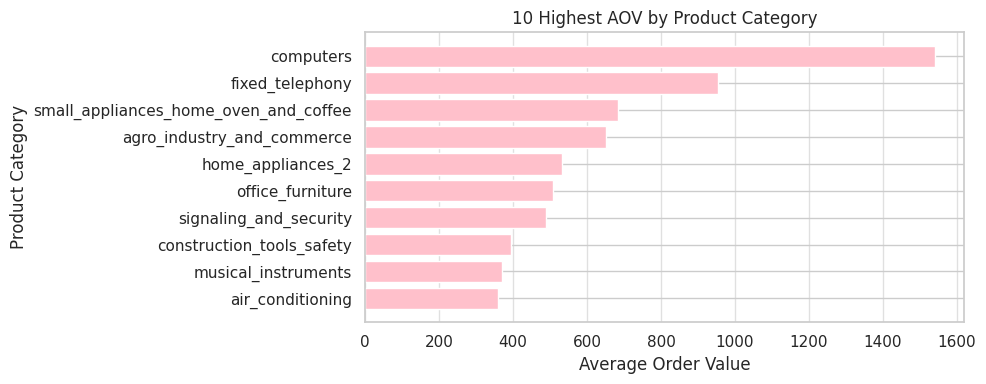

In [ ]:
import matplotlib.pyplot as plt

plt.figure(figsize=(10,4))
plt.barh(
    aov_per_category['product_category_name_english'].head(10),
    aov_per_category['average_order_value'].head(10),
    color='pink'
)

plt.title('10 Highest AOV by Product Category')
plt.xlabel('Average Order Value')
plt.ylabel('Product Category')
plt.gca().invert_yaxis()  # biar kategori tertinggi di atas
plt.grid(True, axis='x',  alpha=0.6)
plt.tight_layout()
plt.show()


Kategori produk dengan rata-rata nilai transaksi (AOV) tertinggi didominasi oleh **produk teknologi dan elektronik.**

Kategori “computers” menempati posisi pertama dengan AOV tertinggi (~1.500 BRL), diikuti oleh “fixed_telephony” dan “small appliances (home, oven, coffee)”.

Hal ini menunjukkan bahwa **produk dengan harga tinggi namun frekuensi pembelian rendah memberikan kontribusi besar terhadap total pendapatan per transaksi.**
Sementara itu, **kategori seperti “office_furniture” dan “home_appliances” memperlihatkan potensi dari sektor rumah tangga dan bisnis kecil.**

## High Sales Product

In [ ]:
# Gabungkan order_items dengan order (untuk ambil tanggal order)
df_sales_time = df_order_items.merge(
    df_orders[['order_id', 'order_purchase_timestamp']],
    on='order_id',
    how='left'
)

# Pastikan kolom waktu dalam format datetime
df_sales_time['order_purchase_timestamp'] = pd.to_datetime(df_sales_time['order_purchase_timestamp'], errors='coerce')

# Tambahkan kolom waktu turunan
df_sales_time['year'] = df_sales_time['order_purchase_timestamp'].dt.year
df_sales_time['month'] = df_sales_time['order_purchase_timestamp'].dt.month
df_sales_time['quarter'] = df_sales_time['order_purchase_timestamp'].dt.to_period('Q').astype(str)
df_sales_time['year_month'] = df_sales_time['order_purchase_timestamp'].dt.to_period('M').astype(str)


In [ ]:
sales_month = (
    df_sales_time.groupby('year_month')['price']
    .sum()
    .reset_index()
    .rename(columns={'price': 'total_sales'})
    .sort_values('year_month')
)

sales_month.head()


,year_month,total_sales
0,2016-09,267.36
1,2016-10,49507.66
2,2016-12,10.90
3,2017-01,120312.87
4,2017-02,247303.02


In [ ]:
sales_quarter = (
    df_sales_time.groupby('quarter')['price']
    .sum()
    .reset_index()
    .rename(columns={'price': 'total_sales'})
    .sort_values('quarter')
)

sales_quarter.head()


,quarter,total_sales
0,2016Q3,267.36
1,2016Q4,49518.56
2,2017Q1,741960.19
3,2017Q2,1299036.97
4,2017Q3,1696404.85


In [ ]:
sales_year = (
    df_sales_time.groupby('year')['price']
    .sum()
    .reset_index()
    .rename(columns={'price': 'total_sales'})
    .sort_values('year')
)

sales_year.head()


,year,total_sales
0,2016,49785.92
1,2017,6155806.98
2,2018,7386050.80


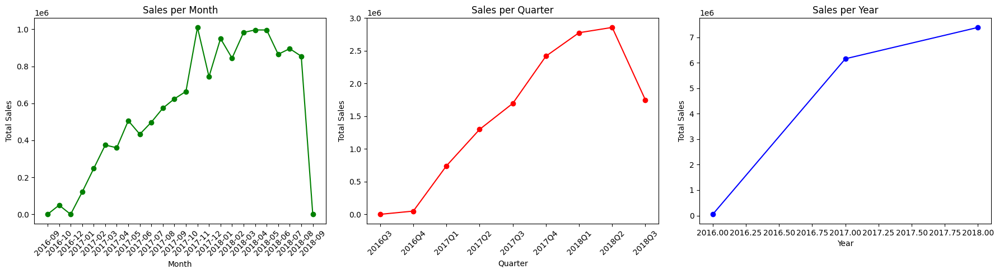

In [ ]:
import matplotlib.pyplot as plt

fig, axes = plt.subplots(1, 3, figsize=(18,5))

# Bulanan
axes[0].plot(sales_month['year_month'], sales_month['total_sales'], marker='o', color = 'green')
axes[0].set_title('Sales per Month')
axes[0].set_xlabel('Month')
axes[0].set_ylabel('Total Sales')
axes[0].tick_params(axis='x', rotation=45)

# Kuartal
axes[1].plot(sales_quarter['quarter'], sales_quarter['total_sales'], marker='o', color='red')
axes[1].set_title('Sales per Quarter')
axes[1].set_xlabel('Quarter')
axes[1].set_ylabel('Total Sales')
axes[1].tick_params(axis='x', rotation=45)

# Tahunan
axes[2].plot(sales_year['year'], sales_year['total_sales'], marker='o', color='blue')
axes[2].set_title('Sales per Year')
axes[2].set_xlabel('Year')
axes[2].set_ylabel('Total Sales')

plt.tight_layout()
plt.show()


In [ ]:
# Gabungkan dataset produk dan order items untuk tahu sales (sales menggunakan price)
df_product_price = (
    df_order_items
    .merge(df_product_translated[['product_id', 'product_category_name_english']], on='product_id', how='left')
)

# Total sales per category
category_sales = (
    df_product_price.groupby('product_category_name_english')['price']
    .sum()
    .reset_index()
    .rename(columns={'price': 'total_sales'})  # ubah nama kolom
    .sort_values('total_sales', ascending=False)
)

category_sales

,product_category_name_english,total_sales
43,health_beauty,1258681.34
70,watches_gifts,1205005.68
7,bed_bath_table,1036988.68
65,sports_leisure,988048.97
15,computers_accessories,911954.32
...,...,...
35,flowers,1110.04
46,home_comfort_2,760.27
11,cds_dvds_musicals,730.00
29,fashion_childrens_clothes,569.85


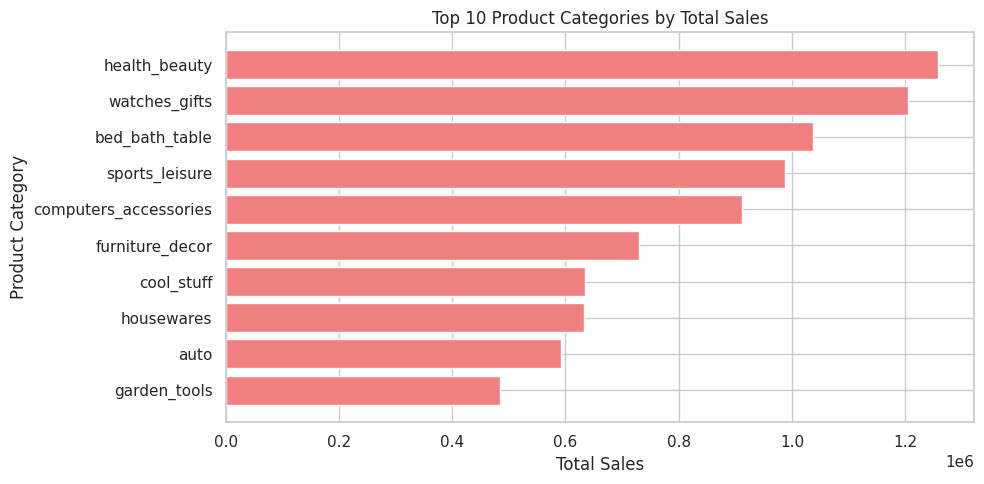

In [ ]:
# Visualisasi product by sales
plt.figure(figsize=(10,5))
plt.barh(category_sales.head(10)['product_category_name_english'],
         category_sales.head(10)['total_sales'],
         color='lightcoral')
plt.title('Top 10 Product Categories by Total Sales')
plt.xlabel('Total Sales')
plt.ylabel('Product Category')
plt.gca().invert_yaxis()
plt.tight_layout()
plt.show()


Secara keseluruhan (3 tahun), Penjualan Olist didorong terutama oleh produk **kebutuhan pribadi dan rumah tangga**. **Kategori kecantikan, hadiah, dan perlengkapan rumah memiliki potensi besar untuk strategi promosi volume tinggi dan retensi pelanggan jangka panjang.**

In [ ]:
# Gabungkan dataset sebelumnya dengan dataser order
df_year_product_price = (
    df_product_price
    .merge(df_orders[['order_id', 'order_purchase_timestamp', 'year']], on='order_id', how='left')
)

# Hitung total payment value per kategori per tahun
category_price_per_year = df_year_product_price.groupby(
    ['year', 'product_category_name_english'], as_index=False
)['price'].sum()

# Ambil 10 kategori dengan payment value tertinggi di masing-masing tahun
top10_each_year = (
    category_price_per_year
    .sort_values(['year', 'price'], ascending=[True, False])
    .rename(columns={'price': 'total_sales'})  # ubah nama kolom
    .groupby('year')
    .head(10)
)

top10_each_year

,year,product_category_name_english,total_sales
18,2016,furniture_decor,5880.78
25,2016,perfumery,5688.70
20,2016,health_beauty,4687.48
29,2016,toys,4465.09
8,2016,consoles_games,3882.26
30,2016,watches_gifts,3360.24
27,2016,sports_leisure,3333.64
2,2016,auto,1833.25
0,2016,air_conditioning,1707.09
3,2016,baby,1630.16


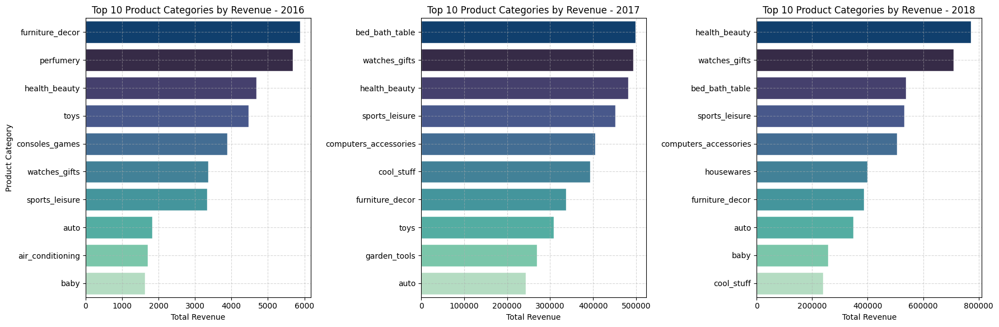

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns

# Ambil 3 tahun utama dari data
years = sorted(top10_each_year['year'].unique())[:3]

# Buat 3 grafik sejajar
fig, axes = plt.subplots(1, len(years), figsize=(18, 6))
sns.set(style="whitegrid")

for i, year in enumerate(years):
    data_year = (
        top10_each_year[top10_each_year['year'] == year]
        .sort_values('total_sales', ascending=False)
    )

    # Palet mako dengan gradasi biru → teal
    base_palette = sns.color_palette("mako", n_colors=len(data_year))

    # Highlight kategori revenue tertinggi
    top_cat = data_year['product_category_name_english'].iloc[0]
    colors = [
        '#003F7D' if cat == top_cat else base_palette[j]
        for j, cat in enumerate(data_year['product_category_name_english'])
    ]

    sns.barplot(
        data=data_year,
        x='total_sales',
        y='product_category_name_english',
        palette=colors,
        ax=axes[i]
    )

    axes[i].set_title(f"Top 10 Product Categories by Revenue - {year}", fontsize=12)
    axes[i].set_xlabel("Total Revenue")
    axes[i].set_ylabel("Product Category" if i == 0 else "")
    axes[i].ticklabel_format(style='plain', axis='x')
    axes[i].grid(True, linestyle='--', alpha=0.5)

plt.tight_layout()
plt.show()

Secara tahunan, tren kategori produk dengan pendapatan tertinggi di Olist menunjukkan pergeseran fokus konsumen:

2016: Pendapatan didominasi oleh kategori f**urniture_decor, perfumery, dan health_beauty**, menandakan minat awal pelanggan pada produk rumah tangga dan kecantikan.

2017: Kategori **bed_bath_table dan watches_gifts** naik ke posisi teratas, menunjukkan peningkatan permintaan pada produk gaya hidup dan personal use.

2018: **Health_beauty** menjadi kategori dengan revenue tertinggi secara konsisten, diikuti oleh watches_gifts dan bed_bath_table, yang mempertegas pergeseran ke arah kebutuhan pribadi dan self-care.

Dalam tiga tahun terakhir, Olist mengalami diversifikasi pendapatan dari produk rumah tangga ke produk pribadi dan lifestyle. Tren ini menunjukkan peluang besar untuk memperluas promosi pada kategori health & beauty serta gaya hidup premium yang memiliki pertumbuhan stabil dari tahun ke tahun.

## Profit Growth

**Q1 Bagaimana profit Olist berkembang dari bulan ke bulan, quarter ke quarter, tahun ke tahun, apakah ada tren terlihat dalam periode tersebut?**

In [ ]:
df_profit = df_order_items.merge(
    df_payment[['order_id', 'payment_value']],
    on='order_id',
    how='left'
)

df_profit

,order_id,order_item_id,product_id,seller_id,shipping_limit_date,price,freight_value,payment_value
0,00010242fe8c5a6d1ba2dd792cb16214,1,4244733e06e7ecb4970a6e2683c13e61,48436dade18ac8b2bce089ec2a041202,2017-09-19 09:45:35,58.90,13.29,72.19
1,00018f77f2f0320c557190d7a144bdd3,1,e5f2d52b802189ee658865ca93d83a8f,dd7ddc04e1b6c2c614352b383efe2d36,2017-05-03 11:05:13,239.90,19.93,259.83
2,000229ec398224ef6ca0657da4fc703e,1,c777355d18b72b67abbeef9df44fd0fd,5b51032eddd242adc84c38acab88f23d,2018-01-18 14:48:30,199.00,17.87,216.87
3,00024acbcdf0a6daa1e931b038114c75,1,7634da152a4610f1595efa32f14722fc,9d7a1d34a5052409006425275ba1c2b4,2018-08-15 10:10:18,12.99,12.79,25.78
4,00042b26cf59d7ce69dfabb4e55b4fd9,1,ac6c3623068f30de03045865e4e10089,df560393f3a51e74553ab94004ba5c87,2017-02-13 13:57:51,199.90,18.14,218.04
...,...,...,...,...,...,...,...,...
117599,fffc94f6ce00a00581880bf54a75a037,1,4aa6014eceb682077f9dc4bffebc05b0,b8bc237ba3788b23da09c0f1f3a3288c,2018-05-02 04:11:01,299.99,43.41,343.40
117600,fffcd46ef2263f404302a634eb57f7eb,1,32e07fd915822b0765e448c4dd74c828,f3c38ab652836d21de61fb8314b69182,2018-07-20 04:31:48,350.00,36.53,386.53
117601,fffce4705a9662cd70adb13d4a31832d,1,72a30483855e2eafc67aee5dc2560482,c3cfdc648177fdbbbb35635a37472c53,2017-10-30 17:14:25,99.90,16.95,116.85
117602,fffe18544ffabc95dfada21779c9644f,1,9c422a519119dcad7575db5af1ba540e,2b3e4a2a3ea8e01938cabda2a3e5cc79,2017-08-21 00:04:32,55.99,8.72,64.71


In [ ]:
# Gabungkan dataset order dengan profit
df_profit_time = df_profit.merge(
    df_orders[['order_id', 'order_purchase_timestamp']],
    on='order_id',
    how='left'
)

In [ ]:
df_profit_time['order_purchase_timestamp'] = pd.to_datetime(df_profit_time['order_purchase_timestamp'])
df_profit_time['year'] = df_profit_time['order_purchase_timestamp'].dt.year
df_profit_time['year-month'] = df_profit_time['order_purchase_timestamp'].dt.strftime('%Y-%m')
df_profit_time['year-quarter'] = df_profit_time['order_purchase_timestamp'].dt.year.astype(str) + '-' + df_orders['order_purchase_timestamp'].dt.quarter.astype(str)

**Estimasi profit Olist**

Berdasarkan dokumentasi publik dan analisis riset, Olist mengambil komisi sekitar 10–20% dari transaksi (tergantung kategori). Maka, dianggap rata-rata komisi Olist = 15% dari payment_value.

In [ ]:
commission_rate = 0.15

df_profit_time['olist_profit'] = df_profit_time['payment_value'] * commission_rate


**Profit Olist per Bulan**

In [ ]:
olist_profit_month = df_profit_time.groupby(['year-month'])['olist_profit'].sum().reset_index()
olist_profit_month['period'] = olist_profit_month['year-month'].astype(str)
olist_profit_month

,year-month,olist_profit,period
0,2016-09,52.1280,2016-09
1,2016-10,11087.1870,2016-10
2,2016-12,2.9430,2016-12
3,2017-01,28166.9115,2017-01
4,2017-02,51620.2185,2017-02
5,2017-03,79044.2490,2017-03
6,2017-04,75849.8295,2017-04
7,2017-05,108675.6825,2017-05
8,2017-06,90112.9905,2017-06
9,2017-07,110593.9620,2017-07


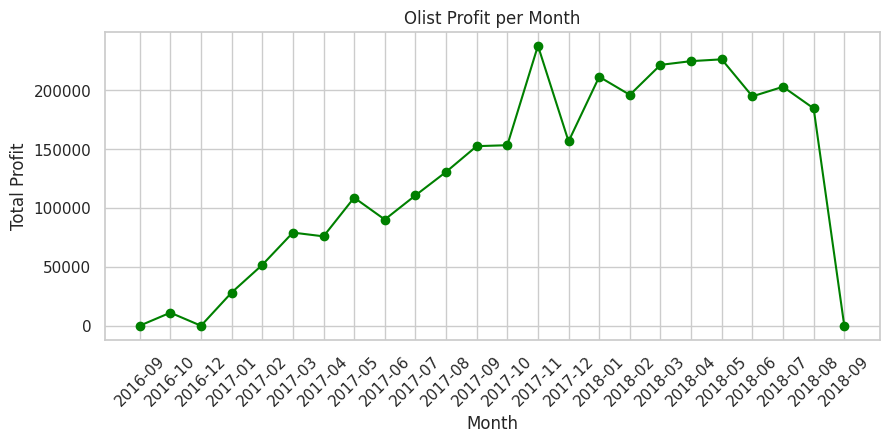

In [ ]:
import matplotlib.pyplot as plt

# Profit per Month
plt.figure(figsize=(10, 4))
plt.plot(olist_profit_month['year-month'], olist_profit_month['olist_profit'], marker='o', color='green')
plt.title('Olist Profit per Month')
plt.xlabel('Month')
plt.ylabel('Total Profit')
plt.grid(True)
plt.xticks(rotation=45)
plt.show()

Berdasarkan grafik profit bulanan, terlihat adanya tren pertumbuhan yang kuat dan konsisten sepanjang periode analisis. Pada awal 2016, profit masih relatif rendah, namun mulai meningkat tajam memasuki pertengahan 2017 hingga mencapai puncak tertinggi sekitar Maret–Mei 2018 dengan total profit di atas 200.000. Setelah periode puncak tersebut, profit masih stabil di level tinggi sebelum akhirnya mengalami penurunan signifikan di akhir 2018. Pola ini menunjukkan bahwa bisnis mengalami ekspansi yang cepat di pertengahan periode, kemungkinan didorong oleh peningkatan penjualan atau efisiensi operasional, namun penurunan di bulan-bulan terakhir bisa disebabkan karena data yang belum lengkap

**Profit Olist per Quarter**

In [ ]:
olist_profit_quarter = df_profit_time.groupby('year-quarter')['olist_profit'].sum().reset_index()
olist_profit_quarter

,year-quarter,olist_profit
0,2016-1,2663.5545
1,2016-2,3261.0225
2,2016-3,2455.1460
3,2016-4,1145.0175
4,2017-1,312030.2340
5,2017-2,336043.4790
6,2017-3,304504.6740
7,2017-4,204697.0815
8,2018-1,379300.4685
9,2018-2,415036.3920


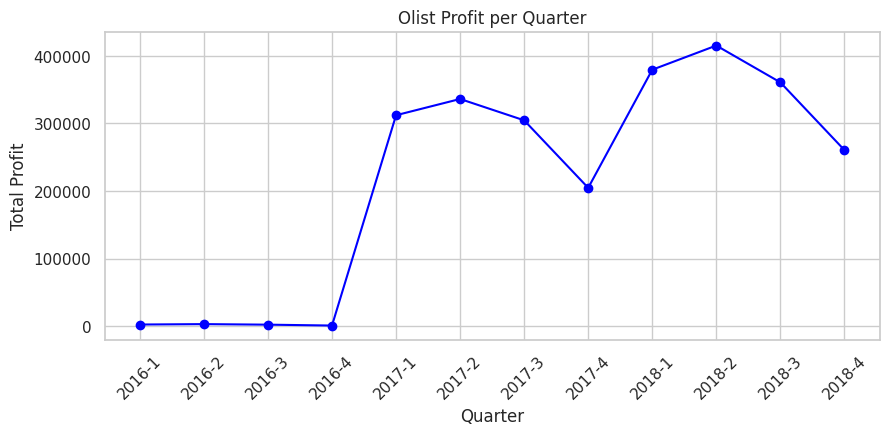

In [ ]:
import matplotlib.pyplot as plt

# Profit per Quarter
plt.figure(figsize=(10, 4))
plt.plot(olist_profit_quarter['year-quarter'], olist_profit_quarter['olist_profit'], marker='o', color='blue')
plt.title('Olist Profit per Quarter')
plt.xlabel('Quarter')
plt.ylabel('Total Profit')
plt.grid(True)
plt.xticks(rotation=45)
plt.show()

Jika dilihat dari profit per kuartal, pertumbuhan terlihat fluktuatif namun tetap menunjukkan arah positif secara keseluruhan. Profit pada kuartal awal tahun 2016 masih sangat rendah, namun melonjak pesat mulai kuartal pertama 2017 dan mencapai titik tertinggi pada kuartal kedua 2018. Meskipun terdapat beberapa penurunan pada kuartal tertentu seperti 2017 Q3 dan 2018 Q3, level profit masih jauh lebih tinggi dibandingkan periode awal.

**Profit Olist per Tahun**

In [ ]:
olist_profit_year = df_profit_time.groupby('year')['olist_profit'].sum().reset_index()
olist_profit_year

,year,olist_profit
0,2016,1.114226e+04
1,2017,1.374141e+06
2,2018,1.660937e+06


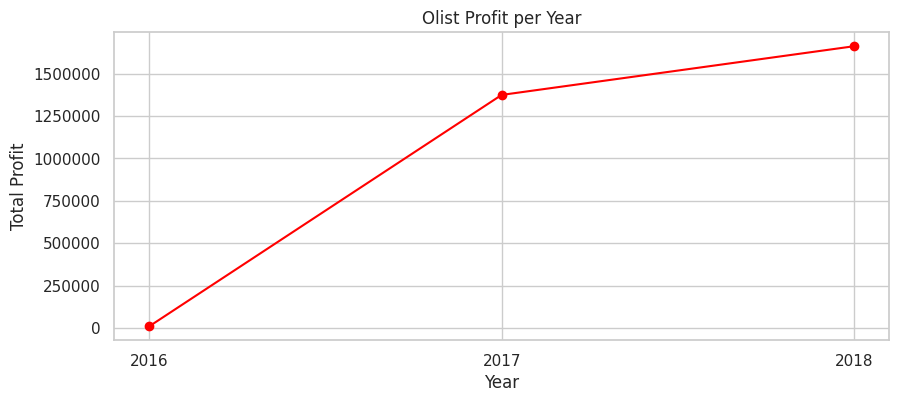

In [ ]:
import matplotlib.pyplot as plt

# Profit per Year
plt.figure(figsize=(10, 4))
plt.plot(olist_profit_year['year'], olist_profit_year['olist_profit'], marker='o', color='red')
plt.title('Olist Profit per Year')
plt.xlabel('Year')
plt.ylabel('Total Profit')
plt.xticks(olist_profit_year['year'].astype(int))
plt.gca().yaxis.set_major_formatter(ticker.StrMethodFormatter('{x:.0f}'))
plt.show()

Secara tahunan, grafik menunjukkan pertumbuhan profit yang sangat signifikan dan berkelanjutan. Total profit yang hampir tidak ada pada tahun 2016 meningkat tajam menjadi sekitar 1,3 juta pada 2017, lalu terus naik hingga mendekati 1,7 juta pada 2018. Lonjakan besar pada 2017 menandakan fase ekspansi atau peningkatan kinerja operasional yang sukses, sedangkan pertumbuhan yang lebih moderat pada 2018 menunjukkan bisnis telah mencapai fase stabil dengan profit yang tetap tinggi. Secara keseluruhan, tren tahunan ini menggambarkan bahwa bisnis berhasil memperkuat profitabilitasnya dari tahun ke tahun, dengan kemampuan mempertahankan performa meskipun pertumbuhannya mulai melambat.

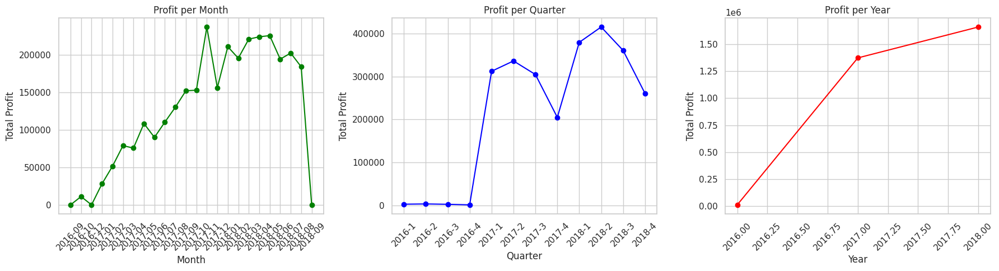

In [ ]:
import matplotlib.pyplot as plt
# Plot sejajar
fig, axes = plt.subplots(1, 3, figsize=(18, 5))

# Profit per bulan
axes[0].plot(olist_profit_month['year-month'], olist_profit_month['olist_profit'], marker='o', color='green')
axes[0].set_title('Profit per Month')
axes[0].set_xlabel('Month')
axes[0].set_ylabel('Total Profit')
axes[0].tick_params(axis='x', rotation=45)
axes[0].grid(True)

# Profit per quarter
axes[1].plot(olist_profit_quarter['year-quarter'], olist_profit_quarter['olist_profit'], marker='o', color='blue')
axes[1].set_title('Profit per Quarter')
axes[1].set_xlabel('Quarter')
axes[1].set_ylabel('Total Profit')
axes[1].tick_params(axis='x', rotation=45)

# Profit per tahun
axes[2].plot(olist_profit_year['year'], olist_profit_year['olist_profit'], marker='o', color='red')
axes[2].set_title('Profit per Year')
axes[2].set_xlabel('Year')
axes[2].set_ylabel('Total Profit')
axes[2].tick_params(axis='x', rotation=45)

plt.tight_layout()
plt.show()

Secara keseluruhan, ketiga grafik profit per bulan, kuartal, dan tahun menunjukkan pola pertumbuhan bisnis yang kuat dengan dinamika yang berbeda di tiap skala waktu. Pada grafik bulanan, profit meningkat secara konsisten hingga mencapai puncak di pertengahan 2018, mencerminkan efektivitas strategi penjualan dan peningkatan efisiensi operasional, meskipun penurunan di akhir periode. Secara kuartalan, tren yang muncul bersifat fluktuatif namun tetap positif, menunjukkan adanya siklus musiman di mana performa biasanya menguat pada awal hingga pertengahan tahun dan melemah di kuartal akhir. Sementara itu, pada grafik tahunan, profit memperlihatkan lonjakan besar dari 2016 ke 2017 dan terus tumbuh di 2018, menandakan keberhasilan bisnis dalam memperluas skala dan meningkatkan profitabilitas jangka panjang.  Ketiga perspektif ini menggambarkan bisnis yang tidak hanya mengalami pertumbuhan cepat, tetapi juga tengah bertransisi menuju fase stabilisasi dengan tantangan untuk menjaga konsistensi profit di tengah fluktuasi musiman

**Q2 Produk apa yang memiliki margin keuntungan tertinggi dan bagaimana Olist dapat meningkatkan profitabilitas di semua kategori?**

In [ ]:
# Gabungkan dataset
df_items_payment_cat = df_order_items.merge(
    df_product_translated[['product_id', 'product_category_name_english']],
    on='product_id',
    how='left'
).merge(
    df_payment[['order_id', 'payment_value']],
    on='order_id',
    how='left'
)

df_profit_cat = df_items_payment_cat.groupby(['order_id', 'product_category_name_english'], as_index=False).agg({
    'price': 'sum',
    'freight_value': 'sum',
    'payment_value': 'sum'
})

# Hitung total sales dan profit per produk
df_profit_cat['profit'] = df_profit_cat['payment_value'] - (df_profit_cat['price'] + df_profit_cat['freight_value'])
df_profit_cat = df_profit_cat.sort_values('profit', ascending=False)

df_profit_cat

,order_id,product_category_name_english,price,freight_value,payment_value,profit
1441,03caa2c082116e1d31e67e9ae3700499,fixed_telephony,13440.00,224.08,109312.64,95648.56
65278,ab14fdcfbe524636d65ee38360e22ce8,auto,1974.00,288.80,45256.00,42993.20
10368,1b15974a0141d54e36626dca3fdc731a,computers_accessories,2000.00,202.40,44048.00,41845.60
16975,2cc9089445046817a7539d90805e6e5a,agro_industry_and_commerce,5934.60,146.94,36489.24,30407.70
89228,e8fa22c3673b1dd17ea315021b1f0f61,drinks,2849.90,168.70,30186.00,27167.40
...,...,...,...,...,...,...
26985,4689b1816de42507a7d63a4617383c59,home_appliances_2,6019.86,1393.84,529.55,-6884.15
93607,f489949dbe23cf9313deb342913ece0c,computers_accessories,9520.14,535.08,1436.46,-8618.76
26916,465c2e1bee4561cb39e0db8c5993aafc,agro_industry_and_commerce,9888.00,665.28,1758.88,-8794.40
29125,4bfcba9e084f46c8e3cb49b0fa6e6159,musical_instruments,10856.10,255.30,740.76,-10370.64


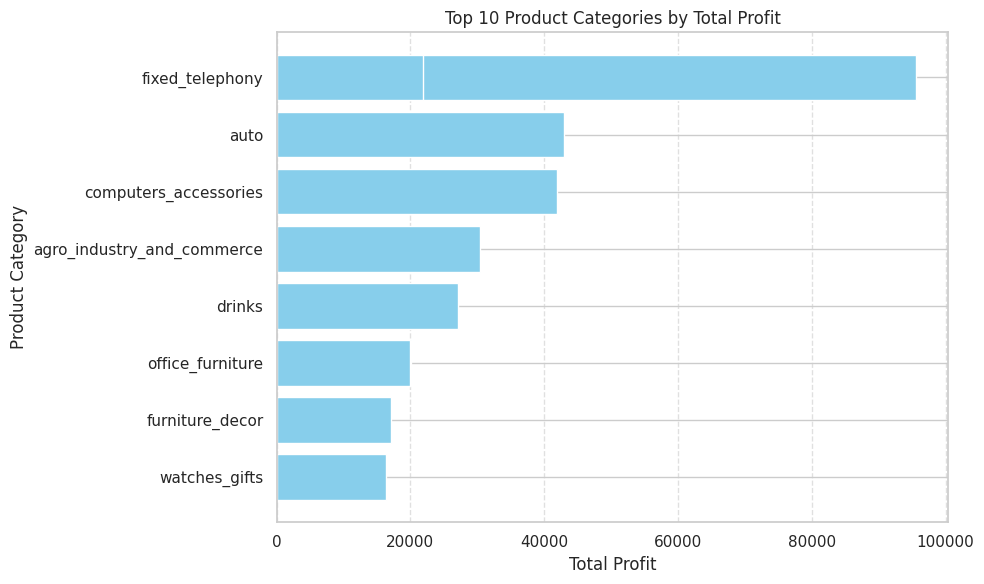

In [ ]:
# Ambil 10 kategori dengan profit tertinggi
top10_category_profit = df_profit_cat.head(10)

# --- Visualisasi ---
plt.figure(figsize=(10, 6))
plt.barh(
    top10_category_profit['product_category_name_english'],
    top10_category_profit['profit'],
    color='skyblue'
)
plt.title('Top 10 Product Categories by Total Profit', fontsize=12)
plt.xlabel('Total Profit')
plt.ylabel('Product Category')
plt.gca().invert_yaxis()  # Biar ranking tertinggi di atas
plt.grid(axis='x', linestyle='--', alpha=0.6)
plt.tight_layout()
plt.show()

Berdasarkan perhitungan profit per kategori, Olist tampaknya memiliki disparitas margin antar kategori, yaitu beberapa kategori menghasilkan profit tinggi (misalnya electronics accessories atau furniture décor), sedangkan kategori lain margin-nya kecil bahkan mendekati nol.

# Customer Behavior and Loyalty

## Repeat Buyer vs One Time Buyer

- Q1 Berapa jumlah pelanggan yang termasuk ke dalam repeat buyer dan one time only buyer?
- Q2 Kota mana yang memiliki one time only dan repeat buyer terbanyak?
- Q3 Bagaimana kontribusi repeat buyer dan one time only buyer terhadap revenue?
- Q4 produk apa yang paling berkontribusi dalam menciptakan loyalitas pelanggan di Olist?
- Q5 Berapa kali rata-rata repeat buyer melakukan pembelian?


Hypothesis Question :

- H1 : Apakah kategori produk dapat memengaruhi frekuensi pembelian customer?
- H2 : Apakah lokasi dapat memengaruhi frekuensi pembelian customer?
- H3 : Apakah review score dapat memengaruhi frekuensi pembelian customer?
- H4 : Apakah terdapat perbedaan rata-rata signifikan antara kelompok one time only dan repeat buyer dalam membeli kategori produk?

**Q1 Berapa jumlah pelanggan yang termasuk ke dalam repeat buyer dan one time only buyer?**

In [ ]:
# join dataset
df_orders_customers = df_orders.merge(
    df_customers[['customer_id', 'customer_unique_id']],
    on='customer_id',
    how='left'
)

# hitung customer
customer_orders = df_orders_customers.groupby('customer_unique_id')['order_id'].nunique().reset_index()
customer_orders.rename(columns={'order_id': 'total_orders'}, inplace=True)

# kategorikan customer
customer_orders['buyer_type'] = customer_orders['total_orders'].apply(
    lambda x: 'one_time_buyer' if x == 1 else 'repeat_buyer'
)

# buat variabel
buyer_distribution = customer_orders['buyer_type'].value_counts().reset_index()
buyer_distribution.columns = ['buyer_type', 'total_customers']

# buat kolom persentase
buyer_distribution['percentage'] = (buyer_distribution['total_customers'] / buyer_distribution['total_customers'].sum() * 100).round(2)

buyer_distribution

,buyer_type,total_customers,percentage
0,one_time_buyer,93099,96.88
1,repeat_buyer,2997,3.12


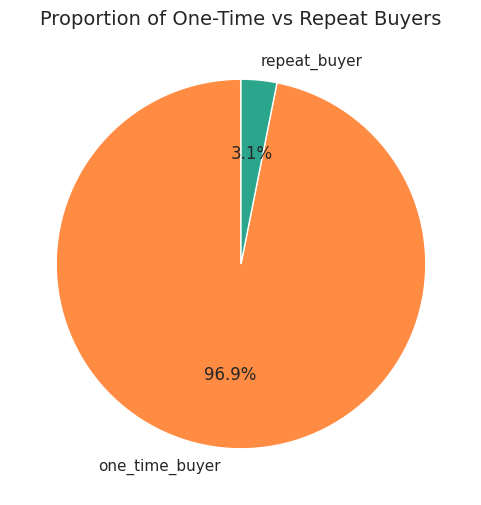

In [ ]:
import matplotlib.pyplot as plt

# data distribusi buyer type
buyer_distribution = customer_orders['buyer_type'].value_counts()

# buat pie chart
plt.figure(figsize=(6,6))
plt.pie(
    buyer_distribution,
    labels=buyer_distribution.index,
    autopct='%1.1f%%',        # tampilkan persentase
    startangle=90,            # mulai dari atas
    colors=['#FF8C42', '#2CA58D'],
    wedgeprops={'edgecolor': 'white', 'linewidth': 1}
)

plt.title('Proportion of One-Time vs Repeat Buyers', fontsize=14)
plt.show()


Berdasarkan visualisasi di atas, terlihat bahwa sebagian besar pelanggan termasuk dalam kategori** one-time buyer**, yaitu pelanggan yang hanya melakukan pembelian satu kali dengan total 93099 dan proporsi mencapai **96,9%** dari total pengguna.

Sementara itu, hanya **3,1%** pelanggan yang termasuk dalam kategori **repeat buyer**, yaitu pelanggan yang melakukan pembelian lebih dari satu kali.

Langkah berikutnya adalah melihat distribusi, dimana pelanggan-pelanggan itu terkonsentrasi, dan apakah pola loyalitasnya seragam di semua wilayah.

**Q2 Kota mana yang memiliki one time only dan repeat buyer terbanyak?**

In [ ]:
# Gabungkan orders dan customers
df_orders_customer = pd.merge(df_orders, df_customers, on='customer_id', how='left')

# Hitung frekuensi pembelian per customer_unique_id
customer_order_freq = (
    df_orders_customer.groupby('customer_unique_id')['order_id']
    .count()
    .reset_index()
    .rename(columns={'order_id': 'order_frequency'})
)

# customer yang hanya beli sekali (one-time buyer)
one_time_customers = customer_order_freq[customer_order_freq['order_frequency'] == 1]['customer_unique_id']

# order dari one-time buyers
one_time_orders = df_orders_customer[df_orders_customer['customer_unique_id'].isin(one_time_customers)]

# data geolocation
one_time_orders_geo = one_time_orders.merge(
    df_geolocation,
    left_on='customer_zip_code_prefix',
    right_on='geolocation_zip_code_prefix',
    how='left'
)

#jumlah one-time buyers unik per kota
one_time_buyers_city = (
    one_time_orders_geo.groupby('geolocation_city')['customer_unique_id']
    .nunique()
    .reset_index()
    .rename(columns={'customer_unique_id': 'one_time_buyer_count'})
    .sort_values(by='one_time_buyer_count', ascending=False)
)

# orders dan customers
df_orders_customer = pd.merge(df_orders, df_customers, on='customer_id', how='left')

# menghitung frekuensi pembelian per customer_unique_id
customer_order_freq = (
    df_orders_customer.groupby('customer_unique_id')['order_id']
    .count()
    .reset_index()
    .rename(columns={'order_id': 'order_frequency'})
)

#  repeat buyer (pembelian > 1 kali)
repeat_customers = customer_order_freq[customer_order_freq['order_frequency'] > 1]['customer_unique_id']

# mengambil data order dari repeat buyers
repeat_orders = df_orders_customer[df_orders_customer['customer_unique_id'].isin(repeat_customers)]

# menggabungkan dengan geolocation untuk tahu asal kota
repeat_orders_geo = repeat_orders.merge(
    df_geolocation,
    left_on='customer_zip_code_prefix',
    right_on='geolocation_zip_code_prefix',
    how='left'
)

# jumlah repeat buyers per kota
repeat_buyers_city = (
    repeat_orders_geo.groupby('geolocation_city')['customer_unique_id']
    .nunique()
    .reset_index()
    .rename(columns={'customer_unique_id': 'repeat_buyer_count'})
    .sort_values(by='repeat_buyer_count', ascending=False)
)

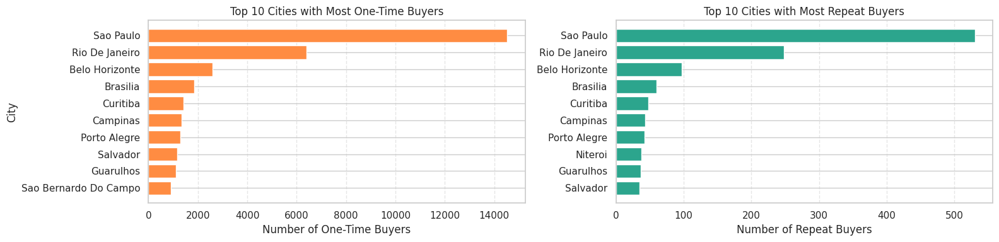

In [ ]:
import matplotlib.pyplot as plt

fig, axes = plt.subplots(1, 2, figsize=(16, 4))

# One-time Buyers
axes[0].barh(
    one_time_buyers_city.head(10)['geolocation_city'].str.title(),
    one_time_buyers_city.head(10)['one_time_buyer_count'],
    color='#FF8C42'
)
axes[0].set_title('Top 10 Cities with Most One-Time Buyers', fontsize=12)
axes[0].set_xlabel('Number of One-Time Buyers')
axes[0].set_ylabel('City')
axes[0].invert_yaxis()
axes[0].grid(axis='x', linestyle='--', alpha=0.5)

# Repeat Buyers
axes[1].barh(
    repeat_buyers_city.head(10)['geolocation_city'].str.title(),
    repeat_buyers_city.head(10)['repeat_buyer_count'],
    color='#2CA58D'
)
axes[1].set_title('Top 10 Cities with Most Repeat Buyers', fontsize=12)
axes[1].set_xlabel('Number of Repeat Buyers')
axes[1].set_ylabel('')
axes[1].invert_yaxis()
axes[1].grid(axis='x', linestyle='--', alpha=0.5)

plt.tight_layout()
plt.show()

Aktivitas pelanggan Olist terkonsentrasi di kota-kota besar seperti **São Paulo dan Rio de Janeiro**, yang menjadi pusat utama transaksi baik dari pembeli baru maupun pelanggan berulang.
Meskipun volume repeat buyer tertinggi juga berasal dari São Paulo, proporsinya masih kecil dibandingkan pelanggan yang hanya bertransaksi sekali.

Kota-kota besar lain seperti **Belo Horizonte, Brasília, dan Curitiba** juga aktif, tetapi tingkat pembelian ulangnya jauh lebih rendah.
Pola ini menegaskan bahwa **loyalitas pelanggan belum sebanding dengan tingginya volume penjualan**, membuka peluang bagi Olist untuk memperkuat strategi retensi, terutama di wilayah dengan basis pelanggan besar namun tingkat repeat purchase masih rendah.

**Q3 Bagaimana kontribusi repeat buyer dan one time only buyer terhadap revenue?**

Total pelanggan unik: 96,096
Repeat buyer: 2,997 (3.12%)
Kontribusi repeat buyer terhadap total revenue: 5.90%




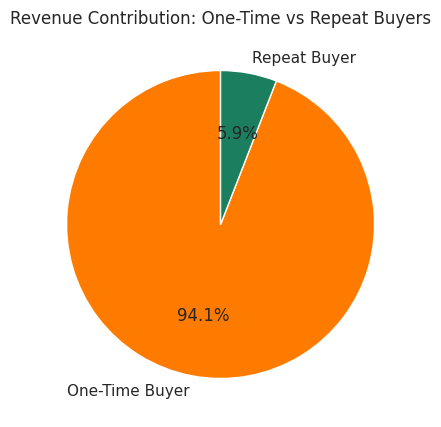

In [ ]:
df_payment_sum = (
    df_payment.groupby('order_id', as_index=False)['payment_value']
    .sum()
)

# Gabungkan dataset payment dengan order
df_order_payment = pd.merge(df_orders, df_payment_sum, on='order_id', how='left')

# Gabungkan lagi dengan dataset customers
df_payment_cust = pd.merge(df_order_payment, df_customers, on='customer_id', how='left')

#  total pelanggan unik
total_customers = df_payment_cust['customer_unique_id'].nunique()

# frekuensi order per pelanggan
order_freq = (
    df_payment_cust.groupby('customer_unique_id')['order_id']
    .nunique()
    .reset_index(name='order_count')
)

# repeat buyer
repeat_buyers = order_freq[order_freq['order_count'] > 1]['customer_unique_id']
repeat_customers = repeat_buyers.nunique()
repeat_rate = repeat_customers / total_customers * 100

# total revenue & revenue dari repeat buyer
revenue_total = df_payment_cust['payment_value'].sum()
revenue_repeat = df_payment_cust[
    df_payment_cust['customer_unique_id'].isin(repeat_buyers)
]['payment_value'].sum()
revenue_share = revenue_repeat / revenue_total * 100

print(f"Total pelanggan unik: {total_customers:,}")
print(f"Repeat buyer: {repeat_customers:,} ({repeat_rate:.2f}%)")
print(f"Kontribusi repeat buyer terhadap total revenue: {revenue_share:.2f}%")
print("\n")

#visualisasi
import matplotlib.pyplot as plt

labels = ['One-Time Buyer', 'Repeat Buyer']
values = [revenue_total - revenue_repeat, revenue_repeat]

plt.figure(figsize=(5,5))
plt.pie(values, labels=labels, autopct='%1.1f%%', startangle=90,colors=['#FF7B00', '#1B7F5F'],
        wedgeprops={'edgecolor': 'white', 'linewidth': 1})
plt.title('Revenue Contribution: One-Time vs Repeat Buyers', fontsize=12)
plt.show()

Dari total 96 ribu pelanggan, hanya 3,1% yang tergolong **repeat buyer**. Angka ini terlihat kecil. Namun saat kita lihat dari sisi kontribusi terhadap pendapatan, hasilnya kelompok kecil ini **menyumbang hampir 6% dari total revenue.**

Artinya, **pelanggan yang kembali bertransaksi memiliki nilai ekonomi hampir dua kali lebih besar dibanding pelanggan baru.**

Meskipun jumlahnya sedikit, mereka memberikan dampak yang signifikan bagi performa bisnis Olist. Ini menjadi sinyal penting bahwa meningkatkan retensi pelanggan bahkan sedikit saja bisa berdampak besar terhadap pertumbuhan penjualan.

**Q4 produk apa yang paling berkontribusi dalam menciptakan loyalitas pelanggan di Olist?**

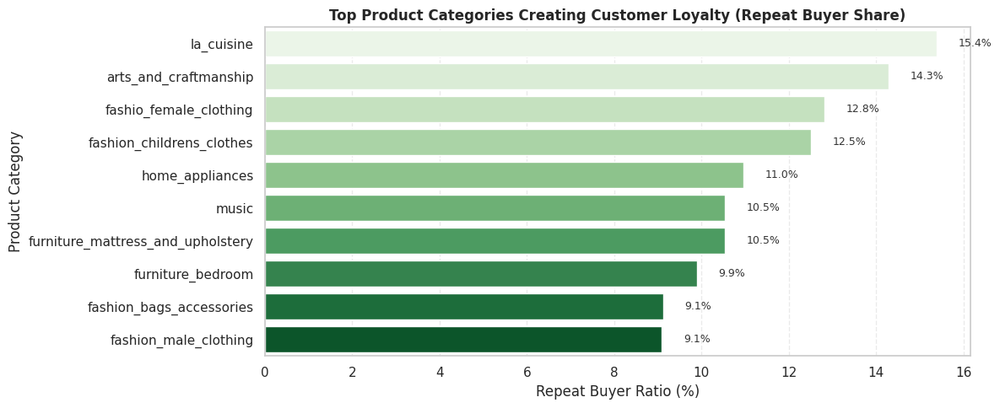

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Gabungkan data order dengan customer dan produk
df_orders_customer_items = (
    df_orders
    .merge(df_customers, on='customer_id', how='left')
    .merge(df_order_items, on='order_id', how='left')
    .merge(df_product_translated[['product_id', 'product_category_name_english']], on='product_id', how='left')
)

#Hitung frekuensi pembelian per customer_unique_id
customer_order_freq = (
    df_orders_customer_items.groupby('customer_unique_id')['order_id']
    .nunique()
    .reset_index(name='order_frequency')
)

# Tandai repeat buyer (lebih dari 1 order)
df_orders_customer_items = df_orders_customer_items.merge(customer_order_freq, on='customer_unique_id', how='left')
df_orders_customer_items['is_repeat'] = df_orders_customer_items['order_frequency'] > 1

# Hitung jumlah unik buyer per kategori (repeat vs one-time)
buyer_stats = (
    df_orders_customer_items
    .groupby(['product_category_name_english', 'is_repeat'])['customer_unique_id']
    .nunique()
    .reset_index(name='buyer_count')
)

#  Hitung total buyer per kategori
total_buyer = (
    buyer_stats
    .groupby('product_category_name_english')['buyer_count']
    .sum()
    .reset_index(name='total_buyer')
)

# Gabungkan untuk hitung rasio repeat buyer
buyer_stats = buyer_stats.merge(total_buyer, on='product_category_name_english', how='left')
buyer_stats['repeat_ratio'] = (buyer_stats['buyer_count'] / buyer_stats['total_buyer']) * 100

# hanya yang repeat
repeat_ratio = buyer_stats[buyer_stats['is_repeat'] == True].sort_values('repeat_ratio', ascending=False).head(10)

# Visualisasi
plt.figure(figsize=(12,5))
sns.barplot(
    data=repeat_ratio,
    x='repeat_ratio',
    y='product_category_name_english',
    palette='Greens'
)
plt.title('Top Product Categories Creating Customer Loyalty (Repeat Buyer Share)', fontsize=12, weight='bold')
plt.xlabel('Repeat Buyer Ratio (%)')
plt.ylabel('Product Category')

# Tambah label angka
for i, v in enumerate(repeat_ratio['repeat_ratio']):
    plt.text(v + 0.5, i, f"{v:.1f}%", va='center', fontsize=9, color='#333')

plt.grid(axis='x', linestyle='--', alpha=0.4)
plt.tight_layout()
plt.show()

Berdasarkan hasil perhitungan repeat buyer ratio, beberapa kategori produk menonjol dalam membangun loyalitas pelanggan:

**-La_cuisine (15.4%)** menjadi kategori dengan rasio repeat buyer tertinggi. Hal ini menunjukkan bahwa produk dapur memiliki tingkat kepuasan dan kebutuhan berulang tinggi, sehingga pelanggan cenderung melakukan pembelian ulang.

**-Arts_and_craftmanship (14.3%)** menempati posisi kedua. Kategori ini kemungkinan didukung oleh komunitas pelanggan yang spesifik dan antusias terhadap produk seni dan kerajinan, sehingga pembelian bersifat kolektif atau lanjutan.

**-Fashion_female_clothing (12.8%)** dan fashion_childrens_clothes (12.5%) juga menunjukkan potensi loyalitas kuat. Produk fashion biasanya memiliki siklus pembelian cepat dan tren berulang, sehingga pelanggan kembali berbelanja dalam waktu singkat.

Sementara kategori seperti fashion_male_clothing (9.1%) dan fashion_bags_accessories (9.1%) menunjukkan loyalitas relatif lebih rendah, yang bisa mengindikasikan pola belanja yang lebih impulsif atau variasi merek yang lebih besar.

**Q5 Berapa kali rata-rata repeat buyer melakukan pembelian?**

📊 Rata-rata repeat buyer melakukan pembelian sebanyak: 2.12 kali
🔼 Frekuensi pembelian tertinggi oleh satu pelanggan: 17 kali
🔽 Frekuensi pembelian terendah (di antara repeat buyers): 2 kali

Distribution of repeat buyer purchase frequency:
order_frequency
2     2745
3      203
4       30
5        8
6        6
7        3
9        1
17       1
Name: count, dtype: int64


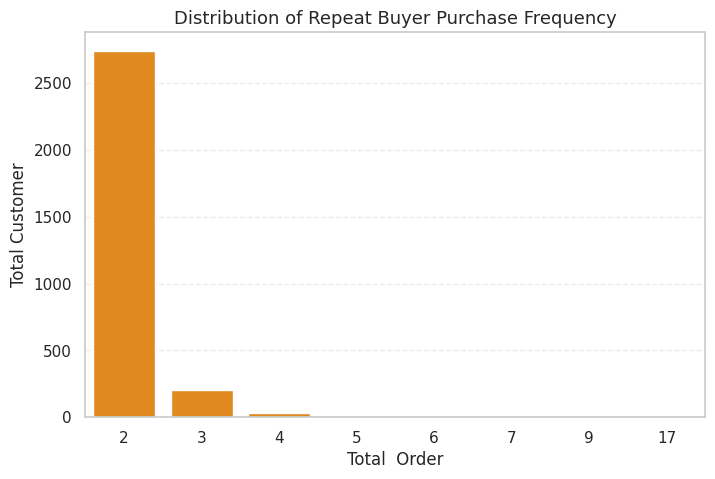

In [ ]:
# Pola Frekuensi Pembelian Repeat Buyer

# Filter repeat buyers (pembelian > 1 kali)
repeat_freq = customer_order_freq[customer_order_freq['order_frequency'] > 1]

# Ringkasan statistik
avg_purchase = repeat_freq['order_frequency'].mean()
max_purchase = repeat_freq['order_frequency'].max()
min_purchase = repeat_freq['order_frequency'].min()

print(f"📊 Rata-rata repeat buyer melakukan pembelian sebanyak: {avg_purchase:.2f} kali")
print(f"🔼 Frekuensi pembelian tertinggi oleh satu pelanggan: {max_purchase} kali")
print(f"🔽 Frekuensi pembelian terendah (di antara repeat buyers): {min_purchase} kali")

# Distribusi pembelian
freq_distribution = repeat_freq['order_frequency'].value_counts().sort_index()
print("\nDistribution of repeat buyer purchase frequency:")
print(freq_distribution)

# Visualisasi distribusi
plt.figure(figsize=(8,5))
sns.barplot(x=freq_distribution.index, y=freq_distribution.values, color="#FF8C00")
plt.title("Distribution of Repeat Buyer Purchase Frequency", fontsize=13)
plt.xlabel("Total  Order")
plt.ylabel("Total Customer")
plt.grid(axis='y', linestyle='--', alpha=0.4)
plt.show()


Dari hasil distribusi frekuensi pembelian, sebagian besar pelanggan repeat buyer hanya melakukan dua kali transaksi, dengan jumlah yang menurun tajam pada pembelian ketiga dan seterusnya.
Hal ini menunjukkan bahwa **loyalitas pelanggan di Olist masih bersifat jangka pendek**.
**Pelanggan mungkin puas pada pengalaman awal, tetapi belum cukup termotivasi untuk terus melakukan pembelian berulang.**

Peluang peningkatan terbesar ada pada mendorong pelanggan dua kali beli menjadi pelanggan tetap melalui strategi personalized recommendation, voucher reactivation, atau post-purchase engagement.

**Uji Normalitas**

**Apakah data frekuensi pembelian terdistribusi normal?**

Statistik: 0.5333, p-value: 0.0000
⚠️ Tolak H₀ → Data tidak terdistribusi normal


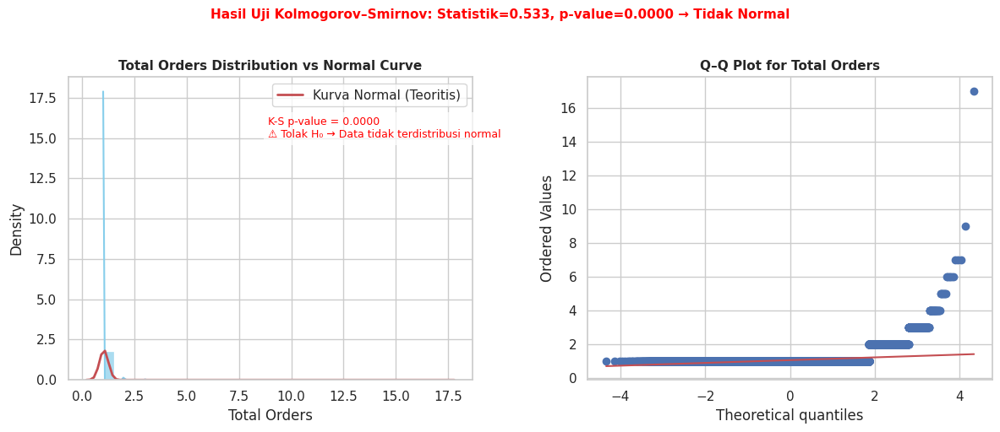

In [ ]:
# 📊 Uji Normalitas Total Orders dengan Kolmogorov–Smirnov Test
from scipy.stats import kstest, norm, probplot
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

data = customer_orders['total_orders']

# Hitung parameter distribusi normal pembanding
mean = np.mean(data)
std = np.std(data)

#  Lakukan uji K-S
stat, p = kstest(data, 'norm', args=(mean, std))

# Interpretasi hasil uji
if p > 0.05:
    kesimpulan = "✅ Gagal Tolak H₀ → Data terdistribusi normal"
    color_text = 'green'
else:
    kesimpulan = "⚠️ Tolak H₀ → Data tidak terdistribusi normal"
    color_text = 'red'

print(f"Statistik: {stat:.4f}, p-value: {p:.4f}")
print(kesimpulan)

#
#  Visualisasi Distribusi & Q–Q Plot
plt.figure(figsize=(12,5))

# Histogram + Kurva Normal
plt.subplot(1, 2, 1)
sns.histplot(data, kde=True, color='skyblue', bins=30, stat='density', alpha=0.7)
xmin, xmax = plt.xlim()
x = np.linspace(xmin, xmax, 100)
p_norm = norm.pdf(x, mean, std)
plt.plot(x, p_norm, 'r', linewidth=2, label='Kurva Normal (Teoritis)')
plt.title('Total Orders Distribution vs Normal Curve', fontsize=11, weight='bold')
plt.xlabel('Total Orders')
plt.ylabel('Density')
plt.legend()

# Tambahkan teks hasil uji di area grafik
plt.text(
    xmax * 0.5, plt.ylim()[1] * 0.8,
    f"K-S p-value = {p:.4f}\n{kesimpulan}",
    fontsize=9, color=color_text, bbox=dict(facecolor='white', alpha=0.7, edgecolor='none')
)

# Q-Q Plot
plt.subplot(1, 2, 2)
probplot(data, dist="norm", plot=plt)
plt.title('Q–Q Plot for Total Orders', fontsize=11, weight='bold')

# Tambahkan kesimpulan global
plt.suptitle(
    f"Hasil Uji Kolmogorov–Smirnov: Statistik={stat:.3f}, p-value={p:.4f} → {'Normal' if p>0.05 else 'Tidak Normal'}",
    fontsize=11, color=color_text, weight='bold', y=1.02
)

plt.tight_layout()
plt.show()

Berdasarkan hasil uji Kolmogorov–Smirnov, diperoleh nilai statistik sebesar 0.533 dengan p-value = 0.000 (< 0.05).
Artinya, H₀ ditolak, sehingga dapat disimpulkan bahwa data total_orders tidak berdistribusi normal.

Secara visual, histogram menunjukkan bahwa sebagian besar pelanggan hanya memiliki jumlah pesanan yang sangat rendah (1–2 order), sedangkan hanya sebagian kecil pelanggan yang melakukan pembelian berulang dengan jumlah yang jauh lebih tinggi. Pola ini menyebabkan distribusi menjadi miring ke kanan (right-skewed).

**Q–Q Plot** memperkuat hasil tersebut — titik-titik data jauh menyimpang dari garis diagonal, terutama di bagian ekor atas, yang menunjukkan adanya outlier pelanggan dengan aktivitas pembelian ekstrem.


Data total_orders tidak memenuhi asumsi kenormalan karena bersifat highly skewed, dengan mayoritas pelanggan berbelanja sangat sedikit dan sebagian kecil pelanggan yang sangat aktif.
Hal ini menandakan adanya polaritas perilaku pelanggan, di mana sebagian kecil pelanggan loyal memberikan kontribusi besar terhadap pendapatan keseluruhan.

**H1 : Apakah kategori produk dapat memengaruhi frekuensi pembelian customer?**

In [ ]:
# Gabungkan order_items dengan product untuk tahu kategori produk
df_product_orders = df_order_items.merge(
    df_product_translated[['product_id', 'product_category_name_english']],
    on='product_id', how='left'
)

# Gabungkan dengan orders (biar tahu customer_id)
df_product_orders = df_product_orders.merge(
    df_orders[['order_id', 'customer_id']],
    on='order_id', how='left'
)

# Gabungkan dengan customers (biar tahu customer_unique_id)
df_product_orders = df_product_orders.merge(
    df_customers[['customer_id', 'customer_unique_id']],
    on='customer_id', how='left'
)

# Hitung total order per customer per kategori produk
category_freq = df_product_orders.groupby(
    ['customer_unique_id', 'product_category_name_english']
)['order_id'].nunique().reset_index()

category_freq.rename(columns={'order_id': 'total_orders'}, inplace=True)
category_freq


,customer_unique_id,product_category_name_english,total_orders
0,0000366f3b9a7992bf8c76cfdf3221e2,bed_bath_table,1
1,0000b849f77a49e4a4ce2b2a4ca5be3f,health_beauty,1
2,0000f46a3911fa3c0805444483337064,stationery,1
3,0000f6ccb0745a6a4b88665a16c9f078,telephony,1
4,0004aac84e0df4da2b147fca70cf8255,telephony,1
...,...,...,...
96442,fffcf5a5ff07b0908bd4e2dbc735a684,health_beauty,1
96443,fffea47cd6d3cc0a88bd621562a9d061,baby,1
96444,ffff371b4d645b6ecea244b27531430a,auto,1
96445,ffff5962728ec6157033ef9805bacc48,watches_gifts,1


In [ ]:
from scipy.stats import kruskal

groups = [g['total_orders'].values for _, g in category_freq.groupby('product_category_name_english')]
stat, p = kruskal(*groups)
print(f'Statistik H = {stat:.3f}, p-value = {p:.3f}')

if p < 0.05 and stat > 0:
    print("H0 ditolak : Kategori produk berpengaruh positif dan signifikan terhadap frekuensi pembelian.")
elif p < 0.05 and stat < 0:
    print("H1 diterima : Kategori produk berpengaruh signifikan, tapi arah pengaruhnya negatif.")
else:
    print("❌ Tidak ada pengaruh signifikan antara kategori produk dan frekuensi pembelian.")


Statistik H = 574.306, p-value = 0.000
H0 ditolak : Kategori produk berpengaruh positif dan signifikan terhadap frekuensi pembelian.


H0: Tidak ada perbedaan signifikan frekuensi pembelian antar kategori produk.

H1: Ada perbedaan signifikan frekuensi pembelian antar kategori produk.

Hasil : **Kategori produk berpengaruh signifikan terhadap frekuensi pembelian (loyalitas pelanggan).**

Berdasarkan hasil analisis, kategori produk terbukti berpengaruh signifikan terhadap frekuensi pembelian pelanggan.
Dengan demikian, **loyalitas pelanggan di Olist dipengaruhi oleh jenis produk yang dibeli, yaitu kategori tertentu memiliki kecenderungan pembelian ulang yang lebih tinggi.**

**H2 : Apakah lokasi dapat memengaruhi frekuensi pembelian customer?**

In [ ]:
import pandas as pd
from scipy.stats import chi2_contingency

# Gabungkan data orders dengan data customers untuk dapat lokasi
df_orders_customers = df_orders.merge(
    df_customers[['customer_id', 'customer_unique_id', 'customer_city', 'customer_state']],
    on='customer_id',
    how='left'
)

# Hitung total order per customer
customer_orders = (
    df_orders_customers.groupby(['customer_unique_id', 'customer_city', 'customer_state'])['order_id']
    .nunique()
    .reset_index()
)

# Kategorikan tipe pembeli
customer_orders['buyer_type'] = customer_orders['order_id'].apply(
    lambda x: 'one_time_buyer' if x == 1 else 'repeat_buyer'
)

# --- UJI CHI-SQUARE ---
# Buat tabel kontingensi antara lokasi (bisa pakai city atau state) dan tipe pembeli
contingency_table = pd.crosstab(customer_orders['customer_state'], customer_orders['buyer_type'])

# Lakukan uji chi-square
chi2, p, dof, expected = chi2_contingency(contingency_table)

print(f"Chi-square statistic: {chi2:.4f}")
print(f"p-value: {p:.4f}")
print(f"Derajat kebebasan (dof): {dof}")
print("\n")

# Interpretasi hasil
if p < 0.05:
    print("H0 diterima : Lokasi customer berpengaruh terhadap frekuensi pembelian (terdapat hubungan).")
    print("➡️ Artinya, perbedaan lokasi (misalnya antar provinsi/kota) dapat memengaruhi kemungkinan pelanggan menjadi repeat buyer.")
else:
    print("H0 ditolak : Lokasi customer tidak berpengaruh terhadap frekuensi pembelian.")
    print("➡️ Artinya, pelanggan dari berbagai lokasi memiliki kecenderungan pembelian yang serupa.")


Chi-square statistic: 32.5646
p-value: 0.1751
Derajat kebebasan (dof): 26


H0 ditolak : Lokasi customer tidak berpengaruh terhadap frekuensi pembelian.
➡️ Artinya, pelanggan dari berbagai lokasi memiliki kecenderungan pembelian yang serupa.


H0 : Tidak terdapat hubungan yang signifikan antara lokasi pelanggan dan frekuensi pembelian.

H1 : Terdapat hubungan yang signifikan antara lokasi pelanggan dan frekuensi pembelian.

Hasil : **Tidak signifikan, tidak terdapat pengaruh antara lokasi customer terhadap frekuensi pembelian.**

Berdasarkan hasil uji Chi-Square, nilai signifikansi (p-value) lebih besar dari 0.05, sehingga disimpulkan bahwa lokasi pelanggan tidak berpengaruh signifikan terhadap frekuensi pembelian.
Hal ini mengindikasikan bahwa **tingkat loyalitas pelanggan cenderung tidak ditentukan oleh faktor geografis, melainkan kemungkinan lebih dipengaruhi oleh faktor lain.**




**H3 : Apakah review score dapat memengaruhi frekuensi pembelian customer?**

In [ ]:
# Gabungkan dengan review untuk ambil nilai review_score
df_orders_review = df_orders_customers.merge(
    df_review[['order_id', 'review_score']],
    on='order_id',
    how='inner'
)

# Hitung frekuensi pembelian setiap customer
customer_orders = df_orders_review.groupby('customer_unique_id')['order_id'].nunique().reset_index()
customer_orders.rename(columns={'order_id': 'total_orders'}, inplace=True)

# Kategorikan pelanggan
customer_orders['buyer_type'] = customer_orders['total_orders'].apply(
    lambda x: 'one_time_buyer' if x == 1 else 'repeat_buyer'
)

# Ambil rata-rata review score tiap pelanggan
avg_review_per_customer = df_orders_review.groupby('customer_unique_id')['review_score'].mean().reset_index()

# Gabungkan dua variabel (review_score & buyer_type)
df_review_loyalty = customer_orders.merge(avg_review_per_customer, on='customer_unique_id', how='left')


Kolmogorov-Smirnov test: stat=0.3249, p-value=0.0000
⚠️ Data review_score tidak terdistribusi normal (tolak H₀)


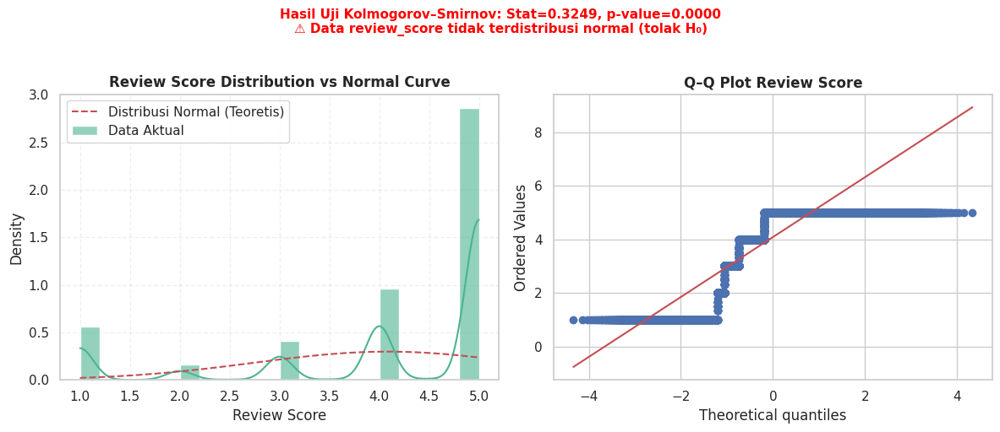

In [ ]:
from scipy.stats import kstest, norm, probplot
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

#  Uji Normalitas Kolmogorov–Smirnov
data = df_review_loyalty['review_score'].dropna()
mean, std = np.mean(data), np.std(data)
stat, p = kstest(data, 'norm', args=(mean, std))

print(f"Kolmogorov-Smirnov test: stat={stat:.4f}, p-value={p:.4f}")

# Hasil interpretasi
if p > 0.05:
    conclusion = "✅ Data review_score terdistribusi normal (tidak tolak H₀)"
    color_text = 'green'
else:
    conclusion = "⚠️ Data review_score tidak terdistribusi normal (tolak H₀)"
    color_text = 'red'

print(conclusion)

#  VISUALISASI: HISTOGRAM + Q–Q PLOT
plt.figure(figsize=(12, 5))

#  Histogram dengan Kurva Normal Teoretis
plt.subplot(1, 2, 1)
sns.histplot(data, bins=20, kde=True, color='#4CB391', stat='density', alpha=0.6, label='Data Aktual')

# Kurva normal teoretis
x = np.linspace(min(data), max(data), 100)
plt.plot(x, norm.pdf(x, mean, std), 'r--', label='Distribusi Normal (Teoretis)')
plt.title('Review Score Distribution vs Normal Curve', fontsize=12, weight='bold')
plt.xlabel('Review Score')
plt.ylabel('Density')
plt.legend()
plt.grid(True, linestyle='--', alpha=0.3)

# Q–Q Plot
plt.subplot(1, 2, 2)
probplot(data, dist="norm", plot=plt)
plt.title('Q–Q Plot Review Score', fontsize=12, weight='bold')

#
plt.suptitle(
    f"Hasil Uji Kolmogorov–Smirnov: Stat={stat:.4f}, p-value={p:.4f}\n{conclusion}",
    fontsize=11, color=color_text, weight='bold', y=1.02
)

plt.tight_layout()
plt.show()

In [ ]:
from scipy.stats import mannwhitneyu #menggunakan mann whitney karena data tidak terdistribusi normal

# Pisahkan berdasarkan tipe pembeli
one_time = df_review_loyalty[df_review_loyalty['buyer_type'] == 'one_time_buyer']['review_score']
repeat = df_review_loyalty[df_review_loyalty['buyer_type'] == 'repeat_buyer']['review_score']

stat, p_value = mannwhitneyu(one_time, repeat)

print(f"Mann-Whitney U Test: stat={stat:.4f}, p-value={p_value:.4f}")

if p_value < 0.05:
    print("H0 ditolak : Review score berpengaruh signifikan terhadap frekuensi pembelian (loyalitas pelanggan).")
else:
    print("H0 diterima : Tidak terdapat pengaruh signifikan antara review score dan frekuensi pembelian.")


Mann-Whitney U Test: stat=144162747.5000, p-value=0.0000
H0 ditolak : Review score berpengaruh signifikan terhadap frekuensi pembelian (loyalitas pelanggan).


H0 : Tidak terdapat pengaruh yang signifikan antara review score terhadap frekuensi pembelian (loyalitas pelanggan).

H1: Terdapat pengaruh yang signifikan antara review score terhadap frekuensi pembelian (loyalitas pelanggan).

Hasil : **Terdapat pengaruh yang signifikan antara review score terhadap frekuensi pembelian**

Hasil ini menunjukkan bahwa semakin tinggi review score yang diberikan pelanggan, maka kemungkinan pelanggan tersebut menjadi repeat buyer juga semakin besar. Dengan kata lain, **ulasan positif berkontribusi pada peningkatan loyalitas pelanggan.**

**H4 : Apakah terdapat perbedaan rata-rata signifikan antara kelompok one time only dan repeat buyer dalam membeli kategori produk?**

In [ ]:
from scipy.stats import mannwhitneyu

# 1Gabungkan order_items dengan orders (biar ada customer_id)
df_category_buyer = df_order_items.merge(
    df_orders[['order_id', 'customer_id']],
    on='order_id', how='left'
)

# Gabungkan dengan df_customers (biar dapat customer_unique_id)
df_category_buyer = df_category_buyer.merge(
    df_customers[['customer_id', 'customer_unique_id']],
    on='customer_id', how='left'
)

# Gabungkan dengan customer_orders (biar tahu dia one_time / repeat_buyer)
df_category_buyer = df_category_buyer.merge(
    customer_orders[['customer_unique_id', 'buyer_type']],
    on='customer_unique_id', how='left'
)

# Gabungkan dengan product_translated (biar tahu kategori produk)
df_category_buyer = df_category_buyer.merge(
    df_product_translated[['product_id', 'product_category_name_english']],
    on='product_id', how='left'
)

# Hitung jumlah pembelian per kategori per buyer type
category_purchase = df_category_buyer.groupby(
    ['buyer_type', 'product_category_name_english']
)['order_id'].count().reset_index()

# Pisahkan datanya
one_time = category_purchase[category_purchase['buyer_type'] == 'one_time_buyer']['order_id']
repeat = category_purchase[category_purchase['buyer_type'] == 'repeat_buyer']['order_id']

# Lakukan Uji Mann-Whitney U
stat, p = mannwhitneyu(one_time, repeat, alternative='two-sided')

print(f"Statistik Uji: {stat:.4f}, p-value: {p:.4f}")

if p < 0.05:
    print("H0 ditolak : Terdapat perbedaan signifikan antara one-time buyer dan repeat buyer dalam membeli kategori produk.")
else:
    print("H0 diterima : Tidak terdapat perbedaan signifikan antara one-time buyer dan repeat buyer dalam membeli kategori produk.")


Statistik Uji: 3997.0000, p-value: 0.0000
H0 ditolak : Terdapat perbedaan signifikan antara one-time buyer dan repeat buyer dalam membeli kategori produk.


H0 : Tidak terdapat perbedaan rata-rata signifikan pembelian kategori produk antara one-time buyer dan repeat buyer.

H1 : Terdapat perbedaan rata-rata signifikan pembelian kategori produk antara one-time buyer dan repeat buyer.

Hasil : **Terdapat perbedaan rata-rata signifikan pembelian kategori produk antara one-time buyer dengan repeat buye**r

Hasil uji menunjukkan bahwa terdapat perbedaan yang signifikan secara statistik dalam pola pembelian kategori produk antara one-time buyer dan repeat buyer.
Artinya, jenis kategori produk yang dibeli pelanggan berbeda antara mereka yang hanya membeli sekali dengan yang sering melakukan pembelian ulang. Hal ini mengindikasikan bahwa **preferensi produk antara kedua kelompok pelanggan ini tidak sama**

Kesimpulan hipotesis 4:

- One-time buyers mendominasi jumlah pembelian di kategori yang populer secara umum — produk rumah tangga dan personal care (bed_bath_table, health_beauty, furniture_decor).

- Repeat buyers memang membeli kategori yang sama, tapi volume dan proporsinya berbeda. Misalnya, mereka lebih konsisten membeli ulang kategori yang sifatnya habis pakai atau jangka pendek (misal health_beauty atau housewares) dibanding produk yang jarang dibeli ulang seperti furniture_decor.

Walaupun kategori produk yang dibeli oleh one-time buyers dan repeat buyers terlihat mirip, uji statistik menunjukkan bahwa pola frekuensi dan kecenderungan pembelian berbeda secara signifikan.
Kategori populer yang sama digunakan oleh dua segmen pelanggan dengan perilaku yang berbeda: one-time buyers bersifat eksploratif, sementara repeat buyers menunjukkan loyalitas terhadap kategori tertentu.

Kesimpulan umum :

Berdasarkan hasil uji inferensial terhadap faktor-faktor yang memengaruhi frekuensi pembelian / loyalitas pelanggan, diperoleh temuan berikut:

1. H1 diterima: Kategori produk berpengaruh positif dan signifikan terhadap loyalitas pelanggan. Artinya, **jenis produk yang dibeli pelanggan berperan penting dalam menentukan apakah pelanggan akan membeli ulang atau tidak.** Produk dengan karakteristik repeatable purchase (misalnya kategori health_beauty, housewares, atau sports_leisure) memiliki kecenderungan menarik repeat buyers.
Sebaliknya, kategori seperti furniture_decor atau bed_bath_table lebih sering dibeli oleh one-time buyers karena sifat produknya yang jarang dibeli ulang.

2. H2 ditolak: **Lokasi pelanggan tidak berpengaruh signifikan terhadap loyalitas.** Perbedaan wilayah atau kota pelanggan tidak memiliki dampak berarti terhadap kecenderungan pembelian ulang. Distribusi pelanggan di seluruh wilayah relatif homogen. Hal ini menunjukkan bahwa strategi distribusi dan aksesibilitas platform e-commerce sudah cukup merata.

3. H3 diterima: **Review score berpengaruh positif dan signifikan terhadap loyalitas pelanggan.** Pelanggan yang memberikan ulasan dengan skor tinggi cenderung melakukan pembelian ulang lebih sering. Hal ini membuktikan bahwa pengalaman pelanggan setelah pembelian (produk sesuai, pengiriman cepat, kemasan baik) sangat memengaruhi kemungkinan pembelian ulang.

4. H4 diterima: Terdapat perbedaan rata-rata signifikan antara one-time buyer dan repeat buyer dalam kategori produk yang dibeli. **Walaupun kategori yang dibeli terlihat serupa, pola frekuensi dan preferensi pembeliannya berbeda secara signifikan.** Repeat buyers menunjukkan preferensi terhadap kategori yang memberikan kepuasan berulang dan kebutuhan rutin, sedangkan one-time buyers lebih eksploratif dan cenderung membeli kategori bernilai tinggi satu kali saja.

## Customer Retention and Distribution by Location

**Q1 Bagaimana distribusi pelanggan berdasarkan geolokasi, serta wilayah mana yang memiliki konsentrasi pelanggan aktif tertinggi?**

In [ ]:
import pandas as pd

# Gabungkan data review dan order
df_orders['order_purchase_timestamp'] = pd.to_datetime(df_orders['order_purchase_timestamp'], errors='coerce')
df_orders['order_delivered_customer_date'] = pd.to_datetime(df_orders['order_delivered_customer_date'], errors='coerce')

# Hitung lama pengiriman dalam hari
df_orders['delivery_time_days'] = (df_orders['order_delivered_customer_date'] - df_orders['order_purchase_timestamp']).dt.days

# Gabungkan order dan review berdasarkan order_id
df_order_review = df_orders.merge(df_review[['order_id', 'review_score']], on='order_id', how='left')

# Gabungkan dengan geolocation berdasarkan kode pos
df_geo_merged = df_order_review.merge(
    df_customers[['customer_id', 'customer_zip_code_prefix']],
    on='customer_id', how='left'
).merge(
    df_geolocation[['geolocation_zip_code_prefix', 'geolocation_city', 'geolocation_lat', 'geolocation_lng','geolocation_state']],
    left_on='customer_zip_code_prefix', right_on='geolocation_zip_code_prefix', how='left'
)
# Hitung rata-rata skor dan waktu kirim per kota
city_metrics = df_geo_merged.groupby('geolocation_city').agg(
    avg_review_score=('review_score', 'mean'),
    avg_delivery_days=('delivery_time_days', 'mean'),
    lat=('geolocation_lat', 'mean'),
    lng=('geolocation_lng', 'mean'),
    order_count=('order_id', 'nunique')
).reset_index()

import folium
from folium.plugins import MarkerCluster, AntPath

#  peta Brazil
m = folium.Map(location=[-14.2350, -51.9253], zoom_start=5, tiles='OpenStreetMap')

#  cluster untuk marker
marker_cluster = MarkerCluster(name='Customer Cluster').add_to(m)

#  marker ke cluster
for _, row in city_metrics.iterrows():
    color = 'green' if row['avg_review_score'] >= 4 else 'red'
    popup_info = (f"<b>{row['geolocation_city'].title()}</b><br>"
                  f"⭐ Avg Review: {row['avg_review_score']:.2f}<br>"
                  f"🚚 Delivery: {row['avg_delivery_days']:.1f} days<br>"
                  f"🛒 Orders: {row['order_count']:,}")

    folium.CircleMarker(
        location=[row['lat'], row['lng']],
        radius=7,
        color=color,
        fill=True,
        fill_color=color,
        fill_opacity=0.8,
        popup=folium.Popup(popup_info, max_width=250),
        tooltip=row['geolocation_city'].title()
    ).add_to(marker_cluster)

# Tambahkan polygon (area São Paulo)
sao_paulo_area = [
    [-23.55, -46.70],
    [-23.57, -46.63],
    [-23.60, -46.65],
    [-23.58, -46.72]
]

folium.Polygon(
    locations=sao_paulo_area,
    color='blue',
    fill=True,
    fill_opacity=0.3,
    tooltip='High Review & High Order Area (São Paulo)'
).add_to(m)

# rute logistik antar kota besar
route_coords = [
    [-23.5505, -46.6333],  # São Paulo
    [-22.9068, -43.1729],  # Rio de Janeiro
    [-15.8267, -47.9218],  # Brasília
]
AntPath(route_coords, color='orange', weight=3, delay=800).add_to(m)

# Tambahkan legenda
legend_html = """
<div style="position: fixed;
     bottom: 50px; left: 50px; width: 220px; height: 90px;
     border:2px solid grey; z-index:9999; font-size:14px;
     background-color:white; padding:10px;">
<b>Legend</b><br>
<i style="background:green; width:10px; height:10px; display:inline-block;"></i> Review ≥ 4.0<br>
<i style="background:red; width:10px; height:10px; display:inline-block;"></i> Review < 4.0<br>
<i style="background:blue; width:10px; height:10px; display:inline-block; opacity:0.5;"></i> High Performance Area
</div>
"""
m.get_root().html.add_child(folium.Element(legend_html))

# Tampilkan peta
m

Berdasarkan peta distribusi pelanggan Olist, terlihat bahwa **aktivitas belanja online dan tingkat kepuasan pelanggan terkonsentrasi di wilayah tenggara Brasil, terutama di São Paulo dan Rio de Janeiro.**
Kedua kota ini menunjukkan kombinasi antara volume order tinggi dan review positif, yang menandakan sistem logistik di wilayah tersebut berjalan lebih efisien dan andal.
Sebaliknya, wilayah tengah dan utara menunjukkan tingkat kepuasan lebih rendah, yang mengindikasikan adanya kendala dalam pengiriman dan pelayanan pelanggan.

**H1 : Apakah terdapat perbedaan rata-rata antara repeat buyer dan one time buyer di 3 kota terbesar? (sao paulo, rio de janeiro, dan brasilia)**

In [ ]:
import pandas as pd
import numpy as np
from scipy.stats import kruskal

# Ambil kolom penting dari dataset yang diperlukan
orders = df_orders[['order_id', 'customer_id']]
customers = df_customers[['customer_id', 'customer_unique_id', 'customer_zip_code_prefix']]
geo = df_geolocation[['geolocation_zip_code_prefix', 'geolocation_lat', 'geolocation_lng']]

# Gabungkan minimal untuk dapat lat-lon per pelanggan
merged = (
    orders
    .merge(customers, on='customer_id', how='left')
    .merge(geo, left_on='customer_zip_code_prefix', right_on='geolocation_zip_code_prefix', how='left')
)

# Hitung total order per customer
customer_orders = merged.groupby('customer_unique_id')['order_id'].nunique().reset_index()
customer_orders.rename(columns={'order_id': 'total_orders'}, inplace=True)

# Ambil rata-rata koordinat per pelanggan (biar 1 titik per orang)
customer_geo = merged.groupby('customer_unique_id')[['geolocation_lat', 'geolocation_lng']].mean().reset_index()

# Gabung keduanya
customer_data = pd.merge(customer_orders, customer_geo, on='customer_unique_id', how='left')

# Kelompokkan ke dalam 3 kota besar pakai rentang lat-lon
def assign_city(row):
    lat, lon = row['geolocation_lat'], row['geolocation_lng']
    if pd.isna(lat) or pd.isna(lon):
        return np.nan
    # São Paulo
    if -23.7 <= lat <= -23.4 and -46.8 <= lon <= -46.4:
        return 'São Paulo'
    # Rio de Janeiro
    elif -23.1 <= lat <= -22.8 and -43.4 <= lon <= -43.1:
        return 'Rio de Janeiro'
    # Brasília
    elif -15.9 <= lat <= -15.7 and -48.1 <= lon <= -47.8:
        return 'Brasília'
    else:
        return np.nan

customer_data['city'] = customer_data.apply(assign_city, axis=1)
customer_data = customer_data.dropna(subset=['city'])

# Data per kota
sp = customer_data[customer_data['city'] == 'São Paulo']['total_orders']
rio = customer_data[customer_data['city'] == 'Rio de Janeiro']['total_orders']
bras = customer_data[customer_data['city'] == 'Brasília']['total_orders']


In [ ]:
# Uji Kruskal–Wallis
stat, p = kruskal(sp, rio, bras)

print(f"Kruskal–Wallis H = {stat:.4f}, p-value = {p:.4f}")
if p < 0.05:
    print("H0 ditolak : Ada perbedaan signifikan frekuensi pembelian antar kota besar.")
else:
    print("H0 diterima : Tidak ada perbedaan signifikan antara kota besar.")

Kruskal–Wallis H = 4.8087, p-value = 0.0903
H0 diterima : Tidak ada perbedaan signifikan antara kota besar.


H0 : Tidak terdapat perbedaan rata-rata jumlah pembelian  antara pelanggan di tiga kota besar — São Paulo, Rio de Janeiro, dan Brasília.

H1 : Terdapat perbedaan rata-rata jumlah pembelian antara pelanggan di tiga kota besar — São Paulo, Rio de Janeiro, dan Brasília.

Hasil : Tidak ada perbedaan signifikan antara kota besar

Hasil menunjukkan bahwa **tidak terdapat perbedaan yang signifikan dalam rata-rata jumlah pembelian antara pelanggan di tiga kota besar (São Paulo, Rio de Janeiro, dan Brasília).** Dengan kata lain, tingkat loyalitas pelanggan relatif sama di ketiga kota tersebut.

# Product and Market Insight

## High Popularity Product

**Q1 Produk apa yang memiliki total order tertinggi di Olist?**
**Q2 Produk apa yang memiliki total revenue tertinggi di Olist?**

In [ ]:
# Kategori produk apa yang paling populer di Olist, dan bagaimana volume penjualannya dibandingkan dengan kategori lain?
#by order
top_categories = (
    df_order_items
    .merge(df_product_translated[['product_id', 'product_category_name_english']], on='product_id', how='left')
    .groupby('product_category_name_english', as_index=False)
    .agg(
        total_orders=('order_id', 'nunique'),
        total_items=('product_id', 'count')
    )
    .sort_values(by='total_orders', ascending=False)
)
#by revenue
# Gabungkan dataset produk dan payment value untuk tahu revenue
df_product_payment = (
    df_order_items
    .merge(df_product_translated[['product_id', 'product_category_name_english']], on='product_id', how='left')
    .merge(df_payment[['order_id', 'payment_value']], on='order_id', how='left')
)

# Total payment value per category
category_payment_value = (
    df_product_payment.groupby('product_category_name_english')['payment_value']
    .sum()
    .reset_index()
    .sort_values('payment_value', ascending=False)
)

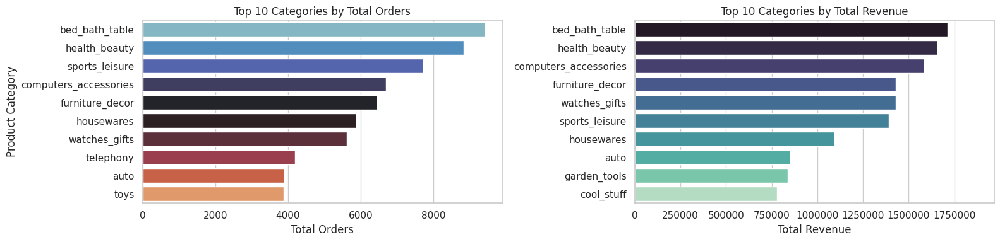

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns

top_orders = top_categories.sort_values(by='total_orders', ascending=False).head(10)
top_revenue = category_payment_value.sort_values(by='payment_value', ascending=False).head(10)

#visualisasi
fig, axes = plt.subplots(1, 2, figsize=(16, 4))  # 1 baris, 2 kolom

#  Popularity (Total Orders)
sns.barplot(
    data=top_orders,
    x='total_orders',
    y='product_category_name_english',
    palette='icefire',
    ax=axes[0]
)
axes[0].set_title('Top 10 Categories by Total Orders')
axes[0].set_xlabel('Total Orders')
axes[0].set_ylabel('Product Category')

# Revenue (Total Sales)
sns.barplot(
    data=top_revenue,
    x='payment_value',
    y='product_category_name_english',
    palette='mako',
    ax=axes[1]
)
axes[1].set_title('Top 10 Categories by Total Revenue')
axes[1].set_xlabel('Total Revenue')
axes[1].set_xlim(0, max(top_revenue['payment_value']) * 1.15)
axes[1].set_ylabel('')
axes[1].ticklabel_format(style = 'plain', axis = 'x')
plt.tight_layout()
plt.show()

Dari hasil analisis terlihat bahwa kategori **“bed_bath_table”** dan **“health_beauty”** menempati posisi teratas dalam jumlah pesanan, menandakan produk-produk rumah tangga dan perawatan diri menjadi yang** paling populer di antara pelanggan Olist.**
Namun, ketika dilihat dari sisi total revenue, kategori **“health_beauty” dan “watches_gifts”** justru menghasilkan pendapatan tertinggi.

**Hal ini menunjukkan bahwa meskipun beberapa kategori seperti bed_bath_table memiliki volume pembelian yang tinggi, nilai transaksi per pembelian relatif lebih kecil dibandingkan kategori seperti health_beauty atau watches_gifts yang memiliki harga jual lebih tinggi.**

Secara keseluruhan, temuan ini menggambarkan adanya perbedaan antara kategori dengan **permintaan tinggi (high demand)** dan **kategori dengan nilai transaksi tinggi (high value)**

insight ini penting bagi **strategi pricing, promosi, dan pengelolaan stok di platform e-commerce seperti Olist.**

## Review and Rating

- Q1 Berapa rata-rata rating produk di Olist?
- Q2 Berapa rata-rata rating yang diberikkan one time buye rdan repeat buyer?
- Q3 What Customers Love vs Complain About

Hypothesis Question :
- H1 Apakah review score dapat mempengaruhi frekuensi pembelian customer?
- H2 Apakah delivery time memiliki pengaruh terhadap review score?
- H3 Apakah frekuensi pembelian memiliki pengaruh terhadap review score?
- H4 Apakah lokasi customer memiliki pengaruh terhadap review score?
- H5 Apakah total order memiliki pengaruh terhadap review score?
- H6 Apakah review score memiliki penharuh terhadap sales?
- H7 apakah review score memiliki pengaruh terhadap AOV?

**Q1 Berapa rata-rata rating produk di Olist?**

In [ ]:
# Hitung kepuasan pelanggan
review_score_distribution = df_review['review_score'].value_counts().sort_index().reset_index()
review_score_distribution.columns = ['review_score', 'total_reviews']

review_score_distribution

# Rata-rata rating produk di Olist
average_review_score = df_review['review_score'].mean()
average_review_score

np.float64(4.08642062404257)

**Q2 Berapa rata-rata rating yang diberikan oleh one time buyer dan repeat buyer?**

Rata-rata Review Score Repeat Buyers  : 4.12
Rata-rata Review Score One-Time Buyers : 4.08


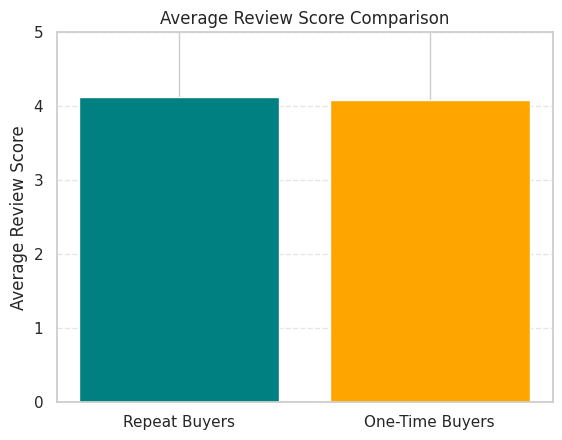

In [ ]:
# Apakah One Time Buyer vs Repeat Buyer memiliki perbedaan ketika memberi rating?

# Apakah pelanggan yang sering berbelanja (repeat buyers) cenderung memberikan review lebih tinggi dibanding pelanggan yang hanya sekali beli?
# Hitung frekuensi pembelian tiap customer
order_freq = (
    df_orders.merge(df_customers, on='customer_id', how='left')
    .groupby('customer_unique_id')['order_id']
    .count()
    .reset_index()
)

# Tentukan repeat buyers dan one-time buyers
repeat_customers = order_freq.loc[order_freq['order_id'] > 1, 'customer_unique_id']
one_time_customers = order_freq.loc[order_freq['order_id'] == 1, 'customer_unique_id']

# Gabungkan orders dengan review & customers
orders_review = (
    df_orders
    .merge(df_customers, on='customer_id', how='left')
    .merge(df_review[['order_id', 'review_score']], on='order_id', how='left')
)

# Filter review score berdasarkan tipe customer
repeat_reviews = orders_review[orders_review['customer_unique_id'].isin(repeat_customers)]['review_score']
one_time_reviews = orders_review[orders_review['customer_unique_id'].isin(one_time_customers)]['review_score']

# Hitung rata-rata skor review
avg_repeat = repeat_reviews.mean()
avg_one_time = one_time_reviews.mean()

print(f"Rata-rata Review Score Repeat Buyers  : {avg_repeat:.2f}")
print(f"Rata-rata Review Score One-Time Buyers : {avg_one_time:.2f}")

import matplotlib.pyplot as plt

plt.bar(['Repeat Buyers', 'One-Time Buyers'], [avg_repeat, avg_one_time], color=['teal', 'orange'])
plt.title('Average Review Score Comparison')
plt.ylabel('Average Review Score')
plt.ylim(0, 5)
plt.grid(axis='y', linestyle='--', alpha=0.5)
plt.show()

**H1 Apakah review score dapat mempengaruhi frekuensi pembelian customer?**


📊 Hasil Uji Mann–Whitney U Test
Mann–Whitney U statistic : 304864249.50
p-value                 : 0.0004
✅ p-value = 0.0004 < 0.05 → Tolak H₀
Kesimpulan: One-Time Buyer memberikan rating lebih tinggi secara signifikan daripada Repeat Buyer.


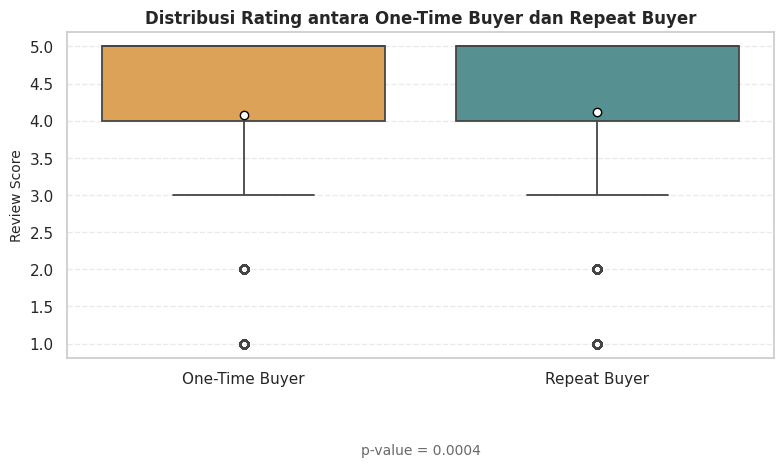

In [ ]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
from scipy.stats import mannwhitneyu

# 📦 Hitung frekuensi pembelian tiap customer
order_freq = (
    df_orders.merge(df_customers, on='customer_id', how='left')
    .groupby('customer_unique_id')['order_id']
    .count()
    .reset_index()
)

# 🎯 Tentukan kelompok pelanggan
repeat_customers = order_freq.loc[order_freq['order_id'] > 1, 'customer_unique_id']
one_time_customers = order_freq.loc[order_freq['order_id'] == 1, 'customer_unique_id']

# 🔗 Gabungkan orders dengan review & customers
orders_review = (
    df_orders
    .merge(df_customers[['customer_id', 'customer_unique_id']], on='customer_id', how='left')
    .merge(df_review[['order_id', 'review_score']], on='order_id', how='left')
)

# 📊 Filter review score berdasarkan tipe pelanggan
repeat_reviews = orders_review[
    orders_review['customer_unique_id'].isin(repeat_customers)
]['review_score'].dropna()

one_time_reviews = orders_review[
    orders_review['customer_unique_id'].isin(one_time_customers)
]['review_score'].dropna()

# 🔄 Gabungkan ke satu dataframe untuk visualisasi
df_compare = pd.DataFrame({
    'review_score': pd.concat([one_time_reviews, repeat_reviews], ignore_index=True),
    'buyer_type': (['One-Time Buyer'] * len(one_time_reviews)) + (['Repeat Buyer'] * len(repeat_reviews))
})

# 🧮 Uji Mann–Whitney U Test
u_stat, p_value = mannwhitneyu(one_time_reviews, repeat_reviews, alternative='two-sided')

print(f"\n📊 Hasil Uji Mann–Whitney U Test")
print(f"Mann–Whitney U statistic : {u_stat:.2f}")
print(f"p-value                 : {p_value:.4f}")

# 🧩 Interpretasi otomatis
if p_value < 0.05:
    print(f"✅ p-value = {p_value:.4f} < 0.05 → Tolak H₀")
    if repeat_reviews.median() > one_time_reviews.median():
        print("Kesimpulan: Repeat Buyer memberikan rating lebih tinggi secara signifikan daripada One-Time Buyer.")
    else:
        print("Kesimpulan: One-Time Buyer memberikan rating lebih tinggi secara signifikan daripada Repeat Buyer.")
else:
    print(f"❌ p-value = {p_value:.4f} ≥ 0.05 → Gagal menolak H₀")
    print("Kesimpulan: Tidak terdapat perbedaan signifikan dalam pemberian rating antara kedua kelompok pelanggan.")

# 📈 Visualisasi Boxplot
plt.figure(figsize=(8,5))
sns.boxplot(
    x='buyer_type',
    y='review_score',
    data=df_compare,
    palette=['#F2A541', '#4C9A9A'],  # oranye untuk one-time, teal untuk repeat
    linewidth=1.3,
    showmeans=True,
    meanprops={"marker": "o", "markerfacecolor": "white", "markeredgecolor": "black"}
)

# 🖋️ Tambahkan elemen presentasi
plt.title('Distribusi Rating antara One-Time Buyer dan Repeat Buyer', fontsize=12, weight='bold')
plt.ylabel('Review Score', fontsize=10)
plt.xlabel('')
plt.grid(axis='y', linestyle='--', alpha=0.4)

# Anotasi p-value di bawah grafik
plt.text(
    0.5, -0.28, f"p-value = {p_value:.4f}",
    ha='center', va='center', transform=plt.gca().transAxes,
    fontsize=10, color='dimgray'
)

plt.tight_layout()
plt.show()

Secara rata-rata, **pelanggan berulang memberikan rating yang sedikit lebih tinggi daripada pelanggan baru.**

Namun, **berdasarkan uji Mann–Whitney U, distribusi skor rating antara kedua kelompok berbeda signifikan secara statistik**, menandakan adanya pola perilaku yang berbeda dalam memberikan ulasan.
**Pelanggan baru cenderung memberi nilai tinggi secara konsisten, sedangkan pelanggan berulang menunjukkan variasi rating yang lebih besar karena ekspektasi yang lebih tinggi terhadap pengalaman berulang mereka.**

###Wordcloud Sentimen / Ulasan Pengguna

**Q3 What Customers Love vs Complain About**

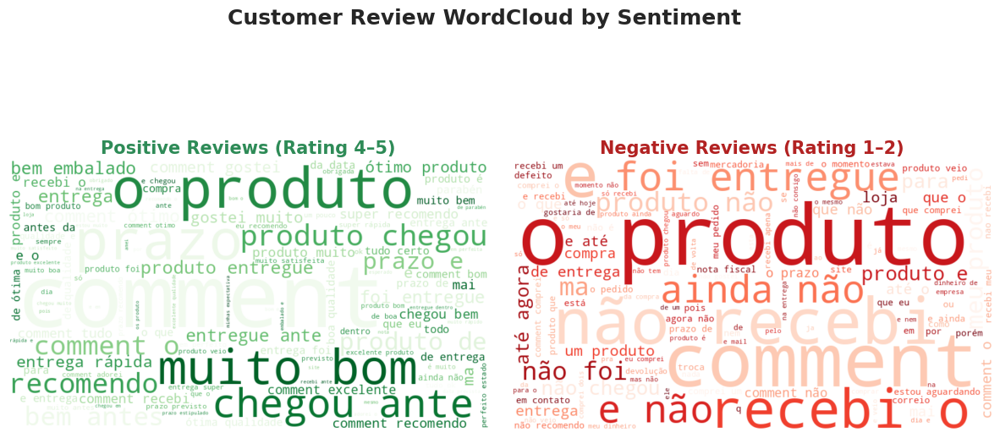

In [ ]:
# Sentimen Berdasarkan Rating
import pandas as pd
from wordcloud import WordCloud
import matplotlib.pyplot as plt
from collections import Counter

#
df_review_clean = df_review.dropna(subset=['review_comment_message']).copy()
df_review_clean['review_comment_message'] = df_review_clean['review_comment_message'].str.lower()

# Review Positif dan Negatif
positive_reviews = " ".join(df_review_clean[df_review_clean['review_score'] >= 4]['review_comment_message'])
negative_reviews = " ".join(df_review_clean[df_review_clean['review_score'] <= 2]['review_comment_message'])

# wordcloud
wordcloud_pos = WordCloud(
    width=800, height=450,
    background_color='white',
    colormap='Greens',
    max_words=120,
    relative_scaling=0.4
).generate(positive_reviews)

wordcloud_neg = WordCloud(
    width=800, height=450,
    background_color='white',
    colormap='Reds',
    max_words=120,
    relative_scaling=0.4
).generate(negative_reviews)

#
plt.figure(figsize=(15, 7))
plt.suptitle("Customer Review WordCloud by Sentiment", fontsize=18, weight='bold')

# positive
plt.subplot(1, 2, 1)
plt.imshow(wordcloud_pos, interpolation='bilinear')
plt.title('Positive Reviews (Rating 4–5)', fontsize=15, color='#2E8B57', weight='bold')
plt.axis('off')

# negatif
plt.subplot(1, 2, 2)
plt.imshow(wordcloud_neg, interpolation='bilinear')
plt.title('Negative Reviews (Rating 1–2)', fontsize=15, color='#B22222', weight='bold')
plt.axis('off')

plt.subplots_adjust(wspace=0.05, top=0.88)
plt.show()

# top 10
top_pos = Counter(" ".join(df_review_clean[df_review_clean['review_score'] >= 4]['review_comment_message']).split()).most_common(10)
top_neg = Counter(" ".join(df_review_clean[df_review_clean['review_score'] <= 2]['review_comment_message']).split()).most_common(10)

💚**Positive Reviews (Rating 4–5)**

Kata dominan seperti **"produto"** (produk), **"chegou antes"** (sampai lebih cepat), dan **"prazo"** (tepat waktu) menunjukkan kepuasan pelanggan terhadap kualitas dan kecepatan pengiriman.

Munculnya kata seperti **"bem embalado"** (dikemas dengan baik) dan **"ótimo"** (hebat) menandakan pengalaman unboxing dan penerimaan barang berjalan lancar.

**Mayoritas ulasan positif berfokus pada keandalan logistik dan kualitas produk, bukan hanya harga.**

artinya, **pelanggan puas jika produk datang sesuai ekspektasi dan dikirim tepat waktu.**

💔 **Negative Reviews (Rating 1–2)**

Kata seperti **"não recebi"** (belum menerima), **"produto"**, dan **"entregue"** mendominasi, mengindikasikan keluhan utama berasal dari masalah pengiriman, seperti keterlambatan atau produk tidak sampai.

Kemunculan kata** "ainda"** (masih) dan **"foi entregue"** (belum dikirim) memperkuat bahwa kegagalan logistik menjadi sumber ketidakpuasan terbesar.

Sedikit kata berkaitan dengan kualitas atau harga, menunjukkan bahwa isu **operasional lebih berdampak terhadap rating rendah dibanding aspek produk.**

**H2 Apakah delivery time memiliki pengaruh terhadap review score?**

In [ ]:
city_metrics[['avg_review_score', 'avg_delivery_days']].corr()

,avg_review_score,avg_delivery_days
avg_review_score,1.000000,-0.271962
avg_delivery_days,-0.271962,1.000000


Spearman correlation (ρ): -0.192
p-value: 0.0000


Keputusan: Tolak H₀
✅ Terdapat korelasi negatif signifikan (ρ = -0.192).
Semakin lama waktu pengiriman, semakin rendah rata-rata review score — pelanggan cenderung kurang puas terhadap pengiriman yang lambat.




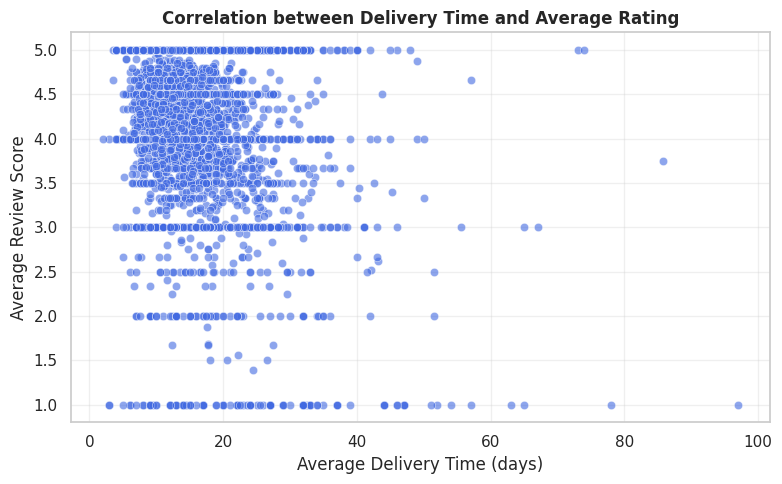

In [ ]:
from scipy.stats import spearmanr
import seaborn as sns
import matplotlib.pyplot as plt

# Hipotesis:
# H₀ : Tidak ada hubungan yang signifikan antara waktu pengiriman dan rating pelanggan.
# H₁ : Ada hubungan yang signifikan antara waktu pengiriman dan rating pelanggan.

# Filter data valid
city_metrics_valid = city_metrics[
    (city_metrics['avg_delivery_days'] > 0) &
    (city_metrics['avg_delivery_days'] < 100) &
    (~city_metrics['avg_delivery_days'].isna()) &
    (~city_metrics['avg_review_score'].isna())
]

# Uji korelasi Spearman
rho, p_value = spearmanr(
    city_metrics_valid['avg_delivery_days'],
    city_metrics_valid['avg_review_score']
)

print(f"Spearman correlation (ρ): {rho:.3f}")
print(f"p-value: {p_value:.4f}")
print("\n")

# Interpretasi hasil
if p_value < 0.05:
    print("Keputusan: Tolak H₀")
    if rho < 0:
        print(f"✅ Terdapat korelasi negatif signifikan (ρ = {rho:.3f}).")
        print("Semakin lama waktu pengiriman, semakin rendah rata-rata review score — pelanggan cenderung kurang puas terhadap pengiriman yang lambat.")
    elif rho > 0:
        print(f"✅ Terdapat korelasi positif signifikan (ρ = {rho:.3f}).")
        print("Semakin lama waktu pengiriman, semakin tinggi review score — kemungkinan pelanggan lebih toleran terhadap pengiriman lama untuk produk tertentu.")
    else:
        print("⚠️ Korelasi signifikan tetapi sangat lemah (ρ ≈ 0).")
else:
    print("📊 Keputusan: Gagal tolak H₀")
    print(f"❌ Tidak ada hubungan signifikan antara waktu pengiriman dan review score (p = {p_value:.4f}).")
    print("Waktu pengiriman tidak berpengaruh secara signifikan terhadap tingkat kepuasan pelanggan.")

print("\n")

# Visualisasi scatterplot
plt.figure(figsize=(8,5))
sns.scatterplot(
    x='avg_delivery_days',
    y='avg_review_score',
    data=city_metrics_valid,
    alpha=0.6,
    color='royalblue'
)
plt.title('Correlation between Delivery Time and Average Rating', fontsize=12, weight='bold')
plt.xlabel('Average Delivery Time (days)')
plt.ylabel('Average Review Score')
plt.grid(alpha=0.3)
plt.tight_layout()
plt.show()

Hasil uji korelasi Spearman (r = -0.249, p < 0.001) menunjukkan adanya hubungan negatif yang signifikan antara waktu pengiriman dan tingkat kepuasan pelanggan.
**Semakin lama waktu pengiriman, semakin rendah rata-rata ulasan yang diberikan pelanggan.**

Temuan ini mengindikasikan bahwa **kecepatan pengiriman menjadi faktor penting dalam menjaga kepuasan pelanggan.**
Perusahaan perlu memastikan estimasi waktu pengiriman yang realistis, mempercepat proses logistik di wilayah dengan keterlambatan tinggi, dan meningkatkan komunikasi status pengiriman untuk meminimalkan persepsi negatif pelanggan.

**H3 Apakah lokasi customer memiliki pengaruh terhadap review score?**

In [ ]:
# Hitung rata-rata skor dan waktu kirim per kota + state
city_metrics = (
    df_geo_merged
    .groupby(['geolocation_city', 'geolocation_state'], as_index=False)
    .agg(
        avg_review_score=('review_score', 'mean'),
        avg_delivery_days=('delivery_time_days', 'mean'),
        lat=('geolocation_lat', 'mean'),
        lng=('geolocation_lng', 'mean'),
        order_count=('order_id', 'nunique')
    )
)

#Cleaning dan validasi
# Hapus kota tanpa review score (NaN)
city_metrics = city_metrics.dropna(subset=['avg_review_score'])

# Hapus kota dengan order terlalu sedikit (misal 1 order saja)
city_metrics = city_metrics[city_metrics['order_count'] > 1]

# Reset index biar rapi
city_metrics = city_metrics.reset_index(drop=True)

# Tampilkan hasil
print(f"Total kota valid: {city_metrics.shape[0]}")
print(f"Total state unik: {city_metrics['geolocation_state'].nunique()}")
print(f"Apakah masih ada NaN di review_score? {city_metrics['avg_review_score'].isna().sum()}")
city_metrics.head()

Total kota valid: 3174
Total state unik: 27
Apakah masih ada NaN di review_score? 0


,geolocation_city,geolocation_state,avg_review_score,avg_delivery_days,lat,lng,order_count
0,cidade,PR,3.500000,8.500000,-25.571748,-49.334374,2
1,abadia dos dourados,MG,5.000000,11.333333,-18.474476,-47.407837,3
2,abaete,MG,4.166667,9.916667,-19.158206,-45.446300,12
3,abaetetuba,PA,3.545455,26.545455,-1.723024,-48.881065,11
4,abaiara,CE,4.500000,35.000000,-7.358247,-39.045817,2


In [ ]:
print(city_metrics['geolocation_state'].nunique(), "state unik")
print(city_metrics['avg_review_score'].isna().sum(), "nilai NaN di review_score")
print(city_metrics.groupby('geolocation_state')['avg_review_score'].count())

27 state unik
0 nilai NaN di review_score
geolocation_state
AC      7
AL     43
AM      3
AP      3
BA    242
CE    116
DF     21
ES     77
GO    132
MA     69
MG    556
MS     45
MT     79
PA     65
PB     39
PE    122
PI     34
PR    263
RJ    126
RN     44
RO     28
RR      1
RS    255
SC    194
SE     20
SP    560
TO     30
Name: avg_review_score, dtype: int64


Kruskal–Wallis Test: H = 55.955, p-value = 0.0000

❌ H0 DITOLAK
✅ Ada perbedaan signifikan rata-rata rating antar 3 state (p < 0.05).
➡️ State dengan rating tertinggi: SP (4.23)
➡️ State dengan rating terendah: RJ (3.90)


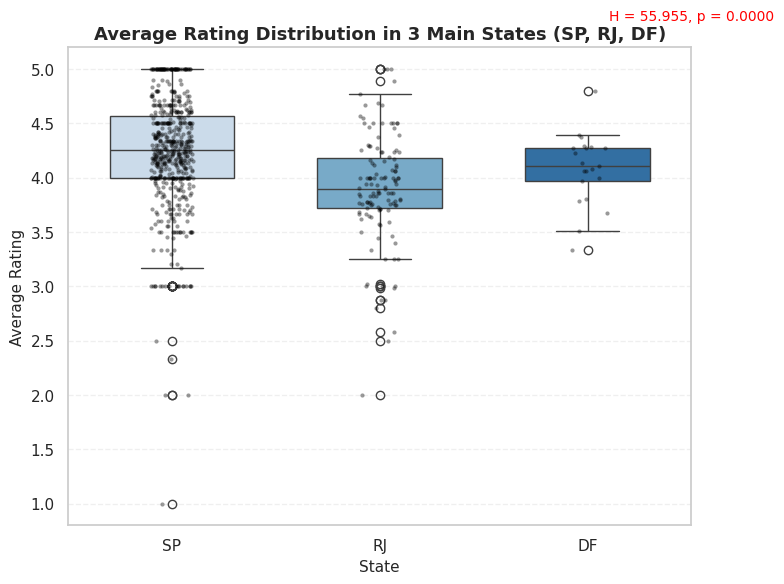

In [ ]:
from scipy.stats import kruskal
import seaborn as sns
import matplotlib.pyplot as plt

#Filter hanya 3 state besar: SP, RJ, DF
target_states = ['SP', 'RJ', 'DF']
city_metrics_top3 = city_metrics[
    city_metrics['geolocation_state'].isin(target_states)
].dropna(subset=['avg_review_score'])

#Siapkan data untuk uji Kruskal-Wallis
state_groups = [
    city_metrics_top3.loc[city_metrics_top3['geolocation_state'] == s, 'avg_review_score']
    for s in target_states
]

#uji Kruskal–Wallis
if len(state_groups) >= 2:
    H_stat, p_value = kruskal(*state_groups)
    print(f"Kruskal–Wallis Test: H = {H_stat:.3f}, p-value = {p_value:.4f}")

    if p_value < 0.05:
        print("\n❌ H0 DITOLAK")
        print("✅ Ada perbedaan signifikan rata-rata rating antar 3 state (p < 0.05).")

        state_mean = (
            city_metrics_top3.groupby('geolocation_state')['avg_review_score']
            .mean()
            .sort_values(ascending=False)
        )
        top_state = state_mean.index[0]
        bottom_state = state_mean.index[-1]

        print(f"➡️ State dengan rating tertinggi: {top_state} ({state_mean[top_state]:.2f})")
        print(f"➡️ State dengan rating terendah: {bottom_state} ({state_mean[bottom_state]:.2f})")

    else:
        print("\n✅ H0 DITERIMA")
        print("❌ Tidak ada perbedaan signifikan (p ≥ 0.05).")

else:
    print("⚠️ Tidak cukup grup valid untuk menjalankan uji Kruskal–Wallis.")

# Visualisasi boxplot
plt.figure(figsize=(8, 6))
sns.boxplot(
    data=city_metrics_top3,
    x='geolocation_state', y='avg_review_score',
    palette='Blues', width=0.6
)
sns.stripplot(
    data=city_metrics_top3,
    x='geolocation_state', y='avg_review_score',
    color='black', alpha=0.4, size=3
)

plt.title('Average Rating Distribution in 3 Main States (SP, RJ, DF)', fontsize=13, weight='bold')
plt.xlabel('State', fontsize=11)
plt.ylabel('Average Rating', fontsize=11)
plt.grid(axis='y', linestyle='--', alpha=0.3)

# Tambahkan hasil uji di atas plot
plt.text(
    1, 1.05,
    f"H = {H_stat:.3f}, p = {p_value:.4f}",
    ha='center', va='bottom', transform=plt.gca().transAxes,
    fontsize=10, color='red' if p_value < 0.05 else 'green',
    bbox=dict(facecolor='white', alpha=0.8, edgecolor='none')
)

plt.tight_layout()
plt.show()

Berdasarkan hasil uji Kruskal–Wallis (H = 55.955, p < 0.001), **terdapat perbedaan signifikan pada rata-rata rating pelanggan antar tiga state utama — São Paulo (SP), Rio de Janeiro (RJ), dan Brasília (DF).**


Hal ini berarti **tingkat kepuasan pelanggan (berdasarkan review score) tidak seragam di seluruh wilayah, dan lokasi berpotensi menjadi faktor yang memengaruhi pengalaman pelanggan.**

Dari hasil perbandingan rerata:

**São Paulo (SP) memiliki rating tertinggi sebesar 4.23**, menunjukkan bahwa pelanggan di wilayah ini cenderung memberikan penilaian lebih positif terhadap layanan yang diterima.

**Rio de Janeiro (RJ) mencatat rating terendah sebesar 3.90**, yang mengindikasikan kemungkinan adanya perbedaan ekspektasi pelanggan atau variasi kualitas pelayanan di wilayah tersebut.

**Brasília (DF) berada di posisi menengah dengan rating relatif stabil di sekitar nilai 4.1.**

Visualisasi boxplot memperkuat hasil uji statistik:

Distribusi rating di SP tampak lebih menyebar (variatif) karena jumlah kota lebih banyak (560), mencerminkan heterogenitas pengalaman pelanggan.

Sebaliknya, RJ dan DF memiliki sebaran data lebih sempit (126 dan 21 kota), menunjukkan variasi pengalaman pelanggan yang lebih terbatas.

**H4 Apakah total order memiliki pengaruh terhadap review score?**

In [ ]:
# Gabungkan tabel order item dengan review
df_product_rating = (
    df_order_items
    .merge(df_product_translated, on='product_id', how='left')
    .merge(df_review[['order_id', 'review_score']], on='order_id', how='left')
)

# Hitung metrik popularitas dan rating per produk
product_metrics = (
    df_product_rating.groupby(['product_id', 'product_category_name_english'], as_index=False)
    .agg(
        total_orders=('order_id', 'count'),
        avg_rating=('review_score', 'mean')
    )
)

# Hapus produk tanpa review (jika ada)
product_metrics = product_metrics.dropna(subset=['avg_rating'])

# Tampilkan 5 produk teratas berdasarkan jumlah order
product_metrics.sort_values(by='total_orders', ascending=False).head()

,product_id,product_category_name_english,total_orders,avg_rating
21715,aca2eb7d00ea1a7b8ebd4e68314663af,furniture_decor,527,4.019084
19386,99a4788cb24856965c36a24e339b6058,bed_bath_table,491,3.898340
8452,422879e10f46682990de24d770e7f83d,garden_tools,487,3.946502
7227,389d119b48cf3043d311335e499d9c6b,garden_tools,392,4.117647
6946,368c6c730842d78016ad823897a372db,garden_tools,391,3.922680


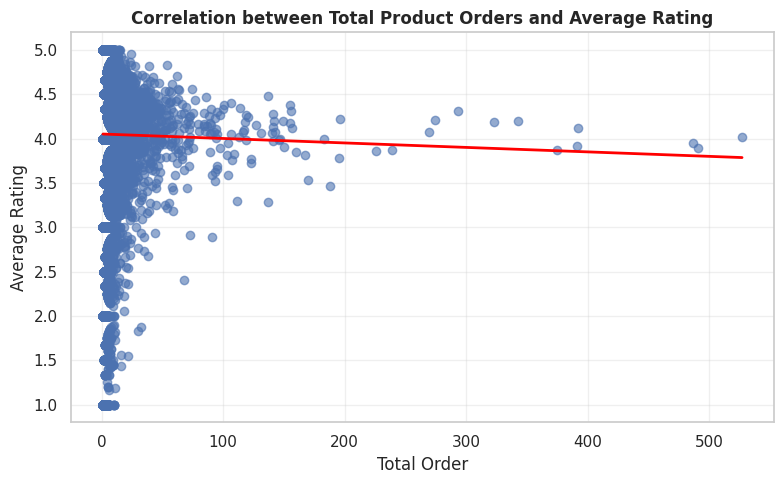

Spearman Correlation: -0.201, p-value: 0.0000
✅ Terdapat korelasi signifikan antara banyaknya order produk dan rating.


In [ ]:
import seaborn as sns
import matplotlib.pyplot as plt
from scipy.stats import spearmanr

# Visualisasi scatterplot dengan garis regresi
plt.figure(figsize=(8,5))
sns.regplot(
    x='total_orders',
    y='avg_rating',
    data=product_metrics,
    scatter_kws={'alpha': 0.6},
    line_kws={'color': 'red', 'lw': 2},
    ci=None  # hilangkan area kepercayaan agar lebih bersih
)

plt.title('Correlation between Total Product Orders and Average Rating', fontsize=12, weight='bold')
plt.xlabel('Total Order')
plt.ylabel('Average Rating')
plt.grid(alpha=0.3)
plt.tight_layout()
plt.show()

# Uji Korelasi Spearman
corr, pval = spearmanr(product_metrics['total_orders'], product_metrics['avg_rating'])
print(f"Spearman Correlation: {corr:.3f}, p-value: {pval:.4f}")

if pval < 0.05:
    print("✅ Terdapat korelasi signifikan antara banyaknya order produk dan rating.")
else:
    print("❌ Tidak terdapat korelasi signifikan antara banyaknya order produk dan rating.")

Berdasarkan uji korelasi Spearman (ρ = -0.201, p < 0.05), terdapat hubungan negatif yang lemah namun signifikan antara banyaknya order produk (jumlah order) dan rata-rata rating.
**Artinya, produk yang semakin populer justru cenderung memiliki rating sedikit lebih rendah.**

Hal ini dapat dijelaskan karena **produk yang banyak dibeli memiliki basis pengguna yang lebih luas dan beragam, sehingga kemungkinan mendapat ulasan negatif juga lebih besar dibanding produk dengan pembeli terbatas.**

Temuan ini menunjukkan bahwa tingginya penjualan tidak selalu mencerminkan kepuasan pelanggan yang tinggi.
Perusahaan dapat menggunakan insight ini untuk:

- Mengevaluasi kualitas produk-produk terlaris yang memiliki rating menurun.

- Meningkatkan layanan purna jual (after-sales) untuk produk populer.

- Memantau tren ulasan negatif pada produk dengan penjualan tinggi untuk menghindari churn pelanggan.

**H6 Apakah review score memiliki pengaruh terhadap sales?**

In [ ]:
from scipy.stats import spearmanr

# Gabungkan order_items dengan review untuk ambil review_score dan price (sales)
df_sales_review = df_order_items.merge(
    df_review[['order_id', 'review_score']],
    on='order_id',
    how='inner'
)

# Lakukan uji korelasi Spearman
stat, p_value = spearmanr(df_sales_review['review_score'], df_sales_review['price'])

# Hasil uji
print(f"Spearman correlation = {stat:.4f}, p-value = {p_value:.4f}")

# Interpretasi hasil
if p_value < 0.05:
    if stat > 0:
        print("H0 ditolak: Terdapat hubungan signifikan antara review score dan sales.")
    else:
        print("H0 ditolak: Terdapat hubungan signifikan antara review score dan sales.")
else:
    print("H0 diterima: Tidak terdapat hubungan signifikan antara review score dan sales.")


Spearman correlation = 0.0053, p-value = 0.0759
H0 diterima: Tidak terdapat hubungan signifikan antara review score dan sales.


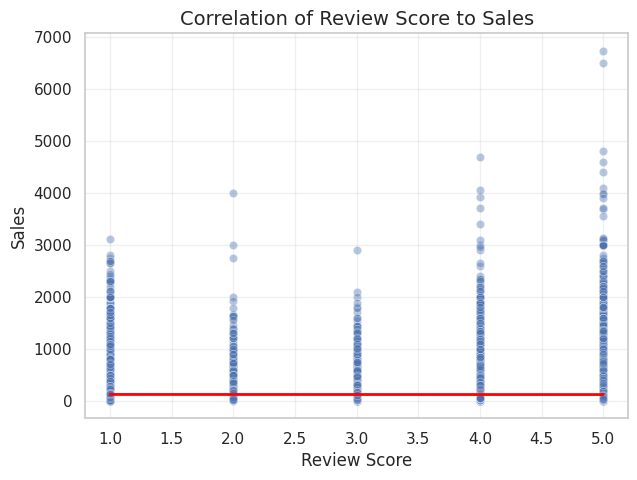

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns

plt.figure(figsize=(7,5))
sns.scatterplot(data=df_sales_review, x='review_score', y='price', alpha=0.4)
sns.regplot(data=df_sales_review, x='review_score', y='price',
            scatter=False, color='red', line_kws={'linewidth':2})

plt.title('Correlation of Review Score to Sales', fontsize=14)
plt.xlabel('Review Score', fontsize=12)
plt.ylabel('Sales', fontsize=12)
plt.grid(alpha=0.3)
plt.show()


H0: Tidak ada pengaruh signifikan antara  review score terhadap sales.

H1: Terdapat pengaruh signifikan antara  review score terhadap sales.

Hasil : **Tidak terdapat pengaruh signifikan antara review score terhadap sales**

Hasil uji Spearman menunjukkan bahwa tidak terdapat hubungan signifikan antara review score dan sales (nilai penjualan). Artinya, tingkat kepuasan pelanggan yang tercermin dari skor ulasan tidak memiliki hubungan yang kuat dengan besar kecilnya nilai transaksi penjualan.
Dengan kata lain, meskipun beberapa produk memiliki review tinggi, hal tersebut tidak secara langsung berdampak pada peningkatan penjualan, dan begitu pula sebaliknya.

**H7 Apakah review score memiliki pengaruh terhadap AOV?**

In [ ]:
# Gabungkan dataset order dan payment untuk hitung revenue per order
df_order_payment = df_orders.merge(
    df_payment[['order_id', 'payment_value']],
    on='order_id',
    how='left'
)

# Hitung total revenue dan total order
total_revenue = df_order_payment['payment_value'].sum()
total_orders = df_order_payment['order_id'].nunique()

# Hitung AOV keseluruhan
overall_aov = total_revenue / total_orders

# Hitung rata-rata review score keseluruhan
avg_review_score = df_review['review_score'].mean()

print(f"Average Order Value (AOV) keseluruhan: {overall_aov:.2f}")
print(f"Rata-rata Review Score: {avg_review_score:.2f}")


Average Order Value (AOV) keseluruhan: 160.99
Rata-rata Review Score: 4.09


In [ ]:
from scipy.stats import spearmanr

# Gabungkan payment dan review berdasarkan order_id
df_corr = df_payment.merge(
    df_review[['order_id', 'review_score']],
    on='order_id',
    how='inner'
)

# Pastikan tidak ada missing value
df_corr = df_corr.dropna(subset=['payment_value', 'review_score'])

# Hitung korelasi Spearman antara payment_value (proxy AOV per order) dan review_score
corr, p_value = spearmanr(df_corr['payment_value'], df_corr['review_score'])

print(f"Spearman correlation = {corr:.4f}, p-value = {p_value:.4f}")

# Interpretasi otomatis
if p_value < 0.05:
    print("H0 ditolak: Terdapat hubungan signifikan antara review score dan AOV/order value.")
else:
    print("H0 diterima: Tidak terdapat hubungan signifikan antara review score dan AOV/order value.")


Spearman correlation = -0.0371, p-value = 0.0000
H0 ditolak: Terdapat hubungan signifikan antara review score dan AOV/order value.


In [ ]:
print(df_corr.shape)
print(df_corr.columns)
print(df_corr[['order_id', 'review_score', 'payment_value']].head(10))

(103677, 6)
Index(['order_id', 'payment_sequential', 'payment_type',
       'payment_installments', 'payment_value', 'review_score'],
      dtype='object')
                           order_id  review_score  payment_value
0  b81ef226f3fe1789b1e8b2acac839d17             1          99.33
1  a9810da82917af2d9aefd1278f1dcfa0             5          24.39
2  25e8ea4e93396b6fa0d3dd708e76c1bd             5          65.71
3  ba78997921bbcdc1373bb41e913ab953             5         107.78
4  ba78997921bbcdc1373bb41e913ab953             5         107.78
5  42fdf880ba16b47b59251dd489d4441a             5         128.45
6  298fcdf1f73eb413e4d26d01b25bc1cd             5          96.12
7  771ee386b001f06208a7419e4fc1bbd7             5          81.16
8  3d7239c394a212faae122962df514ac7             4          51.84
9  1f78449c87a54faf9e96e88ba1491fa9             5         341.09


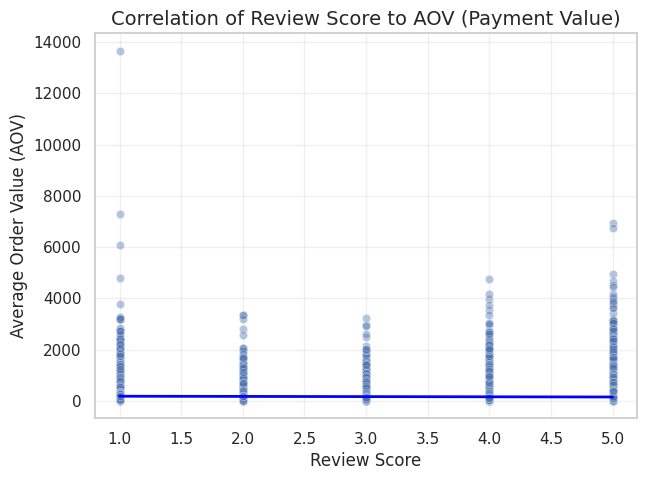

In [ ]:
plt.figure(figsize=(7,5))
sns.scatterplot(data=df_corr, x='review_score', y='payment_value', alpha=0.4)
sns.regplot(data=df_corr, x='review_score', y='payment_value',
            scatter=False, color='blue', line_kws={'linewidth':2})

plt.title('Correlation of Review Score to AOV (Payment Value)', fontsize=14)
plt.xlabel('Review Score', fontsize=12)
plt.ylabel('Average Order Value (AOV)', fontsize=12)
plt.grid(alpha=0.3)
plt.show()


H0: Tidak terdapat hubungan signifikan antara review score dan Average Order Value (AOV).

H1: Terdapat hubungan signifikan antara review score dan Average Order Value (AOV).

Hasil korelasi negatif berarti bahwa semakin tinggi review score, justru nilai rata-rata pembelian (AOV) cenderung menurun dan sebaliknya.
Artinya, pelanggan yang memberikan review tinggi (puas) tidak selalu melakukan pembelian dengan nilai besar, sedangkan pelanggan dengan review lebih rendah mungkin justru melakukan transaksi dengan nominal lebih tinggi.

# Checking

In [ ]:
df_checking = (
    df_order_items
    .merge(df_payment[['order_id', 'payment_value']], on='order_id', how='left')
)

df_checking

,order_id,order_item_id,product_id,seller_id,shipping_limit_date,price,freight_value,payment_value
0,00010242fe8c5a6d1ba2dd792cb16214,1,4244733e06e7ecb4970a6e2683c13e61,48436dade18ac8b2bce089ec2a041202,2017-09-19 09:45:35,58.90,13.29,72.19
1,00018f77f2f0320c557190d7a144bdd3,1,e5f2d52b802189ee658865ca93d83a8f,dd7ddc04e1b6c2c614352b383efe2d36,2017-05-03 11:05:13,239.90,19.93,259.83
2,000229ec398224ef6ca0657da4fc703e,1,c777355d18b72b67abbeef9df44fd0fd,5b51032eddd242adc84c38acab88f23d,2018-01-18 14:48:30,199.00,17.87,216.87
3,00024acbcdf0a6daa1e931b038114c75,1,7634da152a4610f1595efa32f14722fc,9d7a1d34a5052409006425275ba1c2b4,2018-08-15 10:10:18,12.99,12.79,25.78
4,00042b26cf59d7ce69dfabb4e55b4fd9,1,ac6c3623068f30de03045865e4e10089,df560393f3a51e74553ab94004ba5c87,2017-02-13 13:57:51,199.90,18.14,218.04
...,...,...,...,...,...,...,...,...
117599,fffc94f6ce00a00581880bf54a75a037,1,4aa6014eceb682077f9dc4bffebc05b0,b8bc237ba3788b23da09c0f1f3a3288c,2018-05-02 04:11:01,299.99,43.41,343.40
117600,fffcd46ef2263f404302a634eb57f7eb,1,32e07fd915822b0765e448c4dd74c828,f3c38ab652836d21de61fb8314b69182,2018-07-20 04:31:48,350.00,36.53,386.53
117601,fffce4705a9662cd70adb13d4a31832d,1,72a30483855e2eafc67aee5dc2560482,c3cfdc648177fdbbbb35635a37472c53,2017-10-30 17:14:25,99.90,16.95,116.85
117602,fffe18544ffabc95dfada21779c9644f,1,9c422a519119dcad7575db5af1ba540e,2b3e4a2a3ea8e01938cabda2a3e5cc79,2017-08-21 00:04:32,55.99,8.72,64.71


In [ ]:

#Buat kolom total dari price + freight_value
df_checking['price_plus_freight'] = df_checking['price'] + df_checking['freight_value']

# Hitung selisih antara payment_value dan (price + freight_value)
df_checking['difference'] = df_checking['payment_value'] - df_checking['price_plus_freight']

# Cek apakah semua selisihnya 0 (artinya sama persis)
is_equal = (df_checking['difference'].abs() < 1e-6).all()  # toleransi kecil untuk angka desimal

print("Apakah payment_value = price + freight_value untuk semua baris?")
print(is_equal)

df_checking[df_checking['difference'].abs() > 1e-6].head()


Apakah payment_value = price + freight_value untuk semua baris?
False


,order_id,order_item_id,product_id,seller_id,shipping_limit_date,price,freight_value,payment_value,price_plus_freight,difference
13,0008288aa423d2a3f00fcb17cd7d8719,1,368c6c730842d78016ad823897a372db,1f50f920176fa81dab994f9023523100,2018-02-21 02:55:52,49.90,13.37,126.54,63.27,63.27
14,0008288aa423d2a3f00fcb17cd7d8719,2,368c6c730842d78016ad823897a372db,1f50f920176fa81dab994f9023523100,2018-02-21 02:55:52,49.90,13.37,126.54,63.27,63.27
32,00143d0f86d6fbd9f9b38ab440ac16f5,1,e95ee6822b66ac6058e2e4aff656071a,a17f621c590ea0fab3d5d883e1630ec6,2017-10-20 16:07:52,21.33,15.10,109.29,36.43,72.86
33,00143d0f86d6fbd9f9b38ab440ac16f5,2,e95ee6822b66ac6058e2e4aff656071a,a17f621c590ea0fab3d5d883e1630ec6,2017-10-20 16:07:52,21.33,15.10,109.29,36.43,72.86
34,00143d0f86d6fbd9f9b38ab440ac16f5,3,e95ee6822b66ac6058e2e4aff656071a,a17f621c590ea0fab3d5d883e1630ec6,2017-10-20 16:07:52,21.33,15.10,109.29,36.43,72.86


In [ ]:
df_checking2 = (
    df_checking
    .merge(df_product_translated[['product_id', 'product_category_name_english']], on='product_id', how='left')
)

df_checking2

,order_id,order_item_id,product_id,seller_id,shipping_limit_date,price,freight_value,payment_value,price_plus_freight,difference,product_category_name_english
0,00010242fe8c5a6d1ba2dd792cb16214,1,4244733e06e7ecb4970a6e2683c13e61,48436dade18ac8b2bce089ec2a041202,2017-09-19 09:45:35,58.90,13.29,72.19,72.19,0.000000e+00,cool_stuff
1,00018f77f2f0320c557190d7a144bdd3,1,e5f2d52b802189ee658865ca93d83a8f,dd7ddc04e1b6c2c614352b383efe2d36,2017-05-03 11:05:13,239.90,19.93,259.83,259.83,0.000000e+00,pet_shop
2,000229ec398224ef6ca0657da4fc703e,1,c777355d18b72b67abbeef9df44fd0fd,5b51032eddd242adc84c38acab88f23d,2018-01-18 14:48:30,199.00,17.87,216.87,216.87,0.000000e+00,furniture_decor
3,00024acbcdf0a6daa1e931b038114c75,1,7634da152a4610f1595efa32f14722fc,9d7a1d34a5052409006425275ba1c2b4,2018-08-15 10:10:18,12.99,12.79,25.78,25.78,0.000000e+00,perfumery
4,00042b26cf59d7ce69dfabb4e55b4fd9,1,ac6c3623068f30de03045865e4e10089,df560393f3a51e74553ab94004ba5c87,2017-02-13 13:57:51,199.90,18.14,218.04,218.04,-2.842171e-14,garden_tools
...,...,...,...,...,...,...,...,...,...,...,...
117599,fffc94f6ce00a00581880bf54a75a037,1,4aa6014eceb682077f9dc4bffebc05b0,b8bc237ba3788b23da09c0f1f3a3288c,2018-05-02 04:11:01,299.99,43.41,343.40,343.40,0.000000e+00,housewares
117600,fffcd46ef2263f404302a634eb57f7eb,1,32e07fd915822b0765e448c4dd74c828,f3c38ab652836d21de61fb8314b69182,2018-07-20 04:31:48,350.00,36.53,386.53,386.53,0.000000e+00,computers_accessories
117601,fffce4705a9662cd70adb13d4a31832d,1,72a30483855e2eafc67aee5dc2560482,c3cfdc648177fdbbbb35635a37472c53,2017-10-30 17:14:25,99.90,16.95,116.85,116.85,-1.421085e-14,sports_leisure
117602,fffe18544ffabc95dfada21779c9644f,1,9c422a519119dcad7575db5af1ba540e,2b3e4a2a3ea8e01938cabda2a3e5cc79,2017-08-21 00:04:32,55.99,8.72,64.71,64.71,-1.421085e-14,computers_accessories


In [ ]:
# Buat kolom total dari price + freight_value
df_checking2['price_plus_freight'] = df_checking2['price'] + df_checking2['freight_value']

#  Hitung selisih antara payment_value dan (price + freight_value)
df_checking2['difference'] = df_checking2['payment_value'] - df_checking2['price_plus_freight']

#  Cek apakah semua selisihnya 0 (artinya sama persis)
is_equal = (df_checking2['difference'].abs() < 1e-6).all()  # toleransi kecil untuk angka desimal

print("Apakah payment_value = price + freight_value untuk semua baris?")
print(is_equal)

df_checking2[df_checking2['difference'].abs() > 1e-6].head()


Apakah payment_value = price + freight_value untuk semua baris?
False


,order_id,order_item_id,product_id,seller_id,shipping_limit_date,price,freight_value,payment_value,price_plus_freight,difference,product_category_name_english
13,0008288aa423d2a3f00fcb17cd7d8719,1,368c6c730842d78016ad823897a372db,1f50f920176fa81dab994f9023523100,2018-02-21 02:55:52,49.90,13.37,126.54,63.27,63.27,garden_tools
14,0008288aa423d2a3f00fcb17cd7d8719,2,368c6c730842d78016ad823897a372db,1f50f920176fa81dab994f9023523100,2018-02-21 02:55:52,49.90,13.37,126.54,63.27,63.27,garden_tools
32,00143d0f86d6fbd9f9b38ab440ac16f5,1,e95ee6822b66ac6058e2e4aff656071a,a17f621c590ea0fab3d5d883e1630ec6,2017-10-20 16:07:52,21.33,15.10,109.29,36.43,72.86,sports_leisure
33,00143d0f86d6fbd9f9b38ab440ac16f5,2,e95ee6822b66ac6058e2e4aff656071a,a17f621c590ea0fab3d5d883e1630ec6,2017-10-20 16:07:52,21.33,15.10,109.29,36.43,72.86,sports_leisure
34,00143d0f86d6fbd9f9b38ab440ac16f5,3,e95ee6822b66ac6058e2e4aff656071a,a17f621c590ea0fab3d5d883e1630ec6,2017-10-20 16:07:52,21.33,15.10,109.29,36.43,72.86,sports_leisure


In [ ]:
df_checking3 = (
    df_checking2
    .merge(df_orders[['order_id', 'order_status']], on='order_id', how='left')
)

df_checking3

,order_id,order_item_id,product_id,seller_id,shipping_limit_date,price,freight_value,payment_value,price_plus_freight,difference,product_category_name_english,order_status
0,00010242fe8c5a6d1ba2dd792cb16214,1,4244733e06e7ecb4970a6e2683c13e61,48436dade18ac8b2bce089ec2a041202,2017-09-19 09:45:35,58.90,13.29,72.19,72.19,0.000000e+00,cool_stuff,delivered
1,00018f77f2f0320c557190d7a144bdd3,1,e5f2d52b802189ee658865ca93d83a8f,dd7ddc04e1b6c2c614352b383efe2d36,2017-05-03 11:05:13,239.90,19.93,259.83,259.83,0.000000e+00,pet_shop,delivered
2,000229ec398224ef6ca0657da4fc703e,1,c777355d18b72b67abbeef9df44fd0fd,5b51032eddd242adc84c38acab88f23d,2018-01-18 14:48:30,199.00,17.87,216.87,216.87,0.000000e+00,furniture_decor,delivered
3,00024acbcdf0a6daa1e931b038114c75,1,7634da152a4610f1595efa32f14722fc,9d7a1d34a5052409006425275ba1c2b4,2018-08-15 10:10:18,12.99,12.79,25.78,25.78,0.000000e+00,perfumery,delivered
4,00042b26cf59d7ce69dfabb4e55b4fd9,1,ac6c3623068f30de03045865e4e10089,df560393f3a51e74553ab94004ba5c87,2017-02-13 13:57:51,199.90,18.14,218.04,218.04,-2.842171e-14,garden_tools,delivered
...,...,...,...,...,...,...,...,...,...,...,...,...
117599,fffc94f6ce00a00581880bf54a75a037,1,4aa6014eceb682077f9dc4bffebc05b0,b8bc237ba3788b23da09c0f1f3a3288c,2018-05-02 04:11:01,299.99,43.41,343.40,343.40,0.000000e+00,housewares,delivered
117600,fffcd46ef2263f404302a634eb57f7eb,1,32e07fd915822b0765e448c4dd74c828,f3c38ab652836d21de61fb8314b69182,2018-07-20 04:31:48,350.00,36.53,386.53,386.53,0.000000e+00,computers_accessories,delivered
117601,fffce4705a9662cd70adb13d4a31832d,1,72a30483855e2eafc67aee5dc2560482,c3cfdc648177fdbbbb35635a37472c53,2017-10-30 17:14:25,99.90,16.95,116.85,116.85,-1.421085e-14,sports_leisure,delivered
117602,fffe18544ffabc95dfada21779c9644f,1,9c422a519119dcad7575db5af1ba540e,2b3e4a2a3ea8e01938cabda2a3e5cc79,2017-08-21 00:04:32,55.99,8.72,64.71,64.71,-1.421085e-14,computers_accessories,delivered


In [ ]:
#  Buat kolom total dari price + freight_value
df_checking3['price_plus_freight'] = df_checking3['price'] + df_checking2['freight_value']

#  Hitung selisih antara payment_value dan (price + freight_value)
df_checking3['difference'] = df_checking3['payment_value'] - df_checking2['price_plus_freight']

#  Cek apakah semua selisihnya 0 (artinya sama persis)
is_equal = (df_checking3['difference'].abs() < 1e-6).all()  # toleransi kecil untuk angka desimal

print("Apakah payment_value = price + freight_value untuk semua baris?")
print(is_equal)

df_checking3[df_checking3['difference'].abs() > 1e-6]


Apakah payment_value = price + freight_value untuk semua baris?
False


,order_id,order_item_id,product_id,seller_id,shipping_limit_date,price,freight_value,payment_value,price_plus_freight,difference,product_category_name_english,order_status
13,0008288aa423d2a3f00fcb17cd7d8719,1,368c6c730842d78016ad823897a372db,1f50f920176fa81dab994f9023523100,2018-02-21 02:55:52,49.90,13.37,126.54,63.27,63.27,garden_tools,delivered
14,0008288aa423d2a3f00fcb17cd7d8719,2,368c6c730842d78016ad823897a372db,1f50f920176fa81dab994f9023523100,2018-02-21 02:55:52,49.90,13.37,126.54,63.27,63.27,garden_tools,delivered
32,00143d0f86d6fbd9f9b38ab440ac16f5,1,e95ee6822b66ac6058e2e4aff656071a,a17f621c590ea0fab3d5d883e1630ec6,2017-10-20 16:07:52,21.33,15.10,109.29,36.43,72.86,sports_leisure,delivered
33,00143d0f86d6fbd9f9b38ab440ac16f5,2,e95ee6822b66ac6058e2e4aff656071a,a17f621c590ea0fab3d5d883e1630ec6,2017-10-20 16:07:52,21.33,15.10,109.29,36.43,72.86,sports_leisure,delivered
34,00143d0f86d6fbd9f9b38ab440ac16f5,3,e95ee6822b66ac6058e2e4aff656071a,a17f621c590ea0fab3d5d883e1630ec6,2017-10-20 16:07:52,21.33,15.10,109.29,36.43,72.86,sports_leisure,delivered
...,...,...,...,...,...,...,...,...,...,...,...,...
117589,fff8287bbae429a99bb7e8c21d151c41,2,bee2e070c39f3dd2f6883a17a5f0da45,4e922959ae960d389249c378d1c939f5,2018-03-27 12:29:22,180.00,48.14,456.28,228.14,228.14,computers_accessories,delivered
117594,fffb9224b6fc7c43ebb0904318b10b5f,1,43423cdffde7fda63d0414ed38c11a73,b1fc4f64df5a0e8b6913ab38803c57a9,2017-11-03 02:55:58,55.00,34.19,356.76,89.19,267.57,watches_gifts,delivered
117595,fffb9224b6fc7c43ebb0904318b10b5f,2,43423cdffde7fda63d0414ed38c11a73,b1fc4f64df5a0e8b6913ab38803c57a9,2017-11-03 02:55:58,55.00,34.19,356.76,89.19,267.57,watches_gifts,delivered
117596,fffb9224b6fc7c43ebb0904318b10b5f,3,43423cdffde7fda63d0414ed38c11a73,b1fc4f64df5a0e8b6913ab38803c57a9,2017-11-03 02:55:58,55.00,34.19,356.76,89.19,267.57,watches_gifts,delivered


# Kesimpulan & Rekomendasi

## Kesimpulan

**Problem statement 1.  Perubahan total revenue, volume order, dan tren penjualan berdasarkan waktu dan musim;**

Hasil uji menunjukkan bahwa total revenue, total order, dan average order value (AOV) memiliki pola yang saling berkaitan dan mencerminkan dinamika pertumbuhan Olist sebagai marketplace.

Total Revenue :

Revenue meningkat secara konsisten dari 2016 hingga 2018, dengan akselerasi paling signifikan pada tahun 2017. Lonjakan yang tajam pada November 2017 mengindikasikan dampak besar dari Black Friday, yang menjadi salah satu momen belanja online terbesar dalam setahun. Kenaikan ini mencerminkan efektivitas strategi promosi musiman serta kemampuan Olist memanfaatkan periode puncak permintaan untuk meningkatkan penjualan. Namun, setelah periode tersebut, revenue mulai menunjukkan penurunan bertahap menjelang akhir 2018, yang bisa dikaitkan dengan menurunnya aktivitas promosi atau kejenuhan pasar pasca event besar.

Total Order :

Jumlah pesanan (order volume) memperlihatkan pola yang hampir identik dengan revenue: meningkat tajam hingga puncaknya pada awal 2018 sebelum turun di kuartal akhir. Artinya, pertumbuhan pendapatan Olist terutama didorong oleh kenaikan volume transaksi—bukan oleh kenaikan harga per unit produk. Hal ini menunjukkan keberhasilan Olist dalam memperluas basis pelanggan dan meningkatkan frekuensi pembelian, tetapi juga mengindikasikan bahwa model pertumbuhan masih bergantung pada kuantitas transaksi, bukan kualitas atau margin keuntungan per penjualan.

Average Order Value (AOV) :

Berbeda dengan dua indikator sebelumnya, AOV terlihat relatif stabil sepanjang periode analisis. Meskipun terdapat fluktuasi kecil antar bulan, nilai rata-rata pesanan cenderung berada di kisaran yang sama, tanpa tren peningkatan signifikan. Ini mengindikasikan bahwa pelanggan cenderung membeli produk dengan nilai serupa dari waktu ke waktu, dan promosi besar seperti Black Friday lebih mendorong peningkatan volume pembelian daripada peningkatan nilai pembelian per transaksi.

Kesimpulan :
Dari hasil di atas, dapat disimpulkan bahwa pertumbuhan revenue Olist bersumber utama dari peningkatan jumlah pesanan, bukan dari kenaikan nilai transaksi per order. Event promosi seperti Black Friday berperan besar sebagai pendorong lonjakan penjualan jangka pendek, sementara pertumbuhan jangka panjang dipertahankan oleh akuisisi pelanggan baru dan frekuensi transaksi yang tinggi. Namun, karena AOV relatif stagnan, strategi Olist ke depan sebaiknya tidak hanya berfokus pada volume, tetapi juga pada optimasi nilai per transaksi melalui strategi cross-selling, bundling, atau premium pricing untuk kategori produk tertentu. Dengan pendekatan ini, Olist dapat menjaga momentum pertumbuhan penjualan sekaligus meningkatkan profitabilitas tanpa harus sepenuhnya bergantung pada promosi musiman.

**Problem statement 2 : Perbedaan popularitas dan profitabilitas antar kategori produk serta dampaknya terhadap margin dan strategi harga;**

Analisis menunjukkan bahwa tidak semua kategori dengan volume penjualan tinggi memiliki tingkat loyalitas pelanggan yang sama. Berdasarkan hasil perhitungan repeat buyer ratio, beberapa kategori produk menonjol karena kemampuannya dalam menciptakan pembelian berulang (repeat purchase) yang menjadi indikator utama loyalitas pelanggan.

Kategori **la_cuisine (15,4%), arts_and_craftmanship (14,3%), dan fashion_female_clothing (12,8%)** menempati posisi teratas dalam membangun loyalitas pelanggan. Hal ini menunjukkan bahwa produk dengan karakteristik fungsional dan kebutuhan berulang, seperti peralatan dapur dan produk kerajinan, cenderung lebih berhasil mempertahankan pelanggan dalam jangka panjang.

Sementara itu, kategori seperti fashion_male_clothing dan fashion_bags_accessories memiliki repeat buyer ratio yang relatif rendah (sekitar 9,1%), menandakan bahwa pembelian pada kategori ini lebih bersifat impulsif dan trend-driven, di mana pelanggan lebih mudah berpindah merek atau kategori produk.

Temuan ini menegaskan bahwa loyalitas pelanggan tidak selalu sejalan dengan popularitas atau volume penjualan, melainkan dipengaruhi oleh relevansi kebutuhan dan pengalaman pasca-pembelian. Produk dengan nilai fungsional tinggi dan frekuensi penggunaan rutin lebih berpotensi menciptakan hubungan jangka panjang dibanding produk yang bergantung pada tren sesaat.

Implikasi Bisnis dan Strategi Retensi :

Kategori dengan tingkat repeat buyer tinggi seperti la_cuisine dan arts_and_craftmanship perlu difokuskan dalam strategi retensi pelanggan, misalnya melalui program reorder reminder, bundle offer, atau membership reward untuk menjaga keterlibatan pelanggan.

Kategori dengan repeat buyer rendah seperti fashion_bags_accessories dan fashion_male_clothing dapat diperkuat melalui promosi berbasis personalisasi dan rekomendasi produk sejenis untuk mendorong pembelian ulang.

Olist dapat menggunakan metrik repeat buyer ratio sebagai indikator tambahan dalam mengevaluasi keberhasilan strategi loyalitas pelanggan, sehingga tidak hanya bergantung pada volume penjualan, tetapi juga pada nilai keberlanjutan hubungan pelanggan.

**Problem statement 3. Faktor-faktor yang memengaruhi loyalitas pelanggan, termasuk review score, lokasi, dan kategori produk.**

Berdasarkan hasil analisis perilaku pelanggan, terlihat bahwa mayoritas pelanggan Olist masih bersifat one-time buyer, yakni sebanyak 93.099 pelanggan (96,88%) hanya melakukan satu kali transaksi selama periode observasi. Sementara itu, hanya 2.997 pelanggan (3,12%) yang tergolong sebagai repeat buyer. Meskipun proporsinya kecil, kelompok repeat buyer memiliki peran strategis karena berkontribusi terhadap pembelian berulang dan potensi retensi jangka panjang.
Kategori produk yang paling sering dibeli oleh pelanggan setia (repeat buyer) adalah bed_bath_table, furniture_decor, dan sports_leisure. Ketiga kategori ini cenderung memiliki karakteristik produk yang digunakan dalam jangka panjang dan berkaitan dengan gaya hidup atau kebutuhan rumah tangga, sehingga mendorong pembelian berulang. Dari sisi frekuensi, sebagian besar repeat buyer (2.745 orang) melakukan dua kali pembelian, sedangkan hanya sebagian kecil yang membeli lebih dari empat kali, menunjukkan bahwa loyalitas mendalam masih terbatas pada segmen kecil pelanggan.

Hasil Uji Statistik
- Kategori Produk Berpengaruh Signifikan terhadap Frekuensi Pembelian (Uji Kruskal-Wallis). Hasil ini menegaskan bahwa jenis produk memainkan peran penting dalam membentuk loyalitas pelanggan. Produk dengan nilai fungsional jangka panjang seperti bed_bath_table dan furniture_decor memiliki kecenderungan lebih tinggi menciptakan pembelian ulang, dibandingkan kategori yang bersifat impulsif atau musiman seperti toys, gifts, atau watches. Artinya, keputusan pembelian ulang tidak hanya bergantung pada pengalaman belanja, tetapi juga pada relevansi kebutuhan dan siklus konsumsi produk.
- Lokasi Tidak Berpengaruh terhadap Frekuensi Pembelian (Uji Chi-Square). Tidak adanya pengaruh lokasi menunjukkan bahwa pola loyalitas pelanggan Olist bersifat homogen secara geografis. Dengan kata lain, pelanggan di berbagai wilayah menunjukkan kecenderungan pembelian yang mirip. Hal ini dapat diartikan bahwa keberhasilan dalam mempertahankan pelanggan lebih ditentukan oleh pengalaman dan nilai produk ketimbang faktor logistik atau lokasi fisik.
Review Score Berpengaruh Signifikan terhadap Frekuensi Pembelian (Uji Mann-Whitney). Hasil ini memperkuat bahwa pengalaman pelanggan yang tercermin melalui review score, mempunyai dampak nyata terhadap loyalitas. Pelanggan yang memberikan ulasan dengan nilai tinggi cenderung melakukan pembelian ulang, menunjukkan bahwa kepuasan pasca-pembelian merupakan kunci untuk membangun retensi. Bagi Olist, ini menandakan pentingnya meningkatkan kualitas layanan, kecepatan pengiriman, dan keandalan produk guna menjaga rating positif dan mendorong pembelian berulang.
- Perbedaan Signifikan antara One-Time Buyer dan Repeat Buyer (Uji Mann-Whitney). Meskipun kategori produk yang dibeli kedua segmen tampak serupa, hasil statistik menunjukkan adanya pola pembelian yang berbeda secara signifikan. One-time buyers cenderung eksploratif, membeli berbagai produk tanpa kecenderungan kuat terhadap satu kategori tertentu, sedangkan repeat buyers lebih loyal terhadap kategori spesifik yang sesuai dengan kebutuhan mereka. Ini berarti bahwa strategi retensi harus diarahkan pada penguatan pengalaman pasca-pembelian dan rekomendasi produk sejenis, bukan sekadar promosi umum lintas kategori.
Secara keseluruhan, hasil ini menegaskan bahwa loyalitas pelanggan Olist masih rendah, namun sangat dipengaruhi oleh kategori produk dan kualitas pengalaman pembelian. Faktor lokasi tidak menjadi pembeda, sehingga strategi peningkatan loyalitas dapat difokuskan pada aspek non-geografis. Olist dapat beralih dari strategi berbasis volume transaksi menuju strategi berbasis retensi pelanggan dan lifetime value (CLV), yang lebih berkelanjutan untuk pertumbuhan jangka panjang.

**Problem statement 4. Pengaruh rating dan ulasan pelanggan terhadap performa produk serta implikasinya terhadap strategi retensi dan promosi**

Berdasarkan analisis data review, rata-rata rating pelanggan Olist adalah 4,086, menandakan bahwa secara umum pelanggan merasa puas terhadap pengalaman belanja di platform. Namun, variasi dalam ulasan memperlihatkan bahwa kualitas pengalaman pelanggan sangat bergantung pada faktor pengiriman dan keandalan operasional, bukan semata-mata pada harga produk.

Berdasarkan word cloud,
- Pada ulasan positif (rating 4–5), kata yang paling sering muncul seperti “produto” (produk), “chegou antes” (datang lebih cepat), dan “prazo” (tepat waktu) menegaskan bahwa pelanggan menghargai kecepatan pengiriman dan ketepatan waktu. Kata “bem embalado” (dikemas dengan baik) dan “ótimo” (hebat) menunjukkan pengalaman penerimaan barang dan unboxing yang memuaskan, memperlihatkan pentingnya aspek logistik dan packaging dalam persepsi kualitas produk. Hal ini menunjukkan bahwa pelanggan puas ketika ekspektasi logistik terpenuhi — produk datang sesuai deskripsi, tepat waktu, dan dalam kondisi baik.


- Sebaliknya, ulasan negatif (rating 1–2) didominasi oleh kata seperti “não recebi” (belum menerima), “produto”, dan “entregue” (dikirim), yang menunjukkan keluhan utama berasal dari masalah pengiriman, seperti keterlambatan atau produk tidak sampai. Munculnya kata “ainda” (masih) dan “foi entregue” (belum dikirim) memperkuat bahwa kegagalan logistik merupakan penyebab utama ketidakpuasan, bukan masalah kualitas produk atau harga. Dengan demikian, aspek operasional dan keandalan sistem distribusi menjadi faktor penentu utama dalam menjaga kepuasan dan rating pelanggan.

Hasil Uji Statistik dan Interpretasi
- Terdapat korelasi negatif signifikan antara waktu pengiriman dan rating pelanggan (Spearman). Semakin lama waktu pengiriman, semakin rendah rating yang diberikan. Hal ini memperkuat temuan analisis teks bahwa kecepatan pengiriman memiliki pengaruh langsung terhadap kepuasan pelanggan, dan menjadi salah satu key driver rating tinggi.

- Terdapat perbedaan rata-rata rating antar lokasi di Brasil (Kruskal-Wallis). Artinya, performa pelayanan dan logistik belum merata di seluruh wilayah. Daerah dengan infrastruktur pengiriman yang lebih baik cenderung memiliki rating lebih tinggi. Olist dapat menggunakan temuan ini untuk mengidentifikasi area yang membutuhkan peningkatan sistem distribusi dan mitra logistik.

- Terdapat korelasi signifikan antara jumlah order produk dan rating (Spearman) Produk dengan volume order tinggi cenderung mendapat rating lebih baik, yang bisa disebabkan oleh tingginya kepercayaan pelanggan terhadap produk populer dan kemungkinan bahwa penjual dengan banyak order memiliki reputasi serta sistem operasional yang lebih stabil.
Tidak terdapat hubungan signifikan antara review score dan sales (Spearman). Meskipun review mencerminkan kepuasan, hasil ini menunjukkan bahwa penjualan tidak sepenuhnya dipengaruhi oleh rating. Faktor lain seperti promosi, harga, dan musim belanja masih menjadi pendorong utama volume transaksi. Namun, review tetap berperan penting dalam retensi jangka panjang dan reputasi merek.

- Review score berpengaruh terhadap AOV (Spearman). Pelanggan yang memberikan rating tinggi cenderung melakukan pembelian dengan nilai transaksi yang lebih besar. Ini menandakan bahwa kepuasan pelanggan meningkatkan kepercayaan dan willingness to spend, sehingga rating tinggi berkontribusi terhadap peningkatan profitabilitas per transaksi.
One-Time Buyer Memberikan Rating Lebih Tinggi dari Repeat Buyer (Mann-Whitney). Fenomena ini mengindikasikan bahwa repeat buyer lebih kritis dalam menilai pengalaman pembelian, mungkin karena ekspektasi mereka meningkat setelah pengalaman sebelumnya. Artinya, pelanggan baru lebih mudah puas, sedangkan pelanggan lama lebih sensitif terhadap penurunan kualitas layanan atau keterlambatan.
Secara keseluruhan, hasil analisis menunjukkan bahwa rating dan ulasan pelanggan tidak hanya mencerminkan persepsi kualitas produk, tetapi juga menjadi indikator langsung dari kinerja operasional dan logistik Olist. Faktor kecepatan dan ketepatan pengiriman menjadi pendorong utama kepuasan, sementara kualitas pelayanan pasca-pembelian memengaruhi retensi dan nilai transaksi.

**Problem statement 5. Distribusi pelanggan berdasarkan geolokasi, termasuk area dengan konsentrasi dan retensi pelanggan tertinggi**

Analisis distribusi pelanggan menunjukkan bahwa aktivitas belanja online di Olist sangat terkonsentrasi di wilayah tenggara Brasil, khususnya di São Paulo dan Rio de Janeiro. Kedua kota ini menjadi pusat utama transaksi e-commerce karena kepadatan penduduk yang tinggi, infrastruktur digital yang lebih maju, dan sistem logistik yang efisien. Hal ini selaras dengan temuan sebelumnya di mana wilayah tenggara tidak hanya memiliki volume pesanan tertinggi, tetapi juga tingkat kepuasan pelanggan yang lebih baik, sebagaimana tercermin dari rata-rata review score yang tinggi.

Sebaliknya, wilayah tengah dan utara Brasil memperlihatkan aktivitas pembelian yang lebih rendah serta tingkat kepuasan yang cenderung menurun. Faktor geografis dan logistik menjadi penyebab utama—misalnya jarak pengiriman yang jauh, keterbatasan akses transportasi, serta infrastruktur pengantaran yang belum merata. Kondisi ini berimplikasi pada waktu pengiriman yang lebih lama dan pengalaman pelanggan yang kurang konsisten, yang akhirnya memengaruhi review score dan potensi retensi pelanggan.
Hasil uji Kruskal-Wallis menunjukkan bahwa tidak terdapat perbedaan signifikan dalam rata-rata jumlah pembelian antara pelanggan di tiga kota besar (São Paulo, Rio de Janeiro, dan Brasília). Dengan kata lain, tingkat loyalitas pelanggan relatif serupa di ketiga kota tersebut, meskipun volume transaksi berbeda. Hal ini mengindikasikan bahwa pelanggan di area urban memiliki perilaku belanja yang konsisten, dan keputusan untuk membeli ulang lebih dipengaruhi oleh faktor pengalaman layanan serta kepuasan, bukan lokasi geografis semata.

Secara keseluruhan, hasil ini menegaskan bahwa wilayah tenggara Brasil merupakan pasar strategis utama bagi Olist, dengan potensi retensi dan profitabilitas yang tinggi karena dukungan logistik dan kepuasan pelanggan yang kuat. Namun, untuk memperluas pertumbuhan secara nasional, Olist perlu memperkuat infrastruktur distribusi dan kemitraan logistik di wilayah tengah dan utara, agar kualitas pengalaman pelanggan di daerah tersebut dapat meningkat dan setara dengan wilayah tenggara.



## Rekomendasi

**Bagaimana Olist dapat meningkatkan profitabilitas, mempertahankan pelanggan, dan mengoptimalkan strategi pemasaran berdasarkan penjualan, perilaku pelanggan, dan performa produk di berbagai lokasi dan kategori?**


Berdasarkan hasil analisis penjualan, perilaku pelanggan, performa produk, dan distribusi geografis, Olist perlu menyeimbangkan dua fokus utama: meningkatkan performa penjual (seller performance) dan menjaga konsistensi pengalaman pelanggan (buyer experience) di platform.

**1. Meningkatkan Profitabilitas melalui Kurasi dan Dukungan Seller**
- Kurasi seller dan produk unggulan berdasarkan metrik performa seperti rating, ketepatan waktu pengiriman, dan AOV tinggi. Seller dengan performa baik dapat diberi label khusus (misalnya “Top-rated Seller”), untuk meningkatkan visibilitas sekaligus memberi insentif kompetitif bagi penjual lain.
- Bangun sistem monitoring performa seller berbasis data real-time agar Olist dapat lebih cepat mendeteksi penurunan kualitas layanan seperti keterlambatan pengiriman atau meningkatnya keluhan pelanggan.
- Memperluas pelatihan dan dashboard analitik untuk seller, agar mereka bisa memahami pola rating, AOV, dan ulasan pelanggan secara mandiri, sehingga perbaikan kualitas produk dan pengiriman bisa dilakukan lebih proaktif.

**2. Memperkuat Retensi Pelanggan lewat Standarisasi Pengalaman**
- Hasil menunjukkan bahwa rating pelanggan sangat dipengaruhi oleh faktor logistik dan ketepatan waktu pengiriman, bukan harga. Karena itu, Olist perlu memastikan standar minimum layanan logistik yang berlaku bagi semua seller, termasuk kerja sama dengan penyedia ekspedisi yang lebih andal di wilayah dengan performa rendah.
- Bangun sistem kompensasi dan resolusi cepat untuk pembeli, seperti refund otomatis atau kupon pengganti bagi pelanggan yang mengalami keterlambatan signifikan. Hal ini akan memperkuat persepsi keandalan Olist, bukan hanya individual seller.
- Integrasikan review management system, di mana ulasan pelanggan tidak hanya menjadi metrik pasif, tetapi juga digunakan untuk memberi umpan balik langsung kepada seller terkait aspek yang perlu diperbaiki.

**3. Mengoptimalkan Strategi Pemasaran dan Ekspansi Geografis**
- Wilayah tenggara seperti São Paulo dan Rio de Janeiro menunjukkan kombinasi antara volume order tinggi dan rating positif, Olist dapat menjadikannya pusat campaign promosi seller premium dan program loyalitas pelanggan.
- Di wilayah dengan kepuasan lebih rendah (tengah dan utara), Olist dapat mengimplementasikan infrastruktur fulfillment center lokal atau kemitraan logistik regional untuk memangkas waktu pengiriman dan meningkatkan kepuasan pelanggan.
- Gunakan data rating dan AOV sebagai dasar kampanye promosi, misalnya menampilkan produk dengan kombinasi high review – high AOV di halaman utama, karena terbukti meningkatkan nilai transaksi.

**4. Mengintegrasikan Insight Pelanggan ke dalam Strategi Marketplace**
- Karena One-Time Buyer memberi rating lebih tinggi daripada Repeat Buyer, Olist perlu menciptakan customer lifecycle management system yang menargetkan pembeli baru dengan pengalaman awal terbaik, lalu mengubah mereka menjadi pelanggan loyal melalui promosi berbasis perilaku dan rekomendasi produk personal.
- Menerapkan  AI-driven recommendation system yang tidak hanya melihat kategori produk, tetapi juga mempertimbangkan ulasan positif, durasi pengiriman, dan tingkat kepuasan wilayah untuk menyajikan pengalaman belanja yang konsisten dan relevan.

**Rangkuman Actionable Insight :**
1. Tingkatkan Profitabilitas lewat Pengelolaan Seller dan Produk
- Bangun sistem klasifikasi seller berbasis performa (tiered seller system): beri label seperti “Top-rated”, “Reliable Shipper”, atau “High-value Seller” agar pelanggan mudah membedakan dan penjual terdorong meningkatkan kualitas.
- Terapkan insentif berbasis data performa, seperti diskon biaya layanan bagi seller dengan tingkat pengiriman tepat waktu >95% dan rating >4.5.
- Kurasi produk dengan performa tinggi (tinggi rating, AOV, dan repeat purchase) ke dalam “Featured Category” di halaman utama untuk meningkatkan konversi.

2. Perbaiki Retensi Pelanggan lewat Standarisasi Layanan Logistik
- Buat standard service level agreement (SLA) untuk semua seller terkait waktu pengiriman dan penanganan keluhan pelanggan.
- Integrasikan Olist Fulfillment Partner Program, di mana seller dapat mengirim melalui jaringan logistik Olist dengan jaminan waktu pengiriman tertentu.
- Implementasikan fitur “Guaranteed Delivery Badge” untuk menandai produk yang pasti sampai dalam waktu tertentu — meningkatkan kepercayaan dan konversi.
- Aktifkan sistem kompensasi otomatis (auto-refund atau voucher) untuk pelanggan yang mengalami keterlambatan signifikan.

3. Optimalkan Strategi Promosi dan Target Pasar Berdasarkan Lokasi
- Fokuskan promosi premium di wilayah performa tinggi, seperti exclusive campaign untuk seller top São Paulo & Rio guna memperkuat dominasi pasar inti.
- Bangun atau gandeng warehouse lokal di wilayah utara dan tengah, untuk memangkas waktu pengiriman dan menekan keluhan pelanggan.
- Gunakan localized marketing, misalnya kampanye “Fast Delivery Week” di wilayah dengan tingkat keterlambatan tinggi untuk meningkatkan awareness dan kepercayaan.

4. Gunakan Review & Rating sebagai Dasar Personalization dan Decision Engine
- Kembangkan sistem rekomendasi berbasis rating dan review sentiment, bukan hanya kategori produk, agar pelanggan lebih sering melihat produk dengan kepuasan tinggi.
- Visualisasikan rating dan alasan pelanggan secara jelas di halaman produk, misalnya “97% pembeli puas karena pengiriman cepat”.
- Gunakan analisis teks otomatis (NLP) untuk mengelompokkan keluhan pelanggan per tema (pengiriman, kemasan, kualitas), lalu kirim feedback alert langsung ke seller terkait.

5. Bangun Loyalitas Pelanggan melalui Program Retensi Data-Driven
- Luncurkan loyalty program berbasis kategori, misalnya poin tambahan untuk pembelian berulang di kategori furniture decor atau sports leisure.
- Gunakan behavior-based retargeting, kirimkan rekomendasi produk sejenis kepada one-time buyers dalam 14 hari setelah pembelian pertama.
- Tawarkan benefit eksklusif bagi repeat buyer, seperti free shipping atau priority customer support.
Segmentasikan pelanggan berdasarkan frekuensi dan rating review, untuk kampanye retensi yang lebih personal.

6. Gunakan Analisis Prediktif untuk Meningkatkan Efisiensi Operasional
- Gunakan predictive analytics untuk forecasting permintaan per kategori dan wilayah, agar stok seller dioptimalkan dan risiko keterlambatan berkurang.
- Integrasikan dashboard performa geografis yang menampilkan korelasi antara rating, waktu pengiriman, dan volume penjualan untuk pengambilan keputusan logistik strategis.


Dengan memanfaatkan data dari berbagai aspek (penjualan, rating, lokasi, dan perilaku pelanggan), Olist dapat bertransformasi dari marketplace transaksi menjadi marketplace berbasis performa dan kepercayaan. Langkah-langkah di atas memungkinkan Olist untuk:
- Meningkatkan profitabilitas seller dan platform melalui seleksi dan visibilitas berbasis performa,
- Memperkuat retensi pelanggan lewat pengalaman yang konsisten dan andal,
- Mengoptimalkan strategi pemasaran dengan pendekatan lokal dan data-driven.


In [ ]:
# # total_sales_coba = df_dashboard.groupby('order_id')['price'].sum().sum()
# # total_sales_coba
# #download
# df_profit.to_csv('df_profit.csv', index=False)
# df_profit_time_clean = df_profit_time[[
#     'order_id', 'price', 'freight_value', 'payment_value',
#     'olist_profit', 'year', 'year-month', 'year-quarter'
# ]]

# df_product_payment_clean = df_product_payment[[
#     'order_id', 'product_category_name_english'
# ]]

# orders_review_clean = orders_review[[
#     'order_id', 'order_status', 'review_score'
# ]]

# df_buyer_type_clean = df_buyer_type[[
#     'order_id', 'buyer_type'
# ]]


# df_dashboard = (
#     df_profit_time_clean
#     .merge(df_product_payment_clean, on='order_id', how='inner')
#     .merge(orders_review_clean, on='order_id', how='left')
#     .merge(df_buyer_type_clean, on='order_id', how='left')
# )

# df_dashboard

In [ ]:
# df_dashboard = df_dashboard.drop_duplicates(subset=['order_id'])


In [ ]:
# #download
# df_dashboard.to_csv('df_dashboard.csv', index=False)
